# Project: Train a Quadcopter How to Fly

Design an agent to fly a quadcopter, and then train it using a reinforcement learning algorithm of your choice! 

Try to apply the techniques you have learnt, but also feel free to come up with innovative ideas and test them.

## Instructions

Take a look at the files in the directory to better understand the structure of the project. 

- `task.py`: Define your task (environment) in this file.
- `agents/`: Folder containing reinforcement learning agents.
    - `policy_search.py`: A sample agent has been provided here.
    - `agent.py`: Develop your agent here.
- `physics_sim.py`: This file contains the simulator for the quadcopter.  **DO NOT MODIFY THIS FILE**.

For this project, you will define your own task in `task.py`.  Although we have provided a example task to get you started, you are encouraged to change it.  Later in this notebook, you will learn more about how to amend this file.

You will also design a reinforcement learning agent in `agent.py` to complete your chosen task.  

You are welcome to create any additional files to help you to organize your code.  For instance, you may find it useful to define a `model.py` file defining any needed neural network architectures.

## Controlling the Quadcopter

We provide a sample agent in the code cell below to show you how to use the sim to control the quadcopter.  This agent is even simpler than the sample agent that you'll examine (in `agents/policy_search.py`) later in this notebook!

The agent controls the quadcopter by setting the revolutions per second on each of its four rotors.  The provided agent in the `Basic_Agent` class below always selects a random action for each of the four rotors.  These four speeds are returned by the `act` method as a list of four floating-point numbers.  

For this project, the agent that you will implement in `agents/agent.py` will have a far more intelligent method for selecting actions!

In [1]:
import random

class Basic_Agent():
    def __init__(self, task):
        self.task = task
    
    def act(self):
        new_thrust = random.gauss(450., 25.)
        return [new_thrust + random.gauss(0., 1.) for x in range(4)]

Run the code cell below to have the agent select actions to control the quadcopter.  

Feel free to change the provided values of `runtime`, `init_pose`, `init_velocities`, and `init_angle_velocities` below to change the starting conditions of the quadcopter.

The `labels` list below annotates statistics that are saved while running the simulation.  All of this information is saved in a text file `data.txt` and stored in the dictionary `results`.  

In [2]:
%reload_ext autoreload
%autoreload 2

import csv
import numpy as np
from task import Task

# Modify the values below to give the quadcopter a different starting position.
runtime = 5.                                     # time limit of the episode
init_pose = np.array([0., 0., 10., 0., 0., 0.])  # initial pose
init_velocities = np.array([0., 0., 0.])         # initial velocities
init_angle_velocities = np.array([0., 0., 0.])   # initial angle velocities
file_output = 'data.txt'                         # file name for saved results

# Setup
task = Task(init_pose, init_velocities, init_angle_velocities, runtime)
agent = Basic_Agent(task)
done = False
labels = ['time', 'x', 'y', 'z', 'phi', 'theta', 'psi', 'x_velocity',
          'y_velocity', 'z_velocity', 'phi_velocity', 'theta_velocity',
          'psi_velocity', 'rotor_speed1', 'rotor_speed2', 'rotor_speed3', 'rotor_speed4']
results = {x : [] for x in labels}

# Run the simulation, and save the results.
with open(file_output, 'w') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(labels)
    while True:
        rotor_speeds = agent.act()
        _, _, done = task.step(rotor_speeds)
        to_write = [task.sim.time] + list(task.sim.pose) + list(task.sim.v) + list(task.sim.angular_v) + list(rotor_speeds)
        for ii in range(len(labels)):
            results[labels[ii]].append(to_write[ii])
        writer.writerow(to_write)
        if done:
            break

Run the code cell below to visualize how the position of the quadcopter evolved during the simulation.

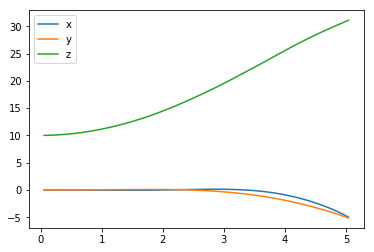

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.plot(results['time'], results['x'], label='x')
plt.plot(results['time'], results['y'], label='y')
plt.plot(results['time'], results['z'], label='z')
plt.legend()
_ = plt.ylim()

The next code cell visualizes the velocity of the quadcopter.

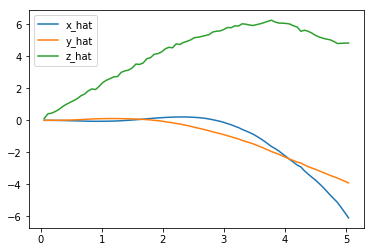

In [4]:
plt.plot(results['time'], results['x_velocity'], label='x_hat')
plt.plot(results['time'], results['y_velocity'], label='y_hat')
plt.plot(results['time'], results['z_velocity'], label='z_hat')
plt.legend()
_ = plt.ylim()

Next, you can plot the Euler angles (the rotation of the quadcopter over the $x$-, $y$-, and $z$-axes),

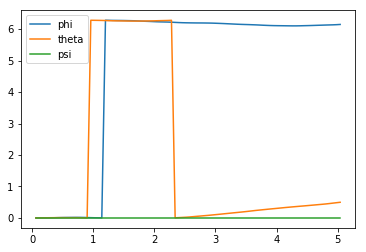

In [5]:
plt.plot(results['time'], results['phi'], label='phi')
plt.plot(results['time'], results['theta'], label='theta')
plt.plot(results['time'], results['psi'], label='psi')
plt.legend()
_ = plt.ylim()

before plotting the velocities (in radians per second) corresponding to each of the Euler angles.

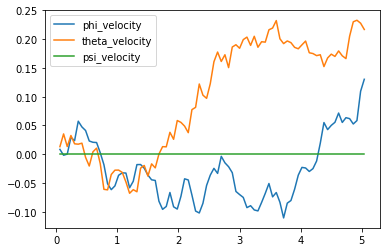

In [6]:
plt.plot(results['time'], results['phi_velocity'], label='phi_velocity')
plt.plot(results['time'], results['theta_velocity'], label='theta_velocity')
plt.plot(results['time'], results['psi_velocity'], label='psi_velocity')
plt.legend()
_ = plt.ylim()

Finally, you can use the code cell below to print the agent's choice of actions.  

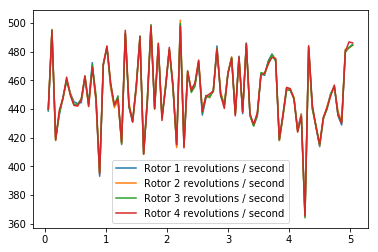

In [7]:
plt.plot(results['time'], results['rotor_speed1'], label='Rotor 1 revolutions / second')
plt.plot(results['time'], results['rotor_speed2'], label='Rotor 2 revolutions / second')
plt.plot(results['time'], results['rotor_speed3'], label='Rotor 3 revolutions / second')
plt.plot(results['time'], results['rotor_speed4'], label='Rotor 4 revolutions / second')
plt.legend()
_ = plt.ylim()

When specifying a task, you will derive the environment state from the simulator.  Run the code cell below to print the values of the following variables at the end of the simulation:
- `task.sim.pose` (the position of the quadcopter in ($x,y,z$) dimensions and the Euler angles),
- `task.sim.v` (the velocity of the quadcopter in ($x,y,z$) dimensions), and
- `task.sim.angular_v` (radians/second for each of the three Euler angles).

In [8]:
# the pose, velocity, and angular velocity of the quadcopter at the end of the episode
print(task.sim.pose)
print(task.sim.v)
print(task.sim.angular_v)

[ -4.97165101  -5.1110029   31.09420135   6.14817583   0.4970009    0.        ]
[-6.10657013 -3.913929    4.83157233]
[ 0.13015097  0.21661995  0.        ]


In the sample task in `task.py`, we use the 6-dimensional pose of the quadcopter to construct the state of the environment at each timestep.  However, when amending the task for your purposes, you are welcome to expand the size of the state vector by including the velocity information.  You can use any combination of the pose, velocity, and angular velocity - feel free to tinker here, and construct the state to suit your task.

## The Task

A sample task has been provided for you in `task.py`.  Open this file in a new window now. 

The `__init__()` method is used to initialize several variables that are needed to specify the task.  
- The simulator is initialized as an instance of the `PhysicsSim` class (from `physics_sim.py`).  
- Inspired by the methodology in the original DDPG paper, we make use of action repeats.  For each timestep of the agent, we step the simulation `action_repeats` timesteps.  If you are not familiar with action repeats, please read the **Results** section in [the DDPG paper](https://arxiv.org/abs/1509.02971).
- We set the number of elements in the state vector.  For the sample task, we only work with the 6-dimensional pose information.  To set the size of the state (`state_size`), we must take action repeats into account.  
- The environment will always have a 4-dimensional action space, with one entry for each rotor (`action_size=4`). You can set the minimum (`action_low`) and maximum (`action_high`) values of each entry here.
- The sample task in this provided file is for the agent to reach a target position.  We specify that target position as a variable.

The `reset()` method resets the simulator.  The agent should call this method every time the episode ends.  You can see an example of this in the code cell below.

The `step()` method is perhaps the most important.  It accepts the agent's choice of action `rotor_speeds`, which is used to prepare the next state to pass on to the agent.  Then, the reward is computed from `get_reward()`.  The episode is considered done if the time limit has been exceeded, or the quadcopter has travelled outside of the bounds of the simulation.

In the next section, you will learn how to test the performance of an agent on this task.

## The Agent

The sample agent given in `agents/policy_search.py` uses a very simplistic linear policy to directly compute the action vector as a dot product of the state vector and a matrix of weights. Then, it randomly perturbs the parameters by adding some Gaussian noise, to produce a different policy. Based on the average reward obtained in each episode (`score`), it keeps track of the best set of parameters found so far, how the score is changing, and accordingly tweaks a scaling factor to widen or tighten the noise.

Run the code cell below to see how the agent performs on the sample task.

In [20]:
import sys
import numpy as np
import pandas as pd
from agents.policy_search import PolicySearch_Agent
from task import Task
%reload_ext autoreload
%autoreload 2

num_episodes = 500

task = Task(init_pose=np.array([0., 0., 10, 0., 0., 0.]),
            init_velocities=np.array([0., 0., 0.]), 
            init_angle_velocities=np.array([0., 0., 0.]), 
            runtime=10., 
            target_pos=np.array([0., 0., 20.]),
           )

agent = PolicySearch_Agent(task) 

for i_episode in range(1, num_episodes+1):
    state = agent.reset_episode() # start a new episode
    while True:
        action = agent.act(state) 
        next_state, reward, done, _ = task.step(action)
        agent.step(reward, done)
        state = next_state
        if done:
            print("\rEpisode = {:4d}, score = {:7.3f} (best = {:7.3f}), noise_scale = {}".format(
                i_episode, agent.score, agent.best_score, agent.noise_scale), end="")  # [debug]
            break
    sys.stdout.flush()

Episode =  500, score =   4.426 (best =  15.314), noise_scale = 3.25

This agent should perform very poorly on this task.  And that's where you come in!

## Define the Task, Design the Agent, and Train Your Agent!

Amend `task.py` to specify a task of your choosing.  If you're unsure what kind of task to specify, you may like to teach your quadcopter to takeoff, hover in place, land softly, or reach a target pose.  

After specifying your task, use the sample agent in `agents/policy_search.py` as a template to define your own agent in `agents/agent.py`.  You can borrow whatever you need from the sample agent, including ideas on how you might modularize your code (using helper methods like `act()`, `learn()`, `reset_episode()`, etc.).

Note that it is **highly unlikely** that the first agent and task that you specify will learn well.  You will likely have to tweak various hyperparameters and the reward function for your task until you arrive at reasonably good behavior.

As you develop your agent, it's important to keep an eye on how it's performing. Use the code above as inspiration to build in a mechanism to log/save the total rewards obtained in each episode to file.  If the episode rewards are gradually increasing, this is an indication that your agent is learning.

Using TensorFlow backend.


New best training score.


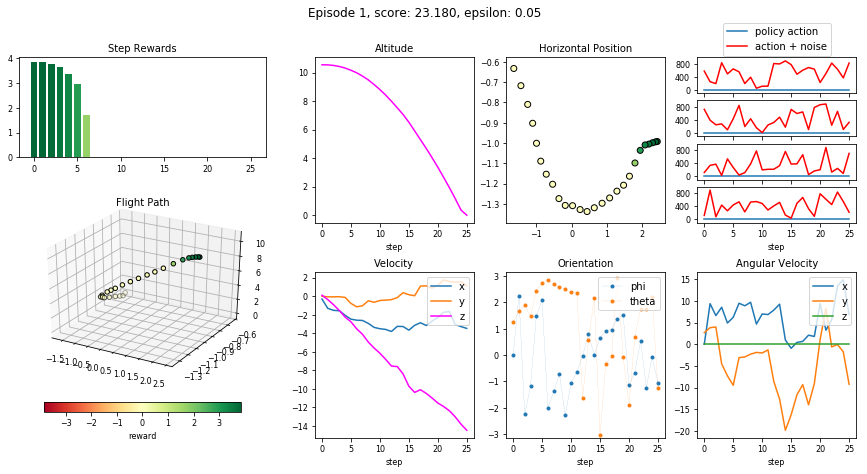

None

New best test score.


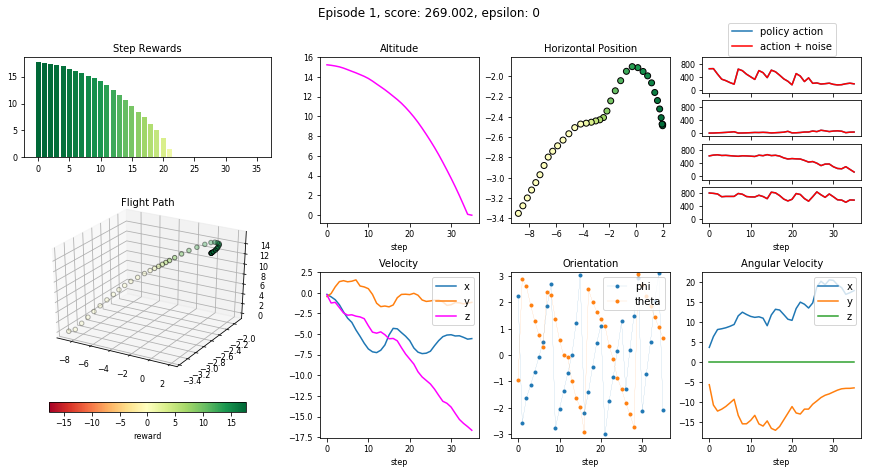

None

Episode 1 - epsilon:     0.05, memory size: 26, num steps: 26, training score:  23.18, test score: 269.00
Episode 2 - epsilon:     0.05, memory size: 55, num steps: 29, training score:   6.57, test score: 0.00
New best training score.


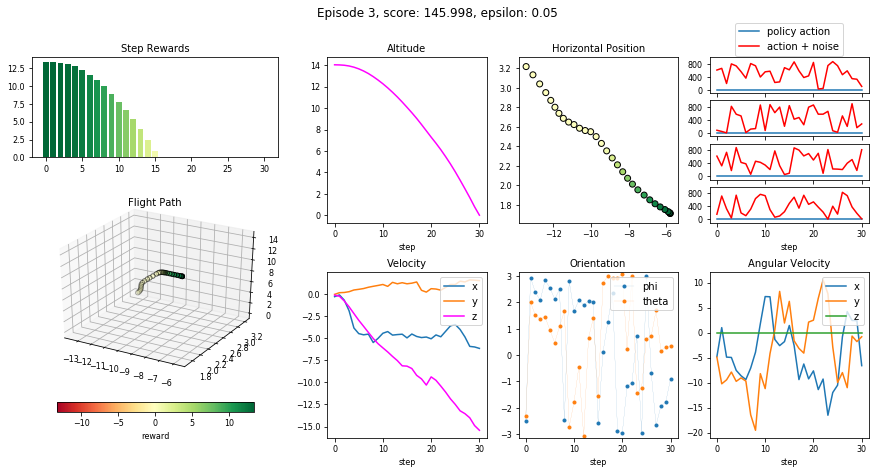

None

Episode 3 - epsilon:     0.05, memory size: 86, num steps: 31, training score: 146.00, test score: 54.86
Episode 4 - epsilon:     0.05, memory size: 110, num steps: 24, training score:   0.00, test score: 0.00
Episode 5 - epsilon:     0.05, memory size: 137, num steps: 27, training score:  72.79, test score: 91.84
New best training score.


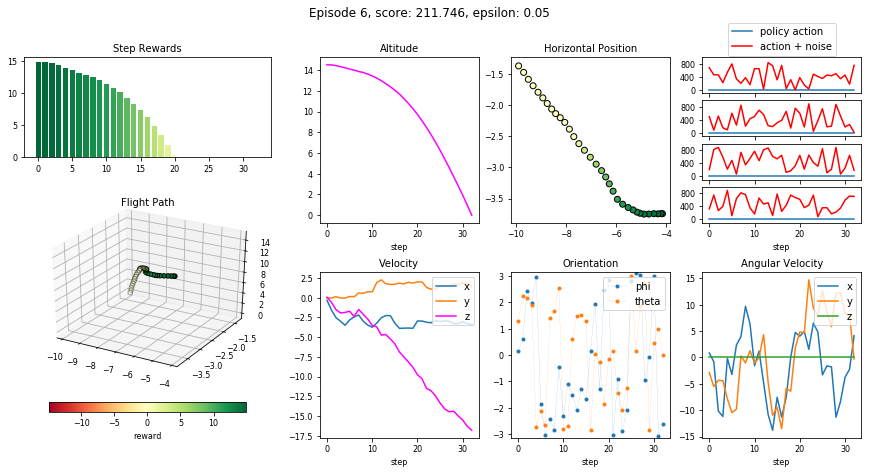

None

Episode 6 - epsilon:     0.05, memory size: 170, num steps: 33, training score: 211.75, test score: 111.36
Episode 7 - epsilon:     0.05, memory size: 198, num steps: 28, training score:  84.07, test score: 53.85
Episode 8 - epsilon:     0.05, memory size: 224, num steps: 26, training score:   0.00, test score: 19.11
Episode 9 - epsilon:     0.05, memory size: 248, num steps: 24, training score:  83.31, test score: 0.00


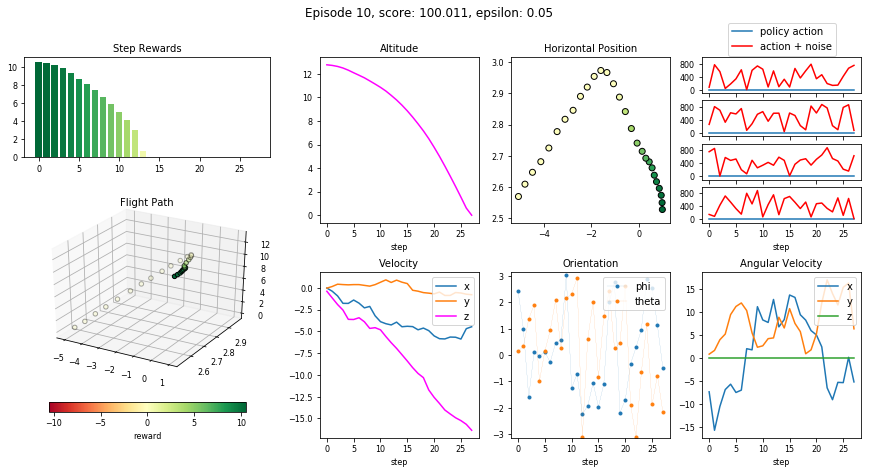

None

Episode 10 - epsilon:     0.05, memory size: 276, num steps: 28, training score: 100.01, test score: 0.00
Episode 11 - epsilon:     0.05, memory size: 307, num steps: 31, training score: 203.15, test score: 31.50
Episode 12 - epsilon:     0.05, memory size: 334, num steps: 27, training score:  24.29, test score: 29.34
Episode 13 - epsilon:     0.05, memory size: 355, num steps: 21, training score:   0.00, test score: 0.00
Episode 14 - epsilon:     0.05, memory size: 378, num steps: 23, training score:   0.00, test score: 0.00
Episode 15 - epsilon:     0.05, memory size: 400, num steps: 22, training score:   0.00, test score: 38.60
Episode 16 - epsilon:     0.05, memory size: 430, num steps: 30, training score: 133.71, test score: 140.87
Episode 17 - epsilon:     0.05, memory size: 455, num steps: 25, training score:   0.00, test score: 0.00
Episode 18 - epsilon:     0.05, memory size: 480, num steps: 25, training score:  49.36, test score: 0.00
Episode 19 - epsilon:     0.05, memory si

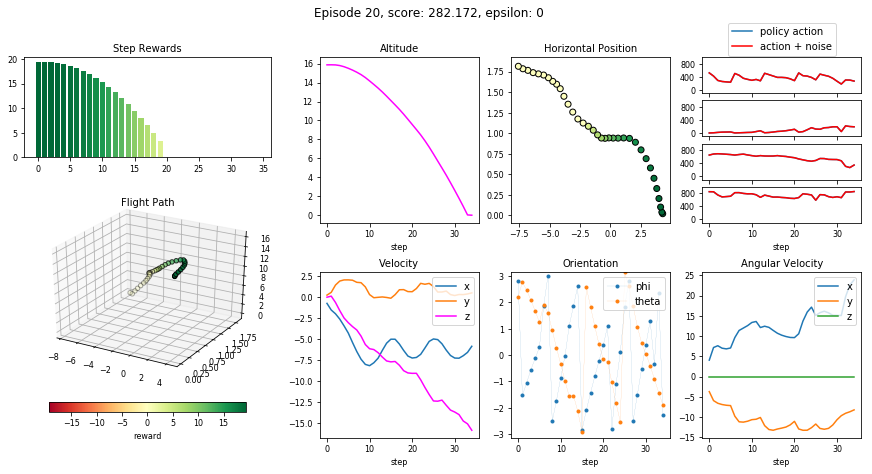

None

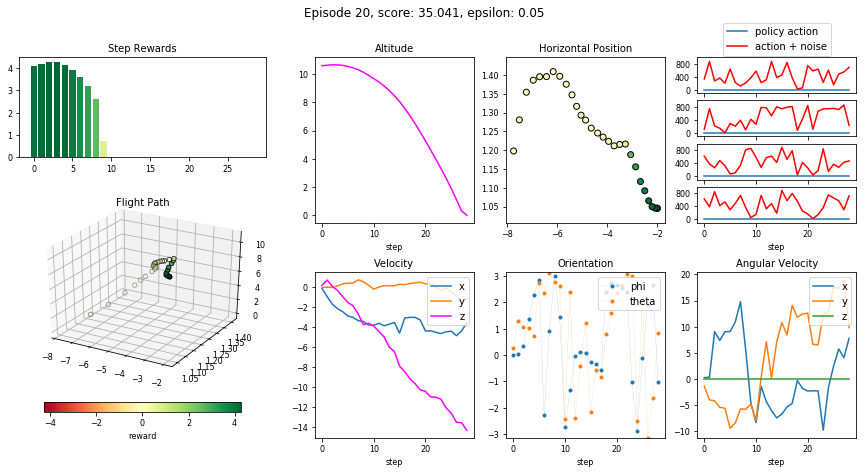

None

Episode 20 - epsilon:     0.05, memory size: 524, num steps: 29, training score:  35.04, test score: 282.17
Episode 21 - epsilon:     0.05, memory size: 549, num steps: 25, training score:  22.48, test score: 14.75
Episode 22 - epsilon:     0.05, memory size: 576, num steps: 27, training score:  51.63, test score: 0.00
Episode 23 - epsilon:     0.05, memory size: 596, num steps: 20, training score:   0.00, test score: 35.87
Episode 24 - epsilon:     0.05, memory size: 621, num steps: 25, training score:   0.00, test score: 176.35
New best training score.


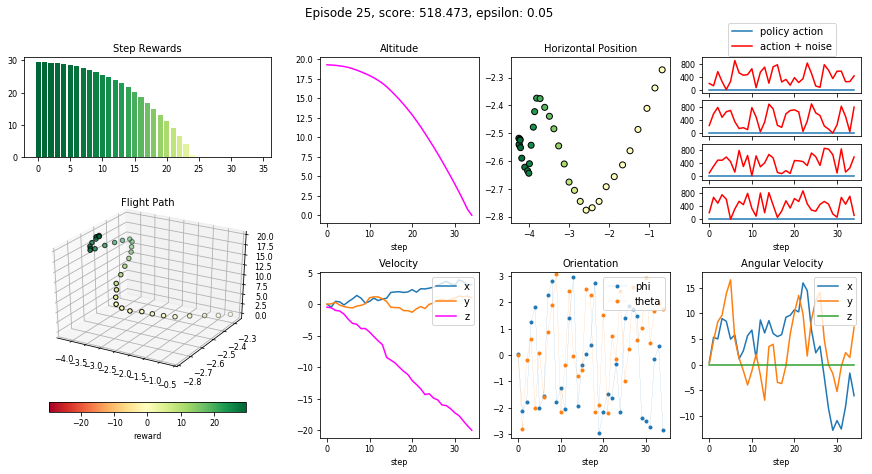

None

Episode 25 - epsilon:     0.05, memory size: 656, num steps: 35, training score: 518.47, test score: 0.00
Episode 26 - epsilon:     0.05, memory size: 684, num steps: 28, training score:  38.78, test score: 73.12
Episode 27 - epsilon:     0.05, memory size: 709, num steps: 25, training score:   0.00, test score: 48.66
Episode 28 - epsilon:     0.05, memory size: 720, num steps: 11, training score:   0.00, test score: 22.01
Episode 29 - epsilon:     0.05, memory size: 748, num steps: 28, training score:  29.34, test score: 0.00


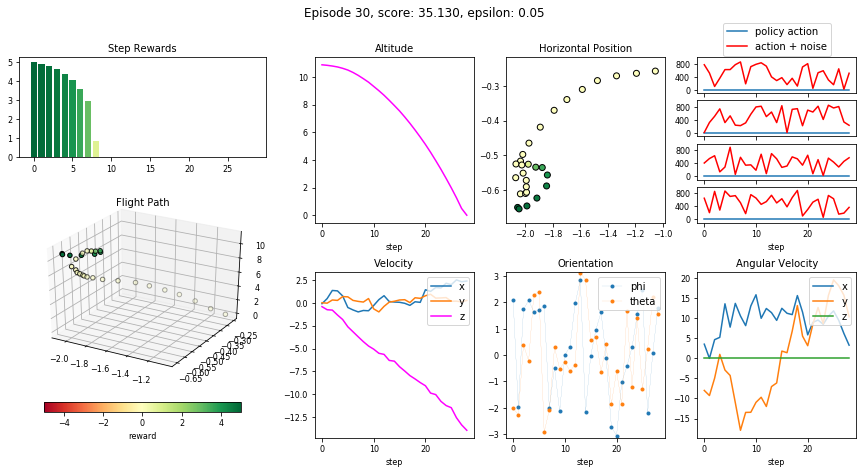

None

Episode 30 - epsilon:     0.05, memory size: 777, num steps: 29, training score:  35.13, test score: 88.42
Episode 31 - epsilon:     0.05, memory size: 801, num steps: 24, training score:   0.00, test score: 0.00
New best test score.


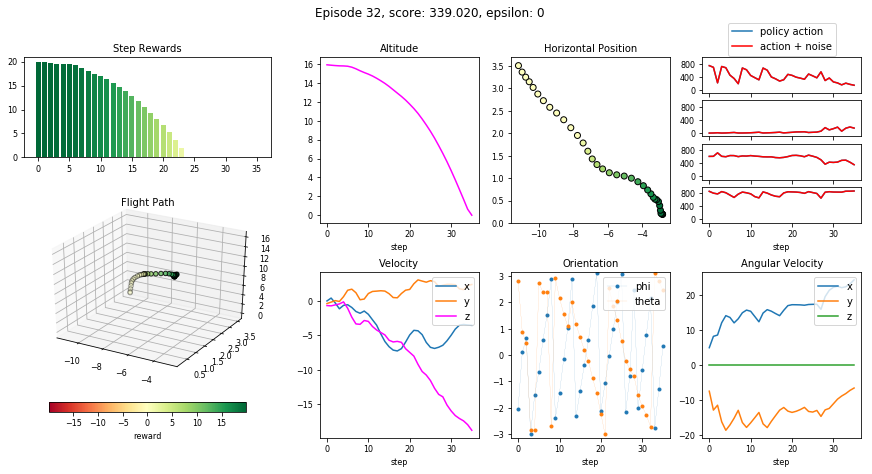

None

Episode 32 - epsilon:     0.05, memory size: 822, num steps: 21, training score:   0.00, test score: 339.02
Episode 33 - epsilon:     0.05, memory size: 856, num steps: 34, training score: 208.14, test score: 91.99
Episode 34 - epsilon:     0.05, memory size: 878, num steps: 22, training score:   0.00, test score: 38.33
Episode 35 - epsilon:     0.05, memory size: 902, num steps: 24, training score:  12.21, test score: 28.08
Episode 36 - epsilon:     0.05, memory size: 930, num steps: 28, training score: 124.02, test score: 183.86
Episode 37 - epsilon:     0.05, memory size: 957, num steps: 27, training score:  38.25, test score: 125.96
Episode 38 - epsilon:     0.05, memory size: 983, num steps: 26, training score:   0.00, test score: 32.77
Episode 39 - epsilon:     0.05, memory size: 1009, num steps: 26, training score:  85.92, test score: 0.00


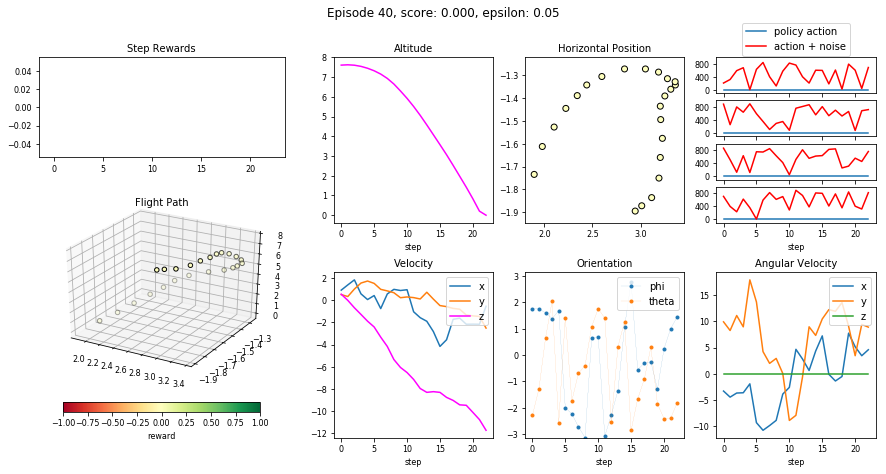

None

Episode 40 - epsilon:     0.05, memory size: 1032, num steps: 23, training score:   0.00, test score: 0.00
Episode 41 - epsilon:     0.05, memory size: 1052, num steps: 20, training score:   0.00, test score: 0.00
Episode 42 - epsilon:     0.05, memory size: 1079, num steps: 27, training score:   0.00, test score: 24.60
Episode 43 - epsilon:     0.05, memory size: 1102, num steps: 23, training score:   0.00, test score: 68.50
Episode 44 - epsilon:     0.05, memory size: 1127, num steps: 25, training score:   0.00, test score: 13.75
Episode 45 - epsilon:     0.05, memory size: 1155, num steps: 28, training score:  91.69, test score: 0.00
Episode 46 - epsilon:     0.05, memory size: 1174, num steps: 19, training score:   0.00, test score: 0.00
Episode 47 - epsilon:     0.05, memory size: 1202, num steps: 28, training score:  24.62, test score: 0.00
Episode 48 - epsilon:     0.05, memory size: 1220, num steps: 18, training score:   0.00, test score: 127.30
Episode 49 - epsilon:     0.05, 

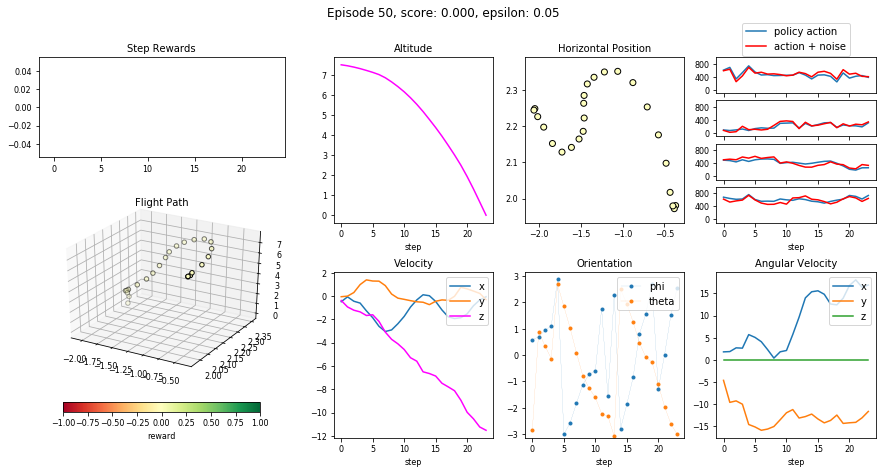

None

Episode 50 - epsilon:     0.05, memory size: 1272, num steps: 24, training score:   0.00, test score: 0.00
Episode 51 - epsilon:     0.05, memory size: 1295, num steps: 23, training score:  12.20, test score: 271.34
Episode 52 - epsilon:     0.05, memory size: 1320, num steps: 25, training score:  85.63, test score: 18.20
Episode 53 - epsilon:     0.05, memory size: 1345, num steps: 25, training score:  79.77, test score: 0.00
Episode 54 - epsilon:     0.05, memory size: 1370, num steps: 25, training score:  79.50, test score: 145.04
Episode 55 - epsilon:     0.05, memory size: 1392, num steps: 22, training score:   0.00, test score: 0.00
Episode 56 - epsilon:     0.05, memory size: 1422, num steps: 30, training score:   0.00, test score: 68.88
Episode 57 - epsilon:     0.05, memory size: 1442, num steps: 20, training score:   0.00, test score: 0.00
Episode 58 - epsilon:     0.05, memory size: 1470, num steps: 28, training score:   0.00, test score: 0.00
Episode 59 - epsilon:     0.05,

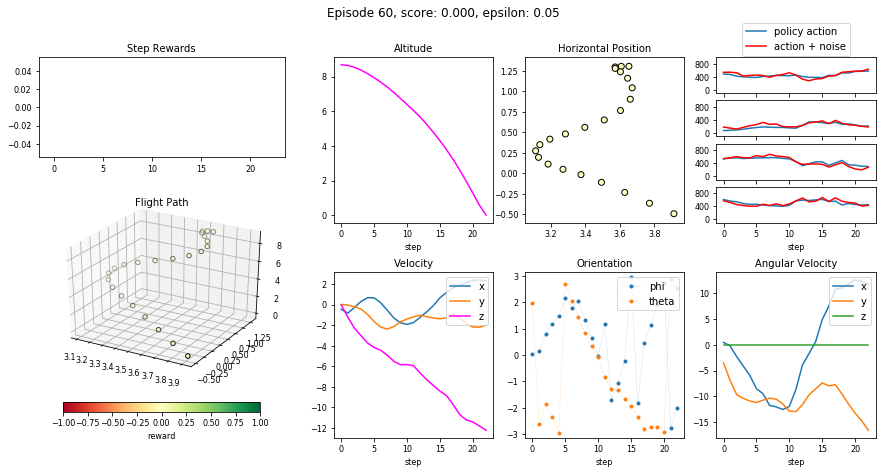

None

Episode 60 - epsilon:     0.05, memory size: 1511, num steps: 23, training score:   0.00, test score: 0.00
Episode 61 - epsilon:     0.05, memory size: 1532, num steps: 21, training score:   0.00, test score: 70.89
Episode 62 - epsilon:     0.05, memory size: 1553, num steps: 21, training score:   0.00, test score: 48.50
Episode 63 - epsilon:     0.05, memory size: 1581, num steps: 28, training score: 150.00, test score: 0.00
Episode 64 - epsilon:     0.05, memory size: 1611, num steps: 30, training score: 185.66, test score: 0.00
Episode 65 - epsilon:     0.05, memory size: 1630, num steps: 19, training score:   0.00, test score: 0.00
Episode 66 - epsilon:     0.05, memory size: 1645, num steps: 15, training score:   0.00, test score: 0.00
Episode 67 - epsilon:     0.05, memory size: 1673, num steps: 28, training score:   0.00, test score: 0.00
Episode 68 - epsilon:     0.05, memory size: 1703, num steps: 30, training score: 200.47, test score: 0.00
Episode 69 - epsilon:     0.05, mem

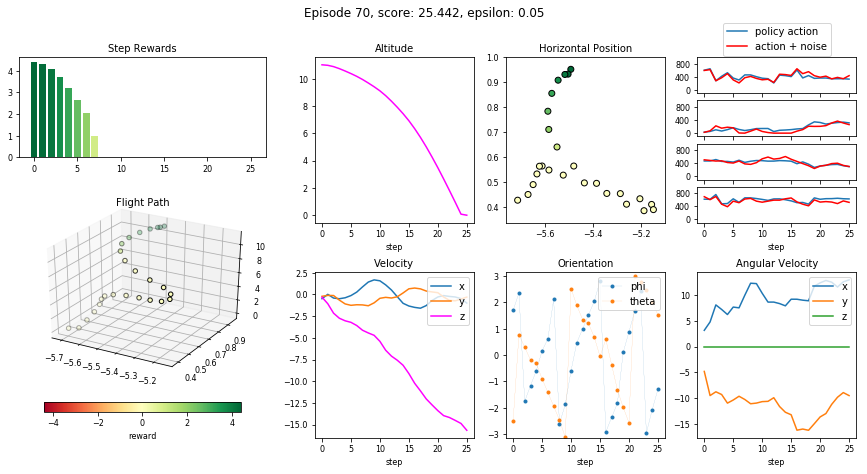

None

Episode 70 - epsilon:     0.05, memory size: 1752, num steps: 26, training score:  25.44, test score: 0.00
Episode 71 - epsilon:     0.05, memory size: 1779, num steps: 27, training score:  43.67, test score: 0.00
Episode 72 - epsilon:     0.05, memory size: 1806, num steps: 27, training score:  15.41, test score: 62.05
New best test score.


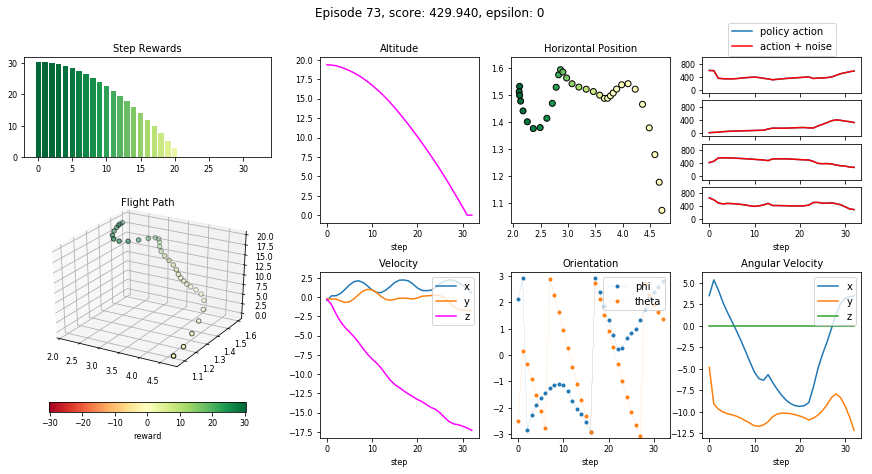

None

Episode 73 - epsilon:     0.05, memory size: 1824, num steps: 18, training score:   0.00, test score: 429.94
Episode 74 - epsilon:     0.05, memory size: 1857, num steps: 33, training score:   0.00, test score: 31.37
Episode 75 - epsilon:     0.05, memory size: 1882, num steps: 25, training score:  93.13, test score: 41.27
Episode 76 - epsilon:     0.05, memory size: 1907, num steps: 25, training score:  66.43, test score: 60.88
Episode 77 - epsilon:     0.05, memory size: 1928, num steps: 21, training score:   0.00, test score: 0.00
Episode 78 - epsilon:     0.05, memory size: 1958, num steps: 30, training score: 135.50, test score: 37.12
Episode 79 - epsilon:     0.05, memory size: 1989, num steps: 31, training score: 225.37, test score: 0.00


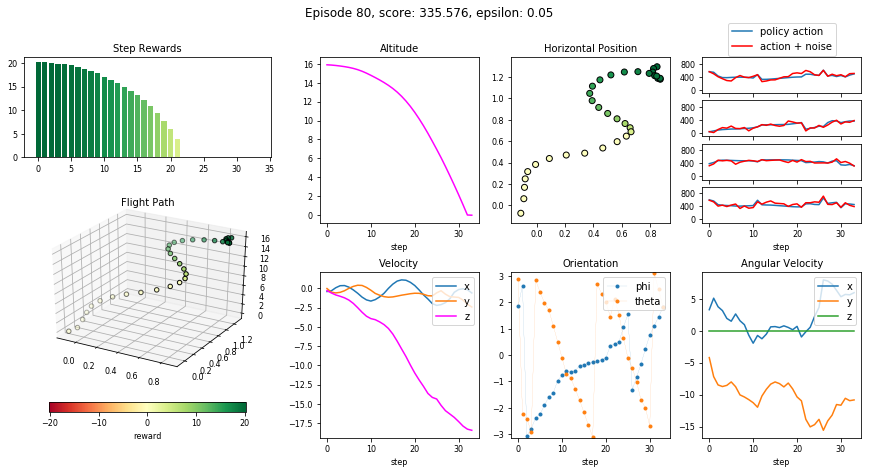

None

Episode 80 - epsilon:     0.05, memory size: 2023, num steps: 34, training score: 335.58, test score: 23.97
Episode 81 - epsilon:     0.05, memory size: 2046, num steps: 23, training score:   0.00, test score: 0.00
Episode 82 - epsilon:     0.05, memory size: 2073, num steps: 27, training score:   0.00, test score: 0.00
Episode 83 - epsilon:     0.05, memory size: 2096, num steps: 23, training score:  27.79, test score: 0.00
Episode 84 - epsilon:     0.05, memory size: 2121, num steps: 25, training score:   0.00, test score: 0.00
Episode 85 - epsilon:     0.05, memory size: 2143, num steps: 22, training score:   0.00, test score: 175.10
Episode 86 - epsilon:     0.05, memory size: 2166, num steps: 23, training score:   0.00, test score: 0.00
Episode 87 - epsilon:     0.05, memory size: 2187, num steps: 21, training score:   0.00, test score: 0.00
Episode 88 - epsilon:     0.05, memory size: 2216, num steps: 29, training score:  58.51, test score: 0.00
Episode 89 - epsilon:     0.05, me

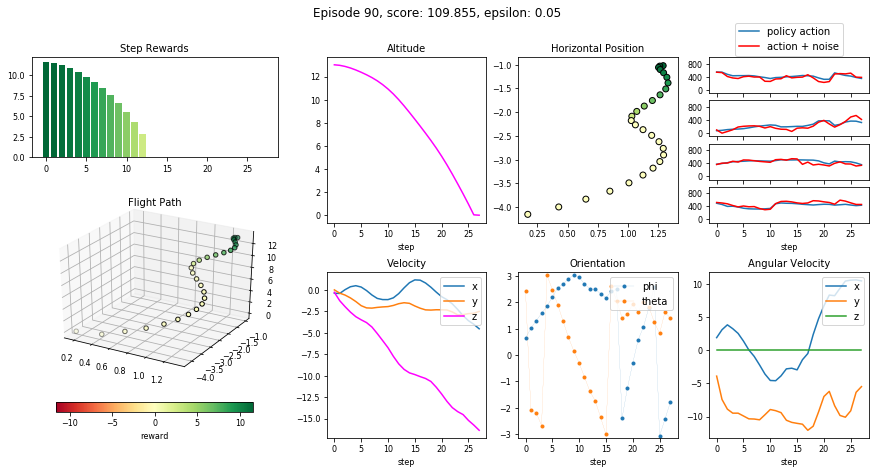

None

Episode 90 - epsilon:     0.05, memory size: 2272, num steps: 28, training score: 109.86, test score: 19.57
Episode 91 - epsilon:     0.05, memory size: 2302, num steps: 30, training score: 232.17, test score: 64.74
Episode 92 - epsilon:     0.05, memory size: 2337, num steps: 35, training score: 338.27, test score: 67.26
Episode 93 - epsilon:     0.05, memory size: 2364, num steps: 27, training score: 231.25, test score: 0.00
Episode 94 - epsilon:     0.05, memory size: 2391, num steps: 27, training score:  55.80, test score: 196.86
Episode 95 - epsilon:     0.05, memory size: 2418, num steps: 27, training score:   0.00, test score: 0.00
Episode 96 - epsilon:     0.05, memory size: 2445, num steps: 27, training score:  11.17, test score: 90.97
Episode 97 - epsilon:     0.05, memory size: 2468, num steps: 23, training score:   0.00, test score: 74.43
Episode 98 - epsilon:     0.05, memory size: 2486, num steps: 18, training score:   0.00, test score: 0.00
Episode 99 - epsilon:     0.05

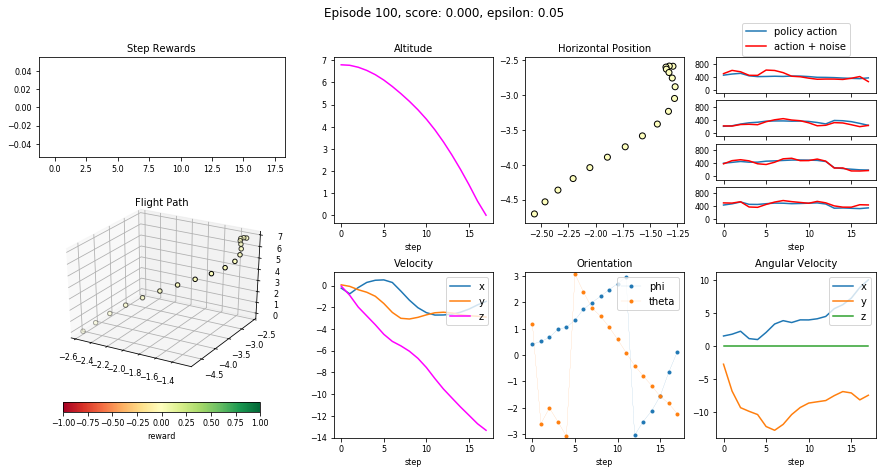

None

Episode 100 - epsilon:     0.05, memory size: 2529, num steps: 18, training score:   0.00, test score: 0.00
Episode 101 - epsilon:     0.05, memory size: 2560, num steps: 31, training score: 264.06, test score: 89.72
Episode 102 - epsilon:     0.05, memory size: 2583, num steps: 23, training score:   0.00, test score: 114.01
Episode 103 - epsilon:     0.05, memory size: 2614, num steps: 31, training score:  77.58, test score: 26.24
Episode 104 - epsilon:     0.05, memory size: 2640, num steps: 26, training score:  28.07, test score: 144.67
Episode 105 - epsilon:     0.05, memory size: 2666, num steps: 26, training score:  20.95, test score: 25.39
Episode 106 - epsilon:     0.05, memory size: 2690, num steps: 24, training score:   0.00, test score: 12.30
Episode 107 - epsilon:     0.05, memory size: 2713, num steps: 23, training score:   0.00, test score: 0.00
Episode 108 - epsilon:     0.05, memory size: 2737, num steps: 24, training score:   0.00, test score: 0.00
Episode 109 - epsilo

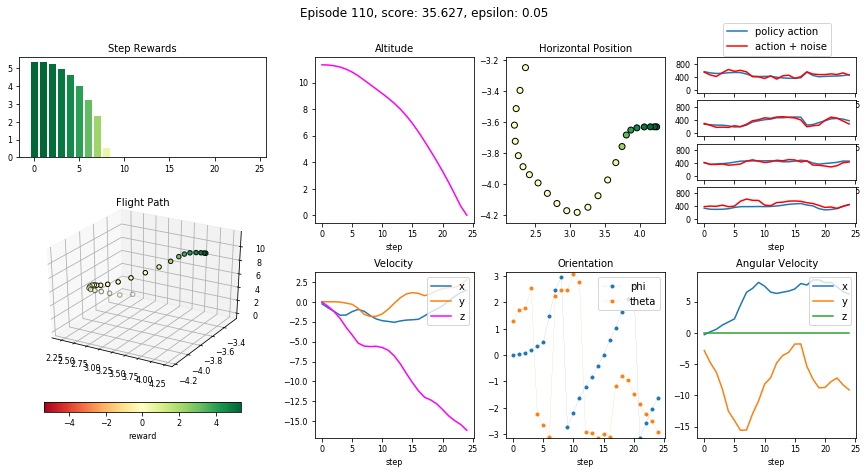

None

Episode 110 - epsilon:     0.05, memory size: 2794, num steps: 25, training score:  35.63, test score: 23.95
Episode 111 - epsilon:     0.05, memory size: 2814, num steps: 20, training score:   0.00, test score: 157.03
Episode 112 - epsilon:     0.05, memory size: 2841, num steps: 27, training score:  28.36, test score: 63.62
Episode 113 - epsilon:     0.05, memory size: 2868, num steps: 27, training score: 168.86, test score: 0.00
Episode 114 - epsilon:     0.05, memory size: 2895, num steps: 27, training score:   0.00, test score: 18.44
Episode 115 - epsilon:     0.05, memory size: 2916, num steps: 21, training score:   0.00, test score: 0.00
Episode 116 - epsilon:     0.05, memory size: 2945, num steps: 29, training score:  46.89, test score: 0.00
Episode 117 - epsilon:     0.05, memory size: 2974, num steps: 29, training score: 193.45, test score: 0.00
Episode 118 - epsilon:     0.05, memory size: 2992, num steps: 18, training score:   0.00, test score: 0.00
Episode 119 - epsilon: 

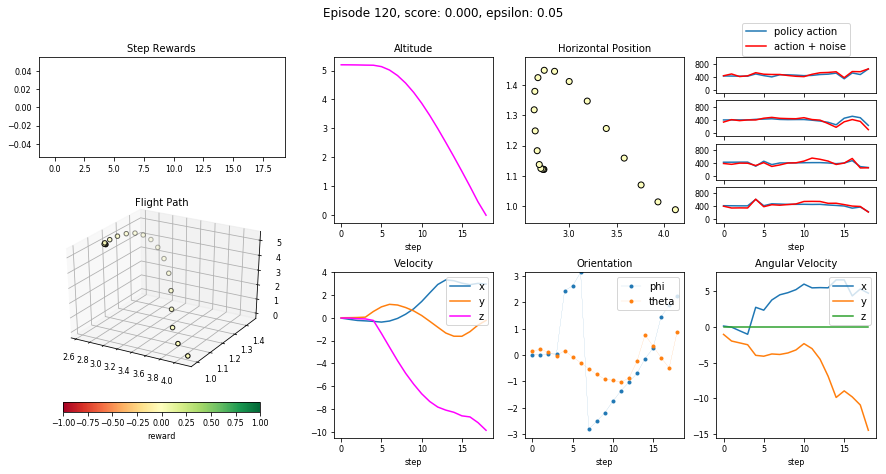

None

Episode 120 - epsilon:     0.05, memory size: 3029, num steps: 19, training score:   0.00, test score: 123.24
Episode 121 - epsilon:     0.05, memory size: 3052, num steps: 23, training score:   0.00, test score: 0.00
Episode 122 - epsilon:     0.05, memory size: 3077, num steps: 25, training score: 107.82, test score: 28.73
Episode 123 - epsilon:     0.05, memory size: 3103, num steps: 26, training score: 118.90, test score: 38.19
Episode 124 - epsilon:     0.05, memory size: 3136, num steps: 33, training score:   0.00, test score: 0.00
Episode 125 - epsilon:     0.05, memory size: 3163, num steps: 27, training score:  48.68, test score: 34.69
Episode 126 - epsilon:     0.05, memory size: 3193, num steps: 30, training score: 123.48, test score: 82.48
Episode 127 - epsilon:     0.05, memory size: 3219, num steps: 26, training score:  84.09, test score: 44.31
Episode 128 - epsilon:     0.05, memory size: 3250, num steps: 31, training score: 209.54, test score: 0.00
Episode 129 - epsilon

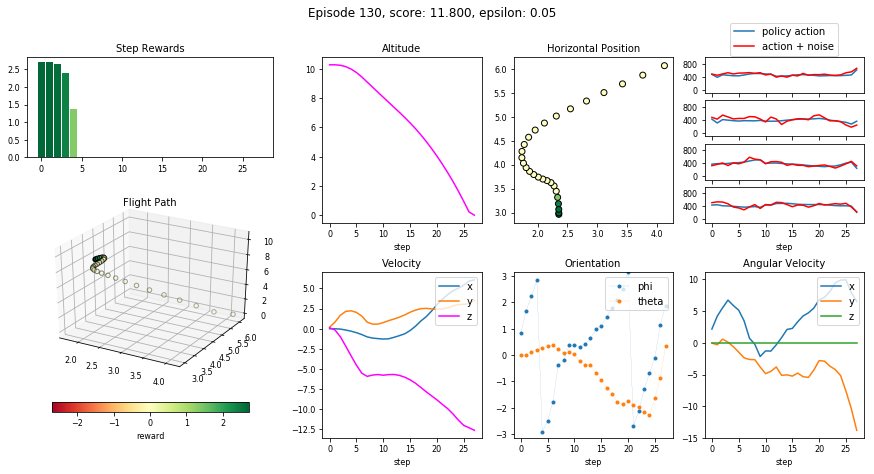

None

Episode 130 - epsilon:     0.05, memory size: 3306, num steps: 28, training score:  11.80, test score: 96.16
Episode 131 - epsilon:     0.05, memory size: 3337, num steps: 31, training score: 225.66, test score: 0.00
Episode 132 - epsilon:     0.05, memory size: 3357, num steps: 20, training score:   0.00, test score: 0.00
Episode 133 - epsilon:     0.05, memory size: 3380, num steps: 23, training score:   0.00, test score: 0.00
Episode 134 - epsilon:     0.05, memory size: 3408, num steps: 28, training score:  17.99, test score: 0.00
Episode 135 - epsilon:     0.05, memory size: 3437, num steps: 29, training score:  64.27, test score: 0.00
Episode 136 - epsilon:     0.05, memory size: 3465, num steps: 28, training score:  97.32, test score: 155.38
Episode 137 - epsilon:     0.05, memory size: 3493, num steps: 28, training score:  51.68, test score: 55.75
Episode 138 - epsilon:     0.05, memory size: 3522, num steps: 29, training score:  69.14, test score: 0.00
Episode 139 - epsilon:  

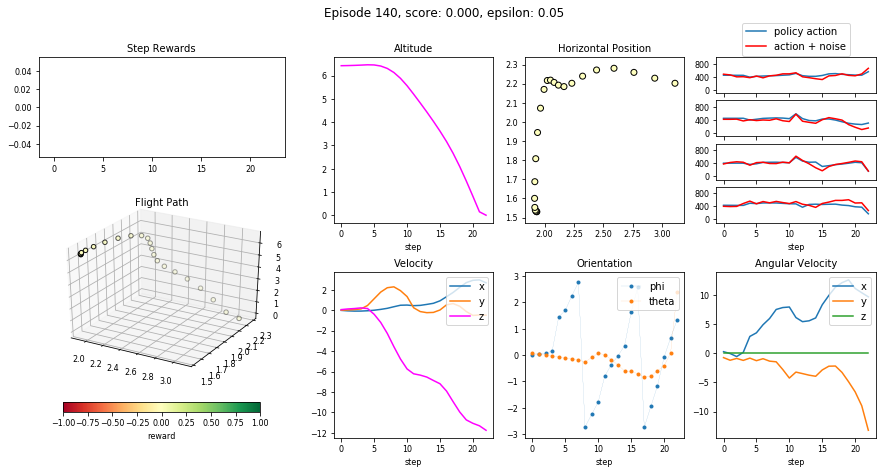

None

Episode 140 - epsilon:     0.05, memory size: 3570, num steps: 23, training score:   0.00, test score: 0.00
Episode 141 - epsilon:     0.05, memory size: 3602, num steps: 32, training score:  31.88, test score: 42.91
Episode 142 - epsilon:     0.05, memory size: 3625, num steps: 23, training score:   0.00, test score: 0.00
Episode 143 - epsilon:     0.05, memory size: 3657, num steps: 32, training score: 126.28, test score: 0.00
Episode 144 - epsilon:     0.05, memory size: 3693, num steps: 36, training score:   0.00, test score: 0.00
Episode 145 - epsilon:     0.05, memory size: 3724, num steps: 31, training score:  46.07, test score: 306.84
Episode 146 - epsilon:     0.05, memory size: 3757, num steps: 33, training score:   0.00, test score: 0.00
Episode 147 - epsilon:     0.05, memory size: 3794, num steps: 37, training score: 213.68, test score: 0.00
Episode 148 - epsilon:     0.05, memory size: 3827, num steps: 33, training score: 138.66, test score: 0.00
Episode 149 - epsilon:   

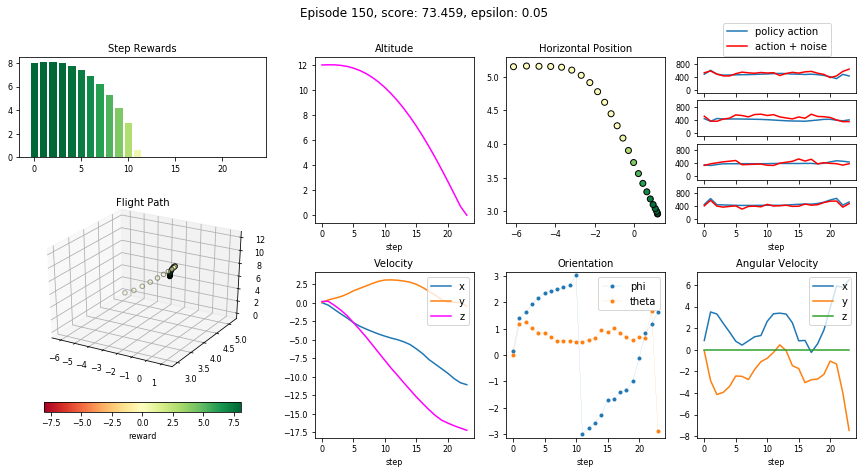

None

Episode 150 - epsilon:     0.05, memory size: 3880, num steps: 24, training score:  73.46, test score: 0.00
Episode 151 - epsilon:     0.05, memory size: 3904, num steps: 24, training score:   0.00, test score: 324.41
New best training score.


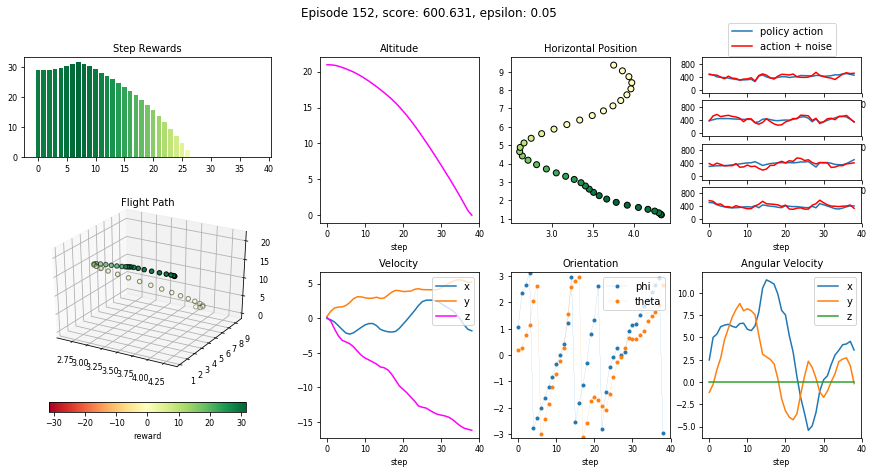

None

Episode 152 - epsilon:     0.05, memory size: 3943, num steps: 39, training score: 600.63, test score: 82.52
Episode 153 - epsilon:     0.05, memory size: 3972, num steps: 29, training score:  37.73, test score: 117.22
Episode 154 - epsilon:     0.05, memory size: 4003, num steps: 31, training score:  19.04, test score: 100.10
Episode 155 - epsilon:     0.05, memory size: 4027, num steps: 24, training score:   0.00, test score: 155.53
Episode 156 - epsilon:     0.05, memory size: 4059, num steps: 32, training score:   0.00, test score: 0.00
Episode 157 - epsilon:     0.05, memory size: 4088, num steps: 29, training score:  33.50, test score: 0.00
Episode 158 - epsilon:     0.05, memory size: 4114, num steps: 26, training score:  21.18, test score: 0.00
Episode 159 - epsilon:     0.05, memory size: 4145, num steps: 31, training score:  81.87, test score: 24.14


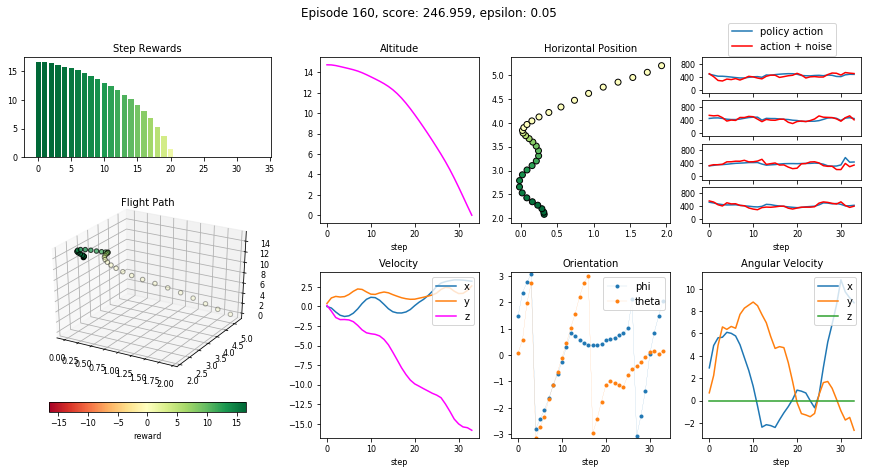

None

Episode 160 - epsilon:     0.05, memory size: 4179, num steps: 34, training score: 246.96, test score: 17.95
Episode 161 - epsilon:     0.05, memory size: 4205, num steps: 26, training score:   0.00, test score: 129.48
New best test score.


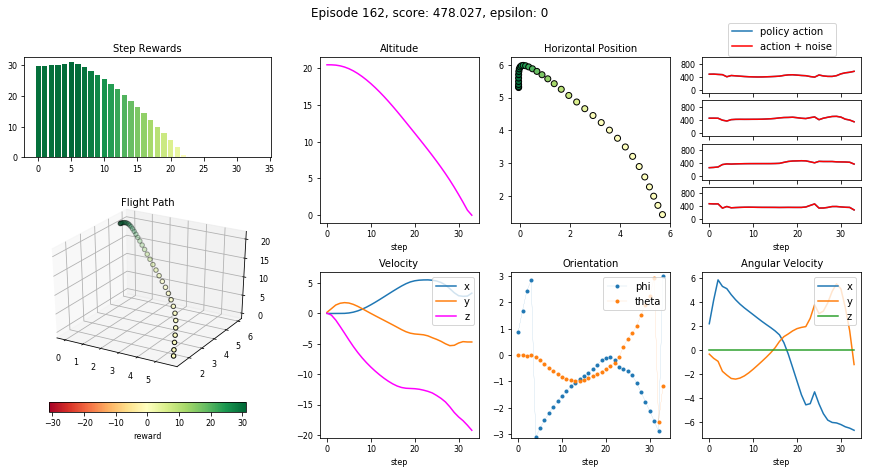

None

Episode 162 - epsilon:     0.05, memory size: 4235, num steps: 30, training score: 136.51, test score: 478.03
Episode 163 - epsilon:     0.05, memory size: 4265, num steps: 30, training score: 250.50, test score: 0.00
Episode 164 - epsilon:     0.05, memory size: 4289, num steps: 24, training score:   0.00, test score: 106.71
Episode 165 - epsilon:     0.05, memory size: 4318, num steps: 29, training score: 221.37, test score: 67.70
Episode 166 - epsilon:     0.05, memory size: 4344, num steps: 26, training score:  49.32, test score: 157.31
Episode 167 - epsilon:     0.05, memory size: 4376, num steps: 32, training score:   0.00, test score: 0.00
Episode 168 - epsilon:     0.05, memory size: 4405, num steps: 29, training score:  56.34, test score: 286.18
Episode 169 - epsilon:     0.05, memory size: 4433, num steps: 28, training score:   0.00, test score: 0.00


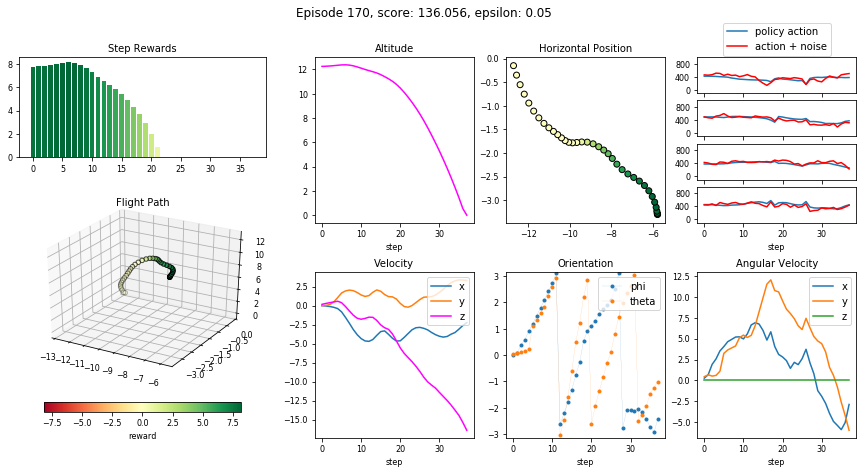

None

Episode 170 - epsilon:     0.05, memory size: 4471, num steps: 38, training score: 136.06, test score: 0.00
Episode 171 - epsilon:     0.05, memory size: 4492, num steps: 21, training score:   0.00, test score: 0.00
Episode 172 - epsilon:     0.05, memory size: 4524, num steps: 32, training score:   0.00, test score: 0.00
Episode 173 - epsilon:     0.05, memory size: 4551, num steps: 27, training score: 230.66, test score: 108.40
Episode 174 - epsilon:     0.05, memory size: 4577, num steps: 26, training score:   0.00, test score: 85.01
Episode 175 - epsilon:     0.05, memory size: 4607, num steps: 30, training score:   0.00, test score: 0.00
Episode 176 - epsilon:     0.05, memory size: 4640, num steps: 33, training score:   0.00, test score: 207.57
Episode 177 - epsilon:     0.05, memory size: 4663, num steps: 23, training score:   0.00, test score: 150.13
Episode 178 - epsilon:     0.05, memory size: 4690, num steps: 27, training score: 111.33, test score: 0.00
Episode 179 - epsilon

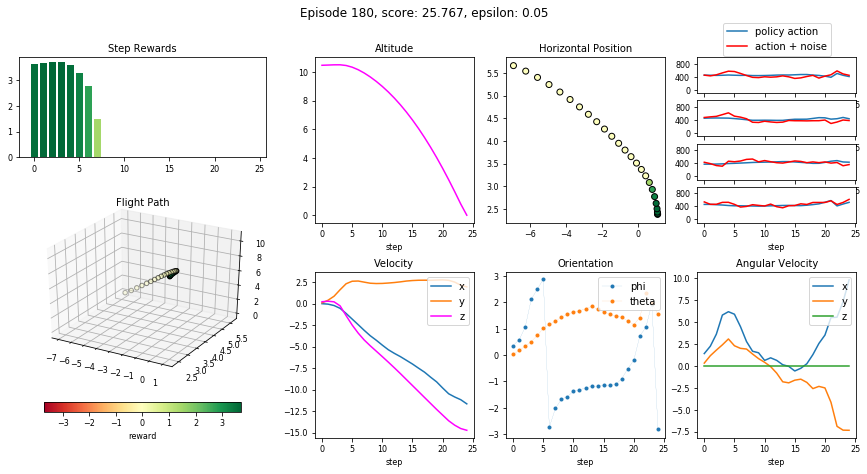

None

Episode 180 - epsilon:     0.05, memory size: 4746, num steps: 25, training score:  25.77, test score: 185.25
Episode 181 - epsilon:     0.05, memory size: 4773, num steps: 27, training score:   0.00, test score: 21.80
Episode 182 - epsilon:     0.05, memory size: 4807, num steps: 34, training score: 208.38, test score: 0.00
Episode 183 - epsilon:     0.05, memory size: 4830, num steps: 23, training score:   0.00, test score: 0.00
Episode 184 - epsilon:     0.05, memory size: 4856, num steps: 26, training score:   0.00, test score: 0.00
Episode 185 - epsilon:     0.05, memory size: 4881, num steps: 25, training score:  23.86, test score: 144.05
Episode 186 - epsilon:     0.05, memory size: 4915, num steps: 34, training score:  73.86, test score: 22.11
Episode 187 - epsilon:     0.05, memory size: 4943, num steps: 28, training score:  34.07, test score: 149.70
Episode 188 - epsilon:     0.05, memory size: 4972, num steps: 29, training score:   0.00, test score: 203.59
Episode 189 - epsi

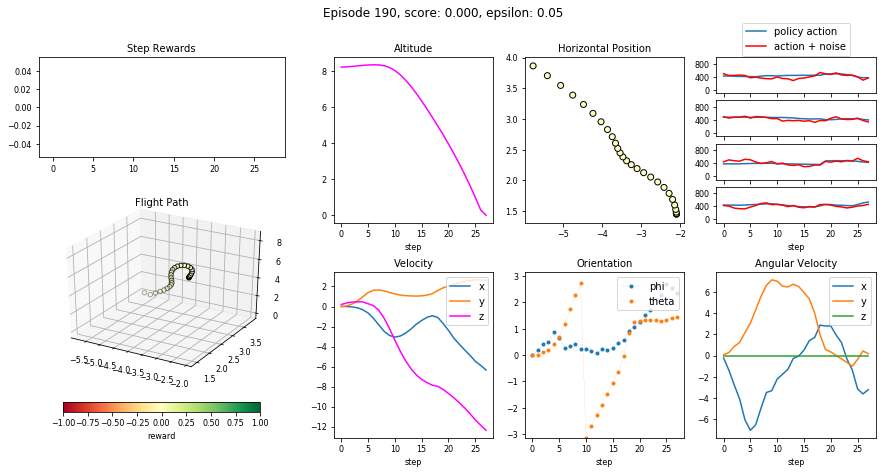

None

Episode 190 - epsilon:     0.05, memory size: 5027, num steps: 28, training score:   0.00, test score: 0.00
Episode 191 - epsilon:     0.05, memory size: 5057, num steps: 30, training score:  19.90, test score: 19.91
Episode 192 - epsilon:     0.05, memory size: 5085, num steps: 28, training score:   0.00, test score: 0.00
Episode 193 - epsilon:     0.05, memory size: 5109, num steps: 24, training score:  87.74, test score: 0.00
Episode 194 - epsilon:     0.05, memory size: 5137, num steps: 28, training score:  81.23, test score: 0.00
Episode 195 - epsilon:     0.05, memory size: 5164, num steps: 27, training score:   0.00, test score: 282.36
Episode 196 - epsilon:     0.05, memory size: 5192, num steps: 28, training score:   0.00, test score: 0.00
Episode 197 - epsilon:     0.05, memory size: 5223, num steps: 31, training score: 163.41, test score: 0.00
Episode 198 - epsilon:     0.05, memory size: 5250, num steps: 27, training score:  13.77, test score: 0.00
Episode 199 - epsilon:   

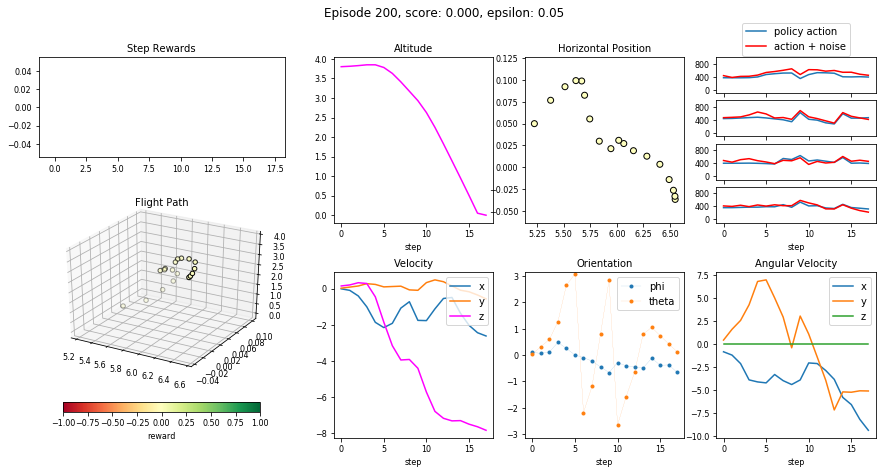

None

Episode 200 - epsilon:     0.05, memory size: 5301, num steps: 18, training score:   0.00, test score: 0.00
Episode 201 - epsilon:     0.05, memory size: 5326, num steps: 25, training score:   0.00, test score: 0.00
Episode 202 - epsilon:     0.05, memory size: 5357, num steps: 31, training score: 126.14, test score: 0.00
Episode 203 - epsilon:     0.05, memory size: 5384, num steps: 27, training score:  69.73, test score: 0.00
Episode 204 - epsilon:     0.05, memory size: 5416, num steps: 32, training score:  99.99, test score: 0.00
Episode 205 - epsilon:     0.05, memory size: 5439, num steps: 23, training score:   0.00, test score: 0.00
Episode 206 - epsilon:     0.05, memory size: 5465, num steps: 26, training score:   0.00, test score: 81.60
Episode 207 - epsilon:     0.05, memory size: 5494, num steps: 29, training score:   0.00, test score: 19.44
Episode 208 - epsilon:     0.05, memory size: 5522, num steps: 28, training score: 136.63, test score: 159.23
Episode 209 - epsilon:  

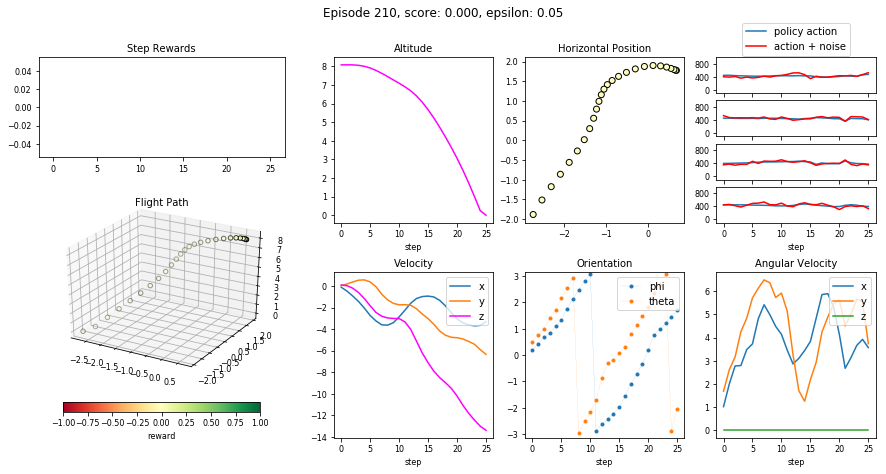

None

Episode 210 - epsilon:     0.05, memory size: 5580, num steps: 26, training score:   0.00, test score: 43.25
Episode 211 - epsilon:     0.05, memory size: 5607, num steps: 27, training score:  69.14, test score: 0.00
Episode 212 - epsilon:     0.05, memory size: 5633, num steps: 26, training score:   0.00, test score: 41.03
Episode 213 - epsilon:     0.05, memory size: 5660, num steps: 27, training score:   0.00, test score: 0.00
Episode 214 - epsilon:     0.05, memory size: 5695, num steps: 35, training score: 182.92, test score: 0.00
Episode 215 - epsilon:     0.05, memory size: 5714, num steps: 19, training score:   0.00, test score: 0.00
Episode 216 - epsilon:     0.05, memory size: 5754, num steps: 40, training score: 121.41, test score: 82.00
Episode 217 - epsilon:     0.05, memory size: 5780, num steps: 26, training score: 123.30, test score: 0.00
Episode 218 - epsilon:     0.05, memory size: 5805, num steps: 25, training score:   0.00, test score: 0.00
Episode 219 - epsilon:   

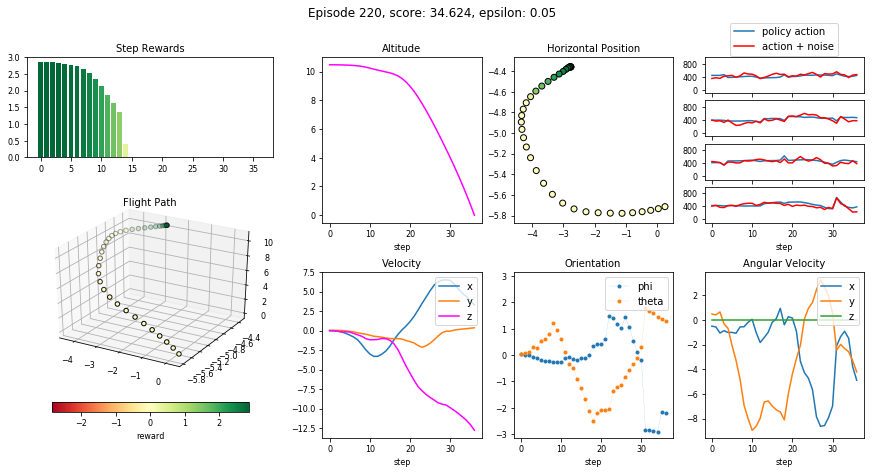

None

Episode 220 - epsilon:     0.05, memory size: 5868, num steps: 37, training score:  34.62, test score: 102.78
Episode 221 - epsilon:     0.05, memory size: 5898, num steps: 30, training score: 108.27, test score: 97.52
Episode 222 - epsilon:     0.05, memory size: 5928, num steps: 30, training score:   0.00, test score: 211.40
Episode 223 - epsilon:     0.05, memory size: 5959, num steps: 31, training score: 249.58, test score: 96.00
Episode 224 - epsilon:     0.05, memory size: 5989, num steps: 30, training score:  76.62, test score: 0.00
Episode 225 - epsilon:     0.05, memory size: 6006, num steps: 17, training score:   0.00, test score: 58.76
Episode 226 - epsilon:     0.05, memory size: 6032, num steps: 26, training score:  30.91, test score: 0.00
Episode 227 - epsilon:     0.05, memory size: 6062, num steps: 30, training score:  37.89, test score: 51.56
Episode 228 - epsilon:     0.05, memory size: 6091, num steps: 29, training score: 262.45, test score: 13.37
Episode 229 - epsil

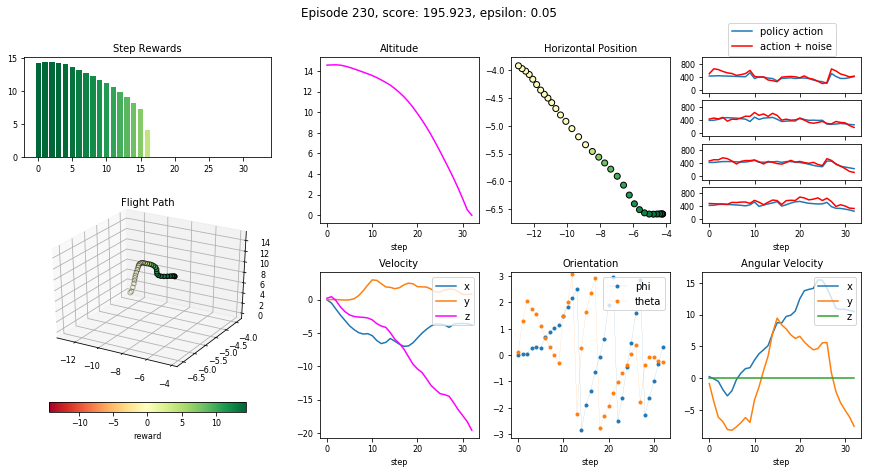

None

Episode 230 - epsilon:     0.05, memory size: 6151, num steps: 33, training score: 195.92, test score: 0.00
Episode 231 - epsilon:     0.05, memory size: 6180, num steps: 29, training score:  55.23, test score: 0.00
Episode 232 - epsilon:     0.05, memory size: 6205, num steps: 25, training score:   0.00, test score: 0.00
Episode 233 - epsilon:     0.05, memory size: 6242, num steps: 37, training score:   0.00, test score: 0.00
Episode 234 - epsilon:     0.05, memory size: 6267, num steps: 25, training score:   0.00, test score: 0.00
Episode 235 - epsilon:     0.05, memory size: 6300, num steps: 33, training score:  74.92, test score: 41.60
Episode 236 - epsilon:     0.05, memory size: 6335, num steps: 35, training score:   0.00, test score: 354.34
Episode 237 - epsilon:     0.05, memory size: 6358, num steps: 23, training score:   0.00, test score: 0.00
Episode 238 - epsilon:     0.05, memory size: 6386, num steps: 28, training score:   0.00, test score: 219.99
Episode 239 - epsilon: 

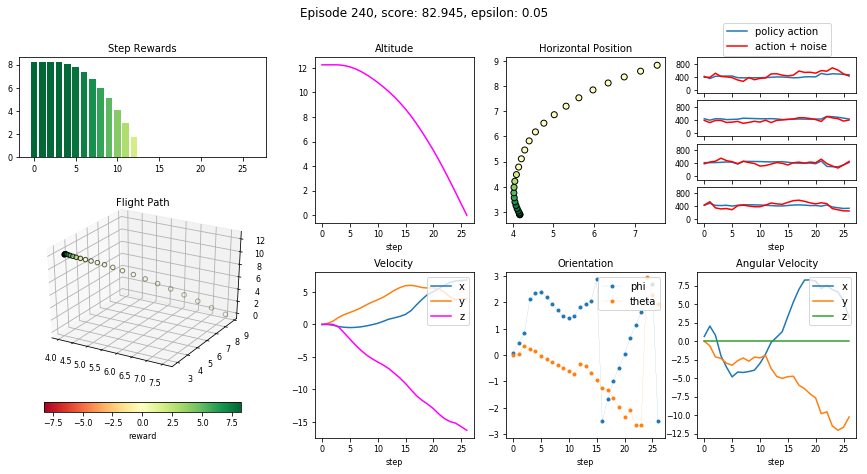

None

Episode 240 - epsilon:     0.05, memory size: 6445, num steps: 27, training score:  82.95, test score: 367.73
Episode 241 - epsilon:     0.05, memory size: 6480, num steps: 35, training score:  53.22, test score: 24.14
Episode 242 - epsilon:     0.05, memory size: 6509, num steps: 29, training score:   0.00, test score: 55.04
Episode 243 - epsilon:     0.05, memory size: 6542, num steps: 33, training score: 158.84, test score: 0.00
Episode 244 - epsilon:     0.05, memory size: 6570, num steps: 28, training score:  42.32, test score: 104.78
Episode 245 - epsilon:     0.05, memory size: 6594, num steps: 24, training score:   0.00, test score: 0.00
Episode 246 - epsilon:     0.05, memory size: 6619, num steps: 25, training score:   0.00, test score: 0.00
Episode 247 - epsilon:     0.05, memory size: 6635, num steps: 16, training score:   0.00, test score: 118.83
Episode 248 - epsilon:     0.05, memory size: 6662, num steps: 27, training score:  60.59, test score: 0.00
Episode 249 - epsilo

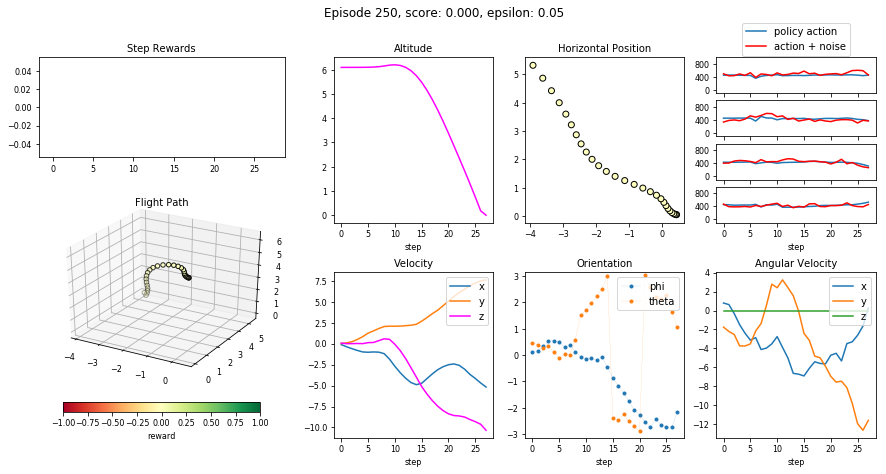

None

Episode 250 - epsilon:     0.05, memory size: 6709, num steps: 28, training score:   0.00, test score: 6.85
Episode 251 - epsilon:     0.05, memory size: 6738, num steps: 29, training score: 127.93, test score: 0.00
Episode 252 - epsilon:     0.05, memory size: 6765, num steps: 27, training score: 207.70, test score: 0.00
Episode 253 - epsilon:     0.05, memory size: 6795, num steps: 30, training score: 245.60, test score: 110.41
Episode 254 - epsilon:     0.05, memory size: 6824, num steps: 29, training score:   0.00, test score: 77.93
New best test score.


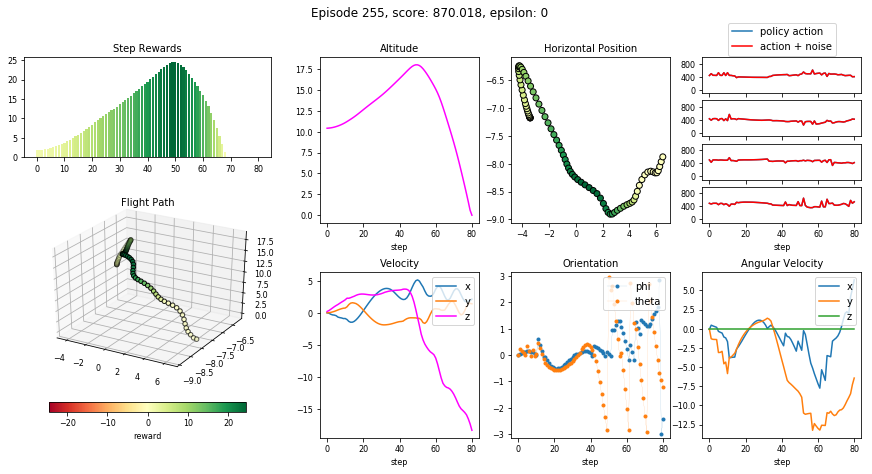

None

Episode 255 - epsilon:     0.05, memory size: 6859, num steps: 35, training score: 130.76, test score: 870.02
Episode 256 - epsilon:     0.05, memory size: 6892, num steps: 33, training score:  44.16, test score: 0.00
Episode 257 - epsilon:     0.05, memory size: 6913, num steps: 21, training score:   0.00, test score: 222.85
Episode 258 - epsilon:     0.05, memory size: 6941, num steps: 28, training score:  31.46, test score: 417.07
Episode 259 - epsilon:     0.05, memory size: 6974, num steps: 33, training score: 220.68, test score: 60.41


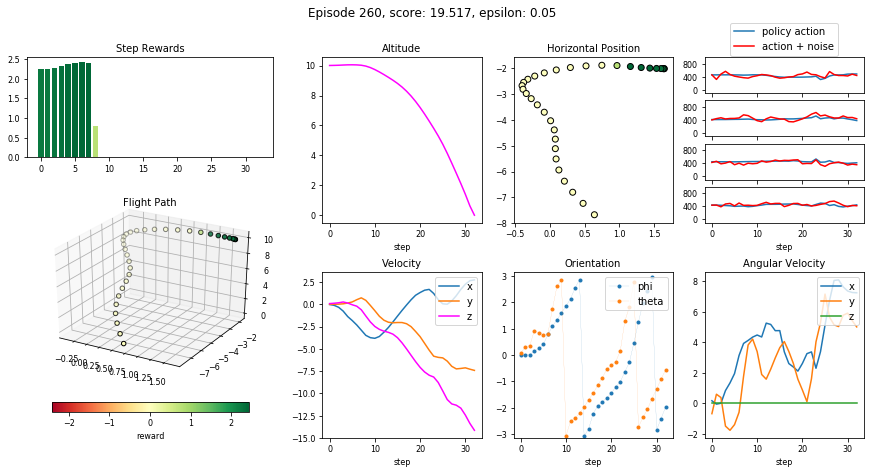

None

Episode 260 - epsilon:     0.05, memory size: 7007, num steps: 33, training score:  19.52, test score: 0.00
Episode 261 - epsilon:     0.05, memory size: 7043, num steps: 36, training score: 272.03, test score: 33.22
Episode 262 - epsilon:     0.05, memory size: 7066, num steps: 23, training score:   0.00, test score: 0.00
Episode 263 - epsilon:     0.05, memory size: 7093, num steps: 27, training score: 195.18, test score: 0.00
Episode 264 - epsilon:     0.05, memory size: 7120, num steps: 27, training score:  15.77, test score: 0.00
Episode 265 - epsilon:     0.05, memory size: 7153, num steps: 33, training score:  10.04, test score: 46.73
Episode 266 - epsilon:     0.05, memory size: 7178, num steps: 25, training score:   0.00, test score: 39.79
Episode 267 - epsilon:     0.05, memory size: 7201, num steps: 23, training score:   0.00, test score: 561.77
Episode 268 - epsilon:     0.05, memory size: 7227, num steps: 26, training score:  10.22, test score: 0.00
Episode 269 - epsilon: 

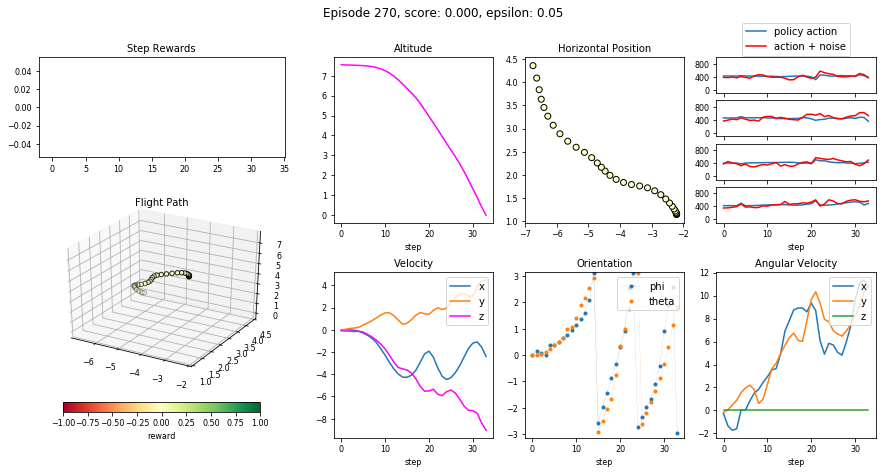

None

Episode 270 - epsilon:     0.05, memory size: 7287, num steps: 34, training score:   0.00, test score: 17.29
Episode 271 - epsilon:     0.05, memory size: 7320, num steps: 33, training score:  21.33, test score: 171.66
Episode 272 - epsilon:     0.05, memory size: 7342, num steps: 22, training score:   0.00, test score: 178.07
Episode 273 - epsilon:     0.05, memory size: 7363, num steps: 21, training score:   0.00, test score: 0.00
Episode 274 - epsilon:     0.05, memory size: 7393, num steps: 30, training score:   0.00, test score: 0.00
Episode 275 - epsilon:     0.05, memory size: 7422, num steps: 29, training score:   0.00, test score: 0.00
Episode 276 - epsilon:     0.05, memory size: 7441, num steps: 19, training score:   0.00, test score: 0.00
Episode 277 - epsilon:     0.05, memory size: 7472, num steps: 31, training score:   0.00, test score: 148.22
Episode 278 - epsilon:     0.05, memory size: 7498, num steps: 26, training score:   0.00, test score: 67.97
Episode 279 - epsilo

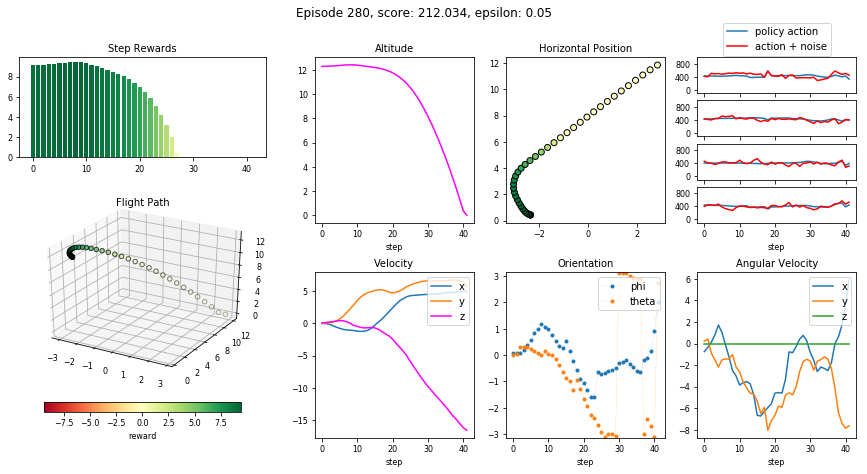

None

Episode 280 - epsilon:     0.05, memory size: 7569, num steps: 42, training score: 212.03, test score: 0.00
Episode 281 - epsilon:     0.05, memory size: 7614, num steps: 45, training score: 433.94, test score: 319.16
Episode 282 - epsilon:     0.05, memory size: 7644, num steps: 30, training score:  38.35, test score: 0.00
Episode 283 - epsilon:     0.05, memory size: 7670, num steps: 26, training score:   0.00, test score: 0.00
Episode 284 - epsilon:     0.05, memory size: 7696, num steps: 26, training score:  12.91, test score: 0.00
Episode 285 - epsilon:     0.05, memory size: 7729, num steps: 33, training score: 248.13, test score: 163.69
Episode 286 - epsilon:     0.05, memory size: 7759, num steps: 30, training score:   0.00, test score: 85.25
Episode 287 - epsilon:     0.05, memory size: 7790, num steps: 31, training score:   0.00, test score: 0.00
Episode 288 - epsilon:     0.05, memory size: 7819, num steps: 29, training score:   0.00, test score: 0.00
Episode 289 - epsilon: 

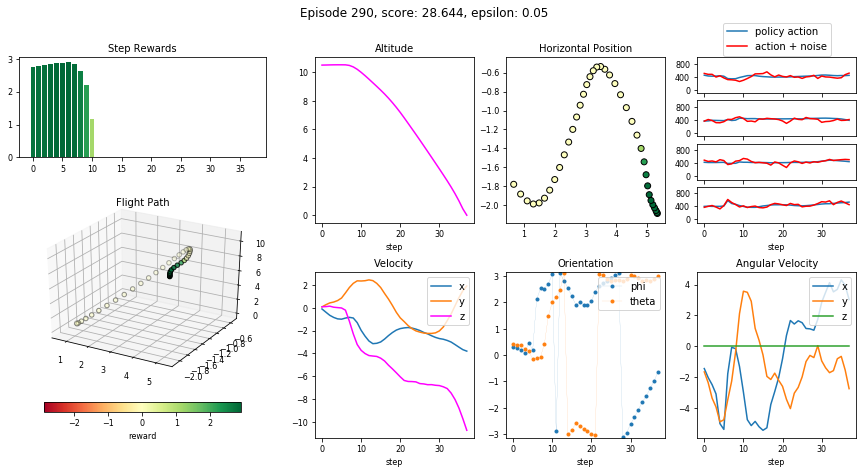

None

Episode 290 - epsilon:     0.05, memory size: 7890, num steps: 38, training score:  28.64, test score: 0.00
Episode 291 - epsilon:     0.05, memory size: 7919, num steps: 29, training score:  56.00, test score: 207.61
Episode 292 - epsilon:     0.05, memory size: 7949, num steps: 30, training score: 232.96, test score: 97.66
Episode 293 - epsilon:     0.05, memory size: 7983, num steps: 34, training score: 260.56, test score: 84.50
Episode 294 - epsilon:     0.05, memory size: 8019, num steps: 36, training score: 128.90, test score: 0.00
Episode 295 - epsilon:     0.05, memory size: 8049, num steps: 30, training score:  54.47, test score: 0.00
Episode 296 - epsilon:     0.05, memory size: 8078, num steps: 29, training score:  81.45, test score: 65.82
Episode 297 - epsilon:     0.05, memory size: 8105, num steps: 27, training score: 100.32, test score: 0.00
Episode 298 - epsilon:     0.05, memory size: 8127, num steps: 22, training score:   0.00, test score: 0.00
Episode 299 - epsilon: 

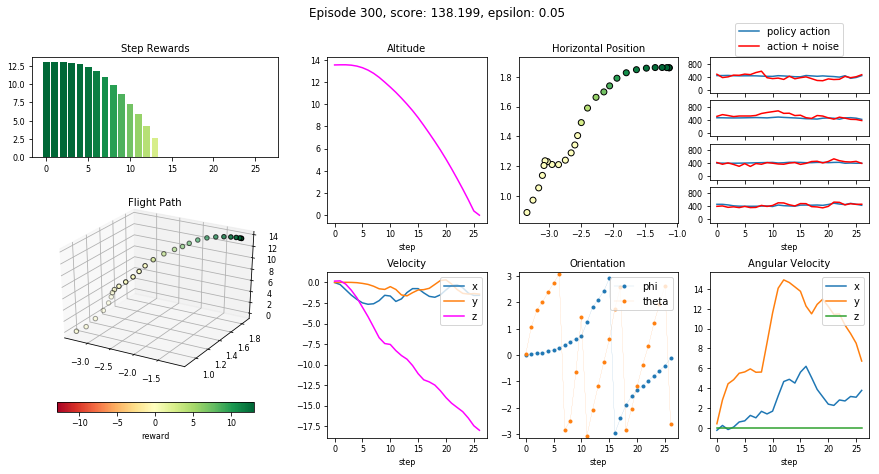

None

Episode 300 - epsilon:     0.05, memory size: 8174, num steps: 27, training score: 138.20, test score: 60.83
Episode 301 - epsilon:     0.05, memory size: 8202, num steps: 28, training score:  41.97, test score: 361.46
Episode 302 - epsilon:     0.05, memory size: 8224, num steps: 22, training score:   0.00, test score: 190.13
Episode 303 - epsilon:     0.05, memory size: 8254, num steps: 30, training score: 239.90, test score: 454.89
Episode 304 - epsilon:     0.05, memory size: 8292, num steps: 38, training score: 253.16, test score: 250.59
Episode 305 - epsilon:     0.05, memory size: 8319, num steps: 27, training score:   0.00, test score: 121.46
Episode 306 - epsilon:     0.05, memory size: 8352, num steps: 33, training score:  79.37, test score: 0.00
Episode 307 - epsilon:     0.05, memory size: 8377, num steps: 25, training score:  57.86, test score: 85.29
Episode 308 - epsilon:     0.05, memory size: 8397, num steps: 20, training score:   0.00, test score: 0.00
New best test sc

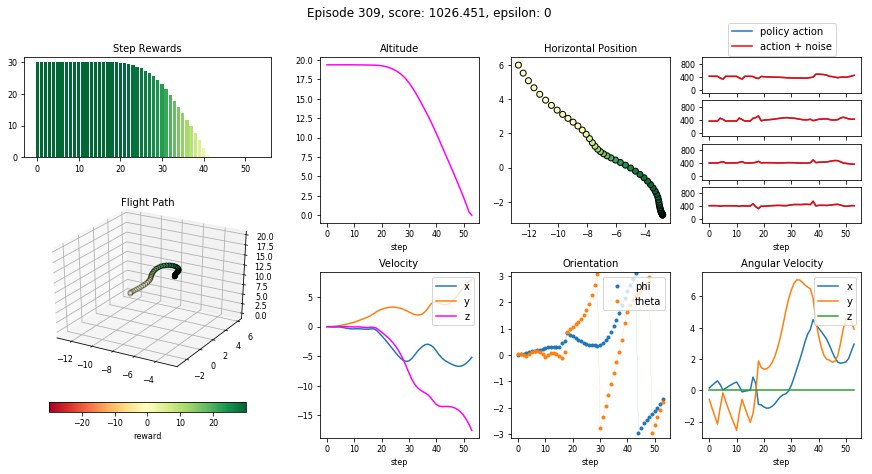

None

Episode 309 - epsilon:     0.05, memory size: 8419, num steps: 22, training score:   0.00, test score: 1026.45


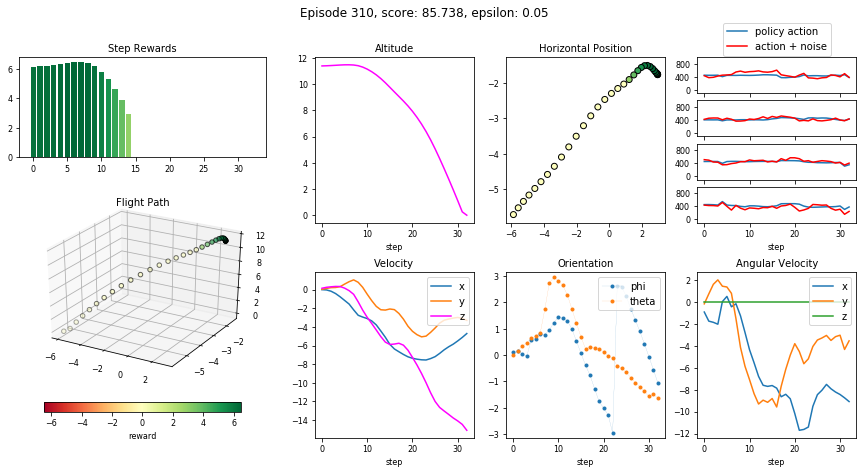

None

Episode 310 - epsilon:     0.05, memory size: 8452, num steps: 33, training score:  85.74, test score: 41.75
Episode 311 - epsilon:     0.05, memory size: 8479, num steps: 27, training score:  23.96, test score: 0.00
Episode 312 - epsilon:     0.05, memory size: 8513, num steps: 34, training score:   0.00, test score: 0.00
Episode 313 - epsilon:     0.05, memory size: 8540, num steps: 27, training score:   0.00, test score: 142.86
Episode 314 - epsilon:     0.05, memory size: 8563, num steps: 23, training score:   0.00, test score: 0.00
Episode 315 - epsilon:     0.05, memory size: 8598, num steps: 35, training score: 193.88, test score: 0.00
Episode 316 - epsilon:     0.05, memory size: 8628, num steps: 30, training score:   0.00, test score: 90.70
Episode 317 - epsilon:     0.05, memory size: 8657, num steps: 29, training score: 117.08, test score: 0.00
Episode 318 - epsilon:     0.05, memory size: 8691, num steps: 34, training score: 188.10, test score: 217.58
Episode 319 - epsilon:

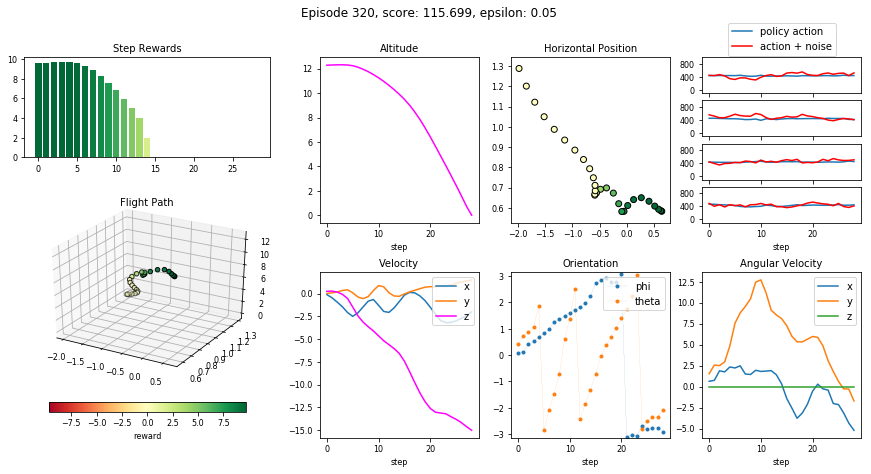

None

Episode 320 - epsilon:     0.05, memory size: 8752, num steps: 29, training score: 115.70, test score: 9.21
Episode 321 - epsilon:     0.05, memory size: 8787, num steps: 35, training score:  80.82, test score: 72.33
Episode 322 - epsilon:     0.05, memory size: 8813, num steps: 26, training score:   0.00, test score: 0.00
Episode 323 - epsilon:     0.05, memory size: 8854, num steps: 41, training score:   0.00, test score: 561.97
Episode 324 - epsilon:     0.05, memory size: 8880, num steps: 26, training score:  45.27, test score: 79.93
Episode 325 - epsilon:     0.05, memory size: 8915, num steps: 35, training score: 103.60, test score: 0.00
Episode 326 - epsilon:     0.05, memory size: 8942, num steps: 27, training score:   0.00, test score: 409.35
Episode 327 - epsilon:     0.05, memory size: 8977, num steps: 35, training score:  23.92, test score: 328.73
Episode 328 - epsilon:     0.05, memory size: 9004, num steps: 27, training score:   0.00, test score: 0.00
Episode 329 - epsilo

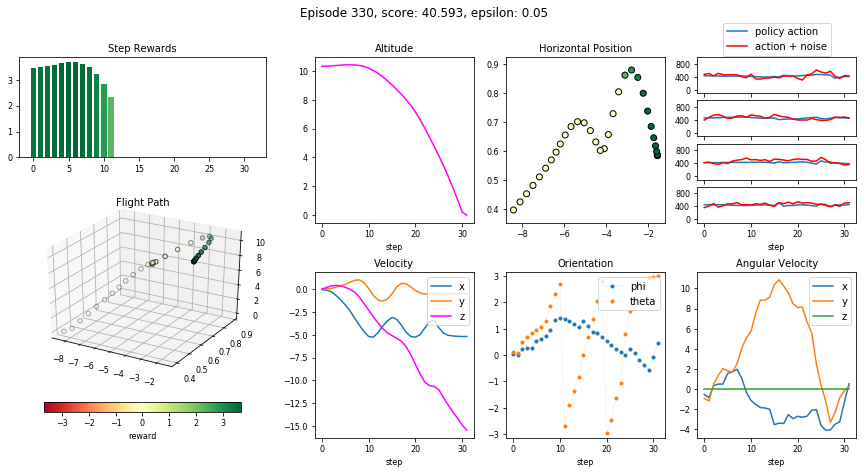

None

Episode 330 - epsilon:     0.05, memory size: 9070, num steps: 32, training score:  40.59, test score: 263.09
Episode 331 - epsilon:     0.05, memory size: 9090, num steps: 20, training score:   0.00, test score: 0.00
Episode 332 - epsilon:     0.05, memory size: 9113, num steps: 23, training score:   0.00, test score: 432.41
Episode 333 - epsilon:     0.05, memory size: 9136, num steps: 23, training score:   0.00, test score: 159.01
Episode 334 - epsilon:     0.05, memory size: 9166, num steps: 30, training score:  22.95, test score: 52.02
Episode 335 - epsilon:     0.05, memory size: 9192, num steps: 26, training score:   0.00, test score: 219.35
Episode 336 - epsilon:     0.05, memory size: 9225, num steps: 33, training score: 150.44, test score: 58.87
Episode 337 - epsilon:     0.05, memory size: 9260, num steps: 35, training score:   0.00, test score: 48.65
Episode 338 - epsilon:     0.05, memory size: 9293, num steps: 33, training score:   0.00, test score: 0.00
Episode 339 - eps

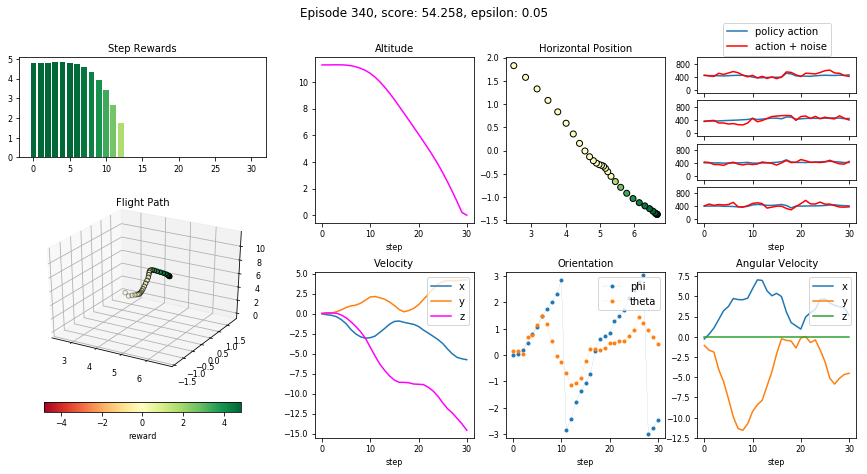

None

Episode 340 - epsilon:     0.05, memory size: 9363, num steps: 31, training score:  54.26, test score: 0.00
Episode 341 - epsilon:     0.05, memory size: 9391, num steps: 28, training score:   0.00, test score: 464.66
Episode 342 - epsilon:     0.05, memory size: 9419, num steps: 28, training score:  30.97, test score: 0.00
Episode 343 - epsilon:     0.05, memory size: 9460, num steps: 41, training score: 293.08, test score: 0.00
Episode 344 - epsilon:     0.05, memory size: 9490, num steps: 30, training score:  39.25, test score: 566.81
Episode 345 - epsilon:     0.05, memory size: 9514, num steps: 24, training score:  11.96, test score: 85.50
Episode 346 - epsilon:     0.05, memory size: 9542, num steps: 28, training score:   0.00, test score: 199.20
Episode 347 - epsilon:     0.05, memory size: 9570, num steps: 28, training score:  44.12, test score: 7.81
Episode 348 - epsilon:     0.05, memory size: 9605, num steps: 35, training score: 114.40, test score: 396.56
Episode 349 - epsil

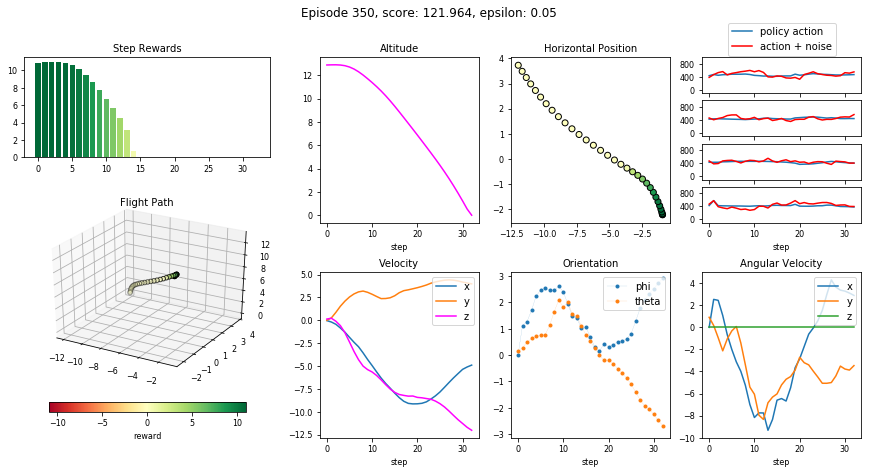

None

Episode 350 - epsilon:     0.05, memory size: 9674, num steps: 33, training score: 121.96, test score: 0.00
Episode 351 - epsilon:     0.05, memory size: 9713, num steps: 39, training score: 277.15, test score: 257.18
Episode 352 - epsilon:     0.05, memory size: 9739, num steps: 26, training score:   0.00, test score: 26.02
Episode 353 - epsilon:     0.05, memory size: 9766, num steps: 27, training score:   0.00, test score: 43.36
Episode 354 - epsilon:     0.05, memory size: 9794, num steps: 28, training score:  77.11, test score: 0.00
Episode 355 - epsilon:     0.05, memory size: 9817, num steps: 23, training score:   0.00, test score: 0.00
Episode 356 - epsilon:     0.05, memory size: 9852, num steps: 35, training score: 117.44, test score: 0.00
Episode 357 - epsilon:     0.05, memory size: 9893, num steps: 41, training score: 271.71, test score: 130.91
Episode 358 - epsilon:     0.05, memory size: 9935, num steps: 42, training score: 133.89, test score: 11.26
Episode 359 - epsilon

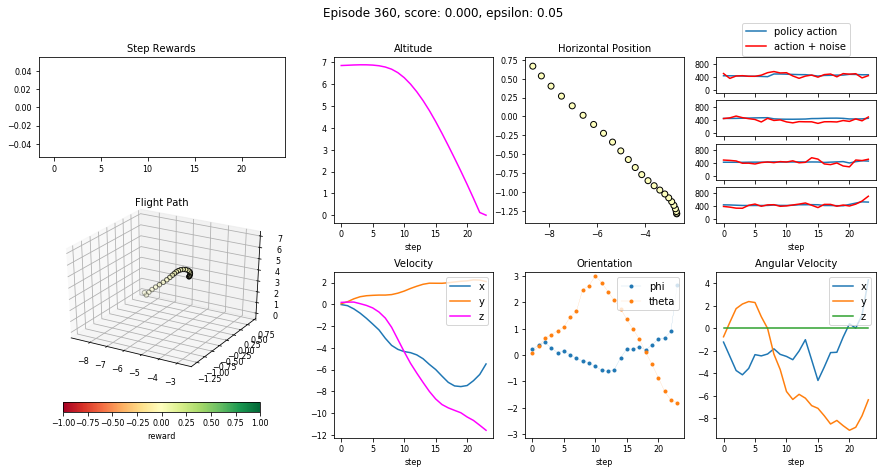

None

Episode 360 - epsilon:     0.05, memory size: 9992, num steps: 24, training score:   0.00, test score: 0.00
Episode 361 - epsilon:     0.05, memory size: 10024, num steps: 32, training score:  11.07, test score: 435.91
Episode 362 - epsilon:     0.05, memory size: 10054, num steps: 30, training score:   0.00, test score: 458.75
Episode 363 - epsilon:     0.05, memory size: 10082, num steps: 28, training score: 144.32, test score: 138.67
Episode 364 - epsilon:     0.05, memory size: 10112, num steps: 30, training score: 106.26, test score: 0.00
Episode 365 - epsilon:     0.05, memory size: 10149, num steps: 37, training score: 253.68, test score: 0.00
Episode 366 - epsilon:     0.05, memory size: 10191, num steps: 42, training score: 277.71, test score: 137.97
Episode 367 - epsilon:     0.05, memory size: 10217, num steps: 26, training score:   0.00, test score: 0.00
Episode 368 - epsilon:     0.05, memory size: 10247, num steps: 30, training score:   0.00, test score: 94.19
Episode 369

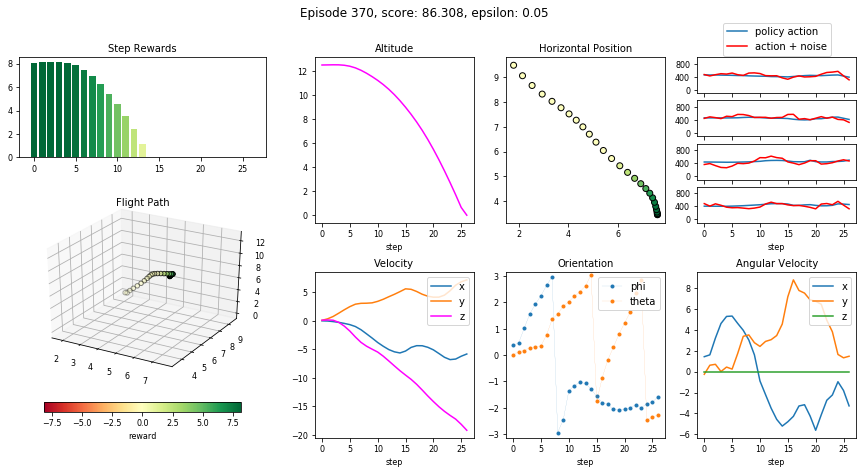

None

Episode 370 - epsilon:     0.05, memory size: 10305, num steps: 27, training score:  86.31, test score: 102.97
Episode 371 - epsilon:     0.05, memory size: 10337, num steps: 32, training score: 195.18, test score: 305.39
Episode 372 - epsilon:     0.05, memory size: 10363, num steps: 26, training score:   0.00, test score: 117.21
Episode 373 - epsilon:     0.05, memory size: 10393, num steps: 30, training score:  89.97, test score: 0.00
Episode 374 - epsilon:     0.05, memory size: 10419, num steps: 26, training score:   0.00, test score: 122.80
Episode 375 - epsilon:     0.05, memory size: 10456, num steps: 37, training score: 105.12, test score: 88.10
Episode 376 - epsilon:     0.05, memory size: 10491, num steps: 35, training score:  64.38, test score: 0.00
Episode 377 - epsilon:     0.05, memory size: 10525, num steps: 34, training score:   0.00, test score: 0.00
Episode 378 - epsilon:     0.05, memory size: 10555, num steps: 30, training score:  90.18, test score: 0.00
Episode 37

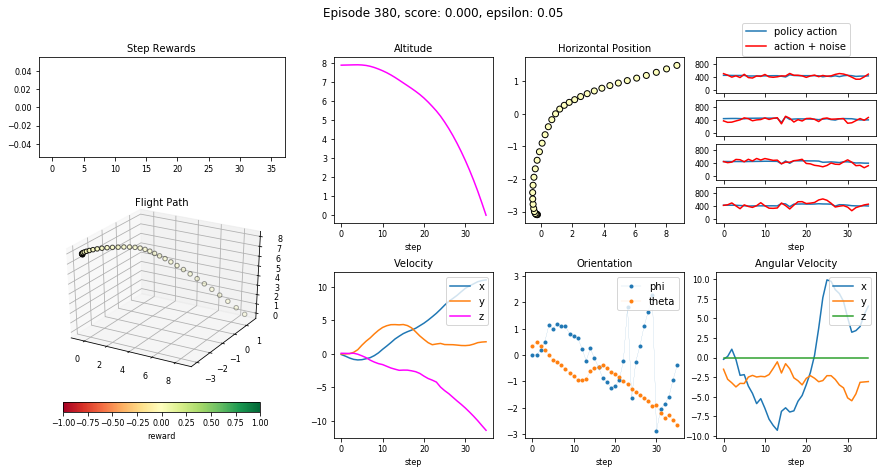

None

Episode 380 - epsilon:     0.05, memory size: 10626, num steps: 36, training score:   0.00, test score: 0.00
Episode 381 - epsilon:     0.05, memory size: 10662, num steps: 36, training score: 321.99, test score: 0.00
Episode 382 - epsilon:     0.05, memory size: 10692, num steps: 30, training score:  86.20, test score: 0.00
Episode 383 - epsilon:     0.05, memory size: 10714, num steps: 22, training score:   0.00, test score: 0.00
Episode 384 - epsilon:     0.05, memory size: 10743, num steps: 29, training score:  59.85, test score: 0.00
Episode 385 - epsilon:     0.05, memory size: 10773, num steps: 30, training score: 147.45, test score: 0.00
Episode 386 - epsilon:     0.05, memory size: 10802, num steps: 29, training score:   0.00, test score: 272.77
Episode 387 - epsilon:     0.05, memory size: 10842, num steps: 40, training score:  90.38, test score: 107.27
Episode 388 - epsilon:     0.05, memory size: 10861, num steps: 19, training score:   0.00, test score: 54.79
Episode 389 - 

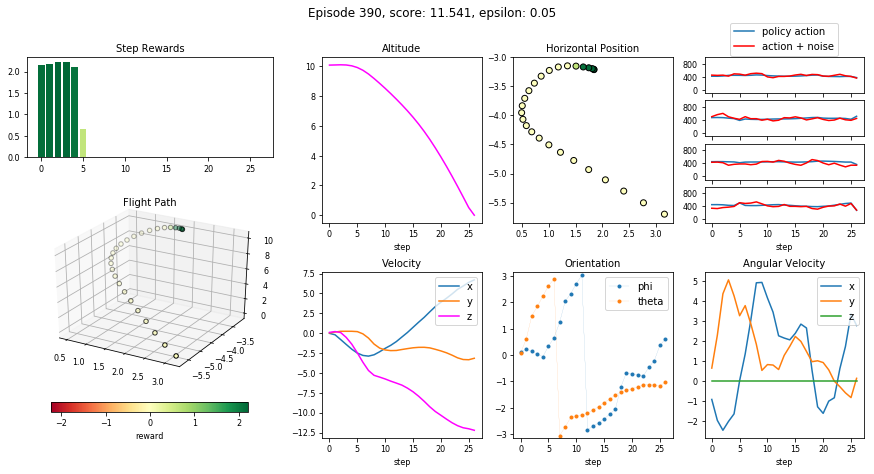

None

Episode 390 - epsilon:     0.05, memory size: 10918, num steps: 27, training score:  11.54, test score: 50.86
Episode 391 - epsilon:     0.05, memory size: 10953, num steps: 35, training score: 115.53, test score: 0.00
Episode 392 - epsilon:     0.05, memory size: 10982, num steps: 29, training score:  32.70, test score: 425.06
Episode 393 - epsilon:     0.05, memory size: 11010, num steps: 28, training score:  37.94, test score: 222.87
Episode 394 - epsilon:     0.05, memory size: 11035, num steps: 25, training score:  23.69, test score: 0.00
Episode 395 - epsilon:     0.05, memory size: 11061, num steps: 26, training score:   0.00, test score: 103.94
New best training score.


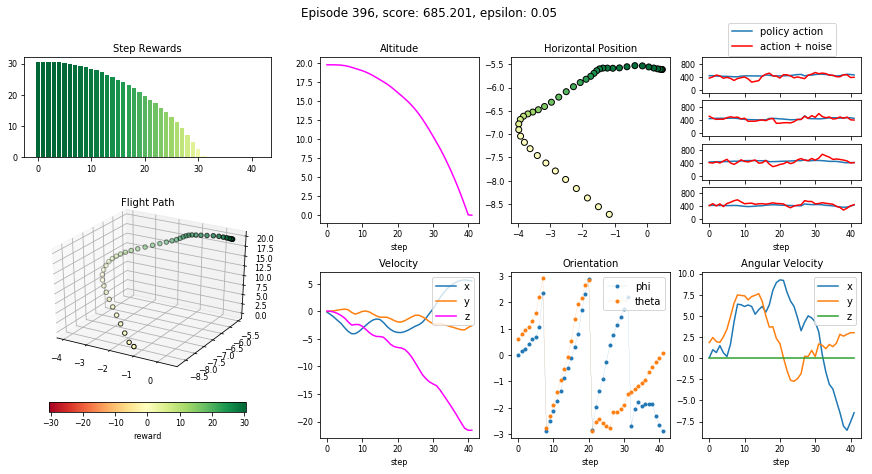

None

Episode 396 - epsilon:     0.05, memory size: 11103, num steps: 42, training score: 685.20, test score: 434.86
Episode 397 - epsilon:     0.05, memory size: 11131, num steps: 28, training score:   0.00, test score: 170.15
Episode 398 - epsilon:     0.05, memory size: 11163, num steps: 32, training score: 158.80, test score: 99.00
Episode 399 - epsilon:     0.05, memory size: 11189, num steps: 26, training score:   0.00, test score: 0.00


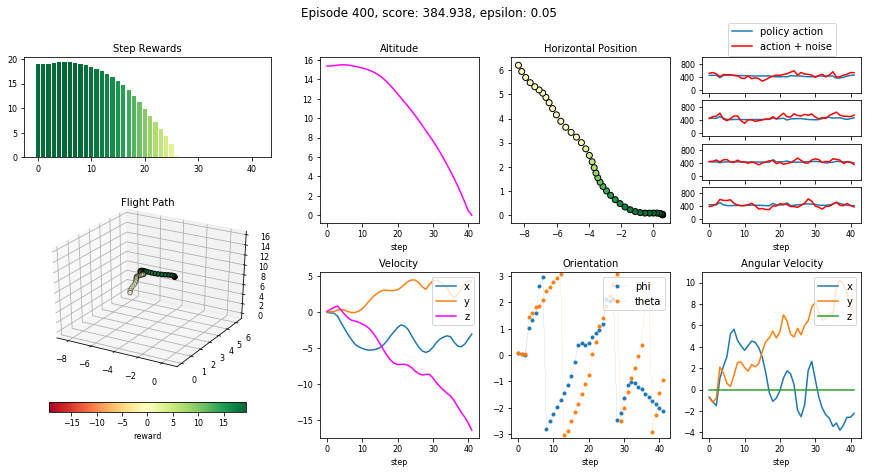

None

Episode 400 - epsilon:     0.05, memory size: 11231, num steps: 42, training score: 384.94, test score: 0.00
Episode 401 - epsilon:     0.05, memory size: 11260, num steps: 29, training score:  78.31, test score: 0.00
Episode 402 - epsilon:     0.05, memory size: 11297, num steps: 37, training score:  22.70, test score: 218.69
Episode 403 - epsilon:     0.05, memory size: 11330, num steps: 33, training score: 267.52, test score: 0.00
Episode 404 - epsilon:     0.05, memory size: 11353, num steps: 23, training score:   0.00, test score: 253.50
Episode 405 - epsilon:     0.05, memory size: 11403, num steps: 50, training score: 274.57, test score: 0.00
Episode 406 - epsilon:     0.05, memory size: 11435, num steps: 32, training score:  67.72, test score: 141.09
Episode 407 - epsilon:     0.05, memory size: 11472, num steps: 37, training score:   0.00, test score: 0.00
Episode 408 - epsilon:     0.05, memory size: 11507, num steps: 35, training score:  54.24, test score: 0.00
Episode 409 -

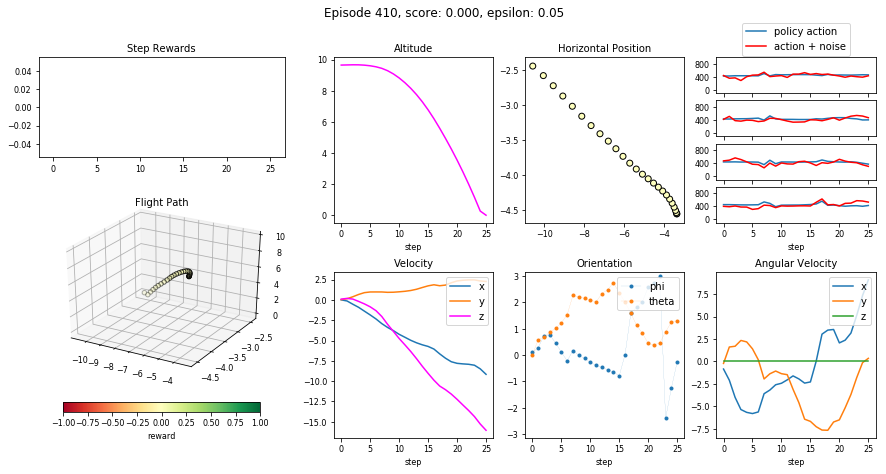

None

Episode 410 - epsilon:     0.05, memory size: 11558, num steps: 26, training score:   0.00, test score: 689.71
Episode 411 - epsilon:     0.05, memory size: 11589, num steps: 31, training score: 168.44, test score: 0.00
Episode 412 - epsilon:     0.05, memory size: 11617, num steps: 28, training score:   0.00, test score: 0.00
Episode 413 - epsilon:     0.05, memory size: 11643, num steps: 26, training score:   0.00, test score: 656.19
Episode 414 - epsilon:     0.05, memory size: 11665, num steps: 22, training score:   0.00, test score: 234.99
Episode 415 - epsilon:     0.05, memory size: 11694, num steps: 29, training score:  52.58, test score: 0.00
Episode 416 - epsilon:     0.05, memory size: 11728, num steps: 34, training score:   9.51, test score: 0.00
Episode 417 - epsilon:     0.05, memory size: 11761, num steps: 33, training score: 102.90, test score: 262.45
Episode 418 - epsilon:     0.05, memory size: 11785, num steps: 24, training score:   0.00, test score: 83.00
Episode 41

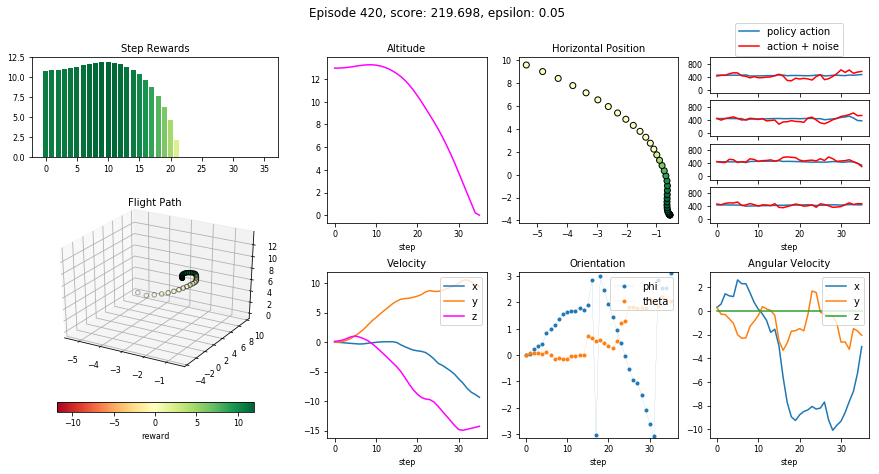

None

Episode 420 - epsilon:     0.05, memory size: 11851, num steps: 36, training score: 219.70, test score: 0.00
Episode 421 - epsilon:     0.05, memory size: 11880, num steps: 29, training score:   0.00, test score: 0.00
Episode 422 - epsilon:     0.05, memory size: 11908, num steps: 28, training score:   0.00, test score: 531.76
Episode 423 - epsilon:     0.05, memory size: 11944, num steps: 36, training score:   0.00, test score: 0.00
Episode 424 - epsilon:     0.05, memory size: 11969, num steps: 25, training score:   0.00, test score: 177.92
Episode 425 - epsilon:     0.05, memory size: 12006, num steps: 37, training score: 166.75, test score: 0.00
Episode 426 - epsilon:     0.05, memory size: 12047, num steps: 41, training score: 203.52, test score: 60.59
Episode 427 - epsilon:     0.05, memory size: 12084, num steps: 37, training score:   0.00, test score: 0.00
Episode 428 - epsilon:     0.05, memory size: 12120, num steps: 36, training score: 189.26, test score: 8.10
Episode 429 - 

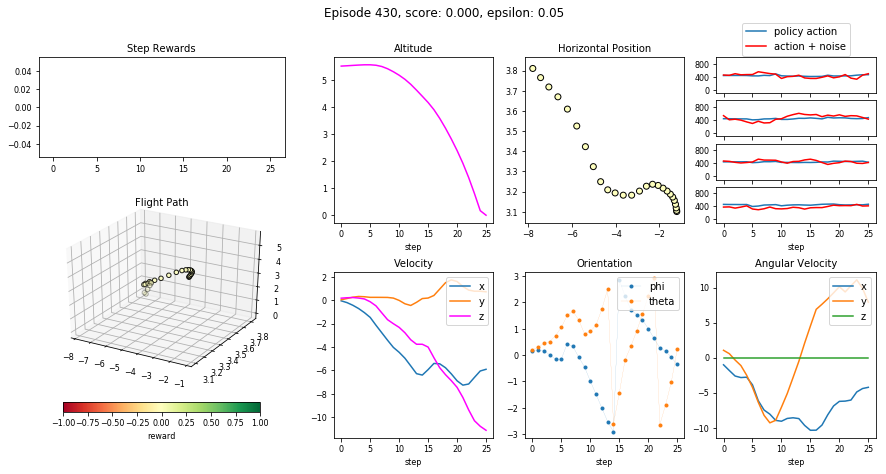

None

Episode 430 - epsilon:     0.05, memory size: 12179, num steps: 26, training score:   0.00, test score: 10.20
Episode 431 - epsilon:     0.05, memory size: 12207, num steps: 28, training score:   0.00, test score: 0.00
Episode 432 - epsilon:     0.05, memory size: 12238, num steps: 31, training score:   0.00, test score: 165.37
Episode 433 - epsilon:     0.05, memory size: 12266, num steps: 28, training score:   0.00, test score: 0.00
Episode 434 - epsilon:     0.05, memory size: 12294, num steps: 28, training score:   0.00, test score: 331.97
Episode 435 - epsilon:     0.05, memory size: 12325, num steps: 31, training score:   0.00, test score: 0.00
Episode 436 - epsilon:     0.05, memory size: 12351, num steps: 26, training score:  68.67, test score: 0.00
Episode 437 - epsilon:     0.05, memory size: 12388, num steps: 37, training score:  15.76, test score: 175.36
Episode 438 - epsilon:     0.05, memory size: 12420, num steps: 32, training score:   0.00, test score: 75.87
Episode 439

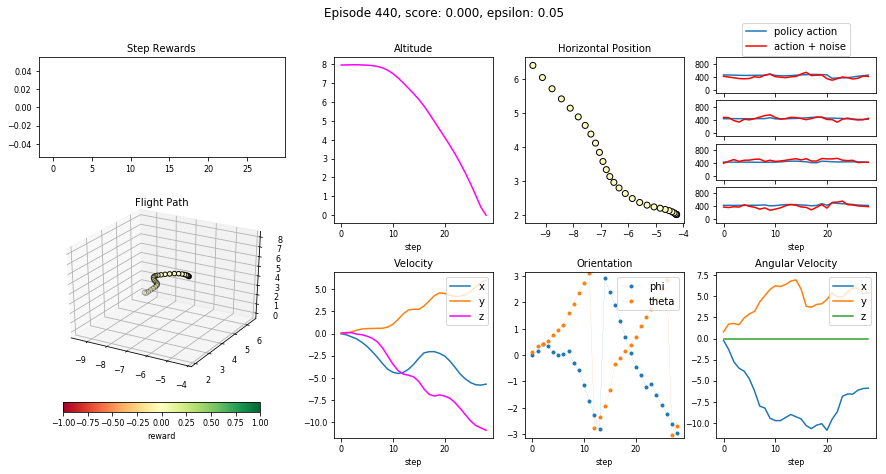

None

Episode 440 - epsilon:     0.05, memory size: 12481, num steps: 29, training score:   0.00, test score: 0.00
Episode 441 - epsilon:     0.05, memory size: 12506, num steps: 25, training score:   0.00, test score: 0.00
Episode 442 - epsilon:     0.05, memory size: 12532, num steps: 26, training score:  67.67, test score: 0.00
Episode 443 - epsilon:     0.05, memory size: 12565, num steps: 33, training score: 112.26, test score: 0.00
Episode 444 - epsilon:     0.05, memory size: 12583, num steps: 18, training score:   0.00, test score: 86.89
Episode 445 - epsilon:     0.05, memory size: 12617, num steps: 34, training score:  65.24, test score: 0.00
Episode 446 - epsilon:     0.05, memory size: 12653, num steps: 36, training score: 175.63, test score: 809.09
Episode 447 - epsilon:     0.05, memory size: 12685, num steps: 32, training score: 150.77, test score: 13.53
Episode 448 - epsilon:     0.05, memory size: 12709, num steps: 24, training score:   0.00, test score: 0.00
Episode 449 - e

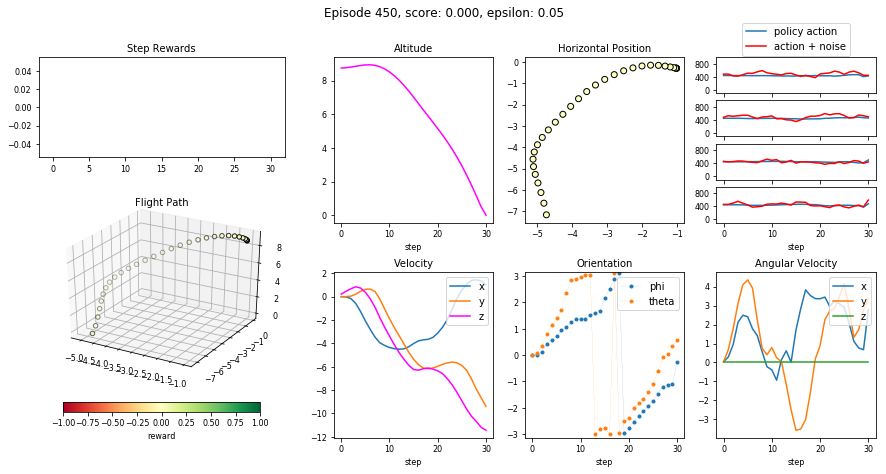

None

Episode 450 - epsilon:     0.05, memory size: 12782, num steps: 31, training score:   0.00, test score: 93.44
Episode 451 - epsilon:     0.05, memory size: 12812, num steps: 30, training score:   0.00, test score: 0.00
Episode 452 - epsilon:     0.05, memory size: 12838, num steps: 26, training score:  71.48, test score: 0.00
Episode 453 - epsilon:     0.05, memory size: 12864, num steps: 26, training score:  30.73, test score: 0.00
Episode 454 - epsilon:     0.05, memory size: 12902, num steps: 38, training score: 179.12, test score: 707.35
Episode 455 - epsilon:     0.05, memory size: 12929, num steps: 27, training score:   0.00, test score: 195.35
Episode 456 - epsilon:     0.05, memory size: 12958, num steps: 29, training score:  45.71, test score: 24.25
Episode 457 - epsilon:     0.05, memory size: 12988, num steps: 30, training score:   0.00, test score: 0.00
Episode 458 - epsilon:     0.05, memory size: 13031, num steps: 43, training score: 271.66, test score: 0.00
Episode 459 -

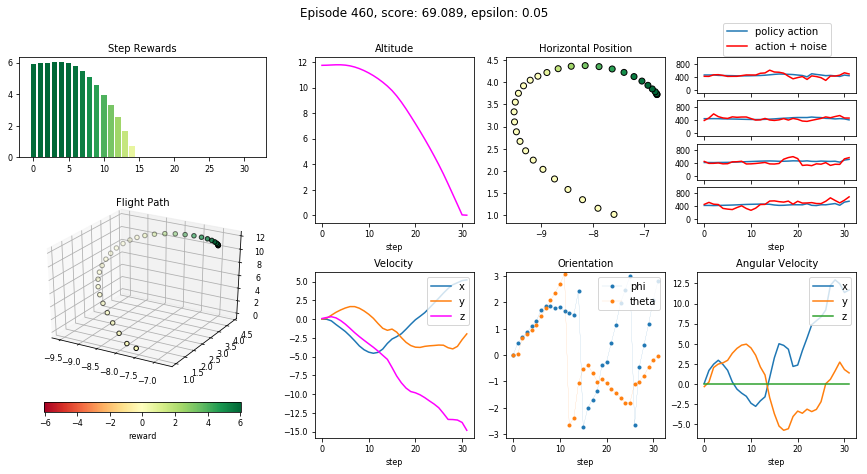

None

Episode 460 - epsilon:     0.05, memory size: 13100, num steps: 32, training score:  69.09, test score: 201.99
Episode 461 - epsilon:     0.05, memory size: 13137, num steps: 37, training score:  91.88, test score: 165.13
Episode 462 - epsilon:     0.05, memory size: 13165, num steps: 28, training score:   0.00, test score: 252.84
Episode 463 - epsilon:     0.05, memory size: 13192, num steps: 27, training score:  64.62, test score: 0.00
Episode 464 - epsilon:     0.05, memory size: 13213, num steps: 21, training score:   0.00, test score: 22.67
Episode 465 - epsilon:     0.05, memory size: 13255, num steps: 42, training score: 218.64, test score: 0.00
Episode 466 - epsilon:     0.05, memory size: 13286, num steps: 31, training score:   0.00, test score: 56.26
Episode 467 - epsilon:     0.05, memory size: 13316, num steps: 30, training score:  67.16, test score: 0.00
Episode 468 - epsilon:     0.05, memory size: 13349, num steps: 33, training score:  14.96, test score: 0.00
Episode 469

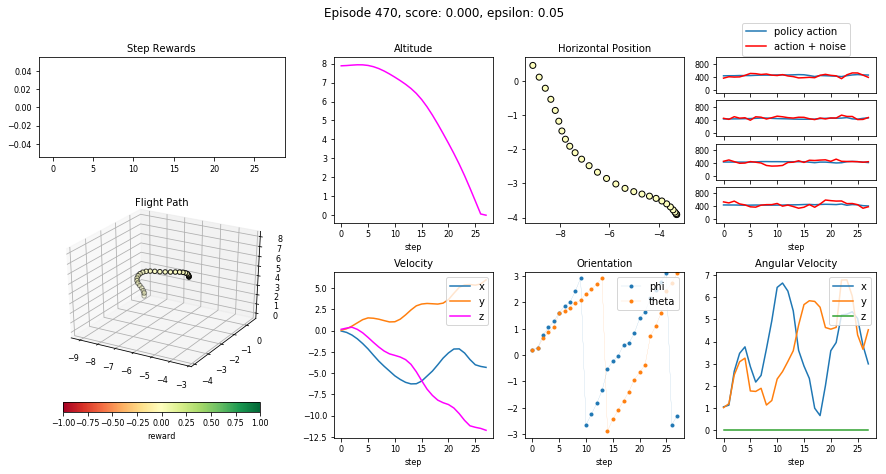

None

Episode 470 - epsilon:     0.05, memory size: 13396, num steps: 28, training score:   0.00, test score: 0.00
Episode 471 - epsilon:     0.05, memory size: 13441, num steps: 45, training score: 212.88, test score: 0.00
Episode 472 - epsilon:     0.05, memory size: 13483, num steps: 42, training score: 242.85, test score: 0.00
Episode 473 - epsilon:     0.05, memory size: 13507, num steps: 24, training score:   0.00, test score: 0.00
Episode 474 - epsilon:     0.05, memory size: 13540, num steps: 33, training score:  77.86, test score: 117.99
Episode 475 - epsilon:     0.05, memory size: 13586, num steps: 46, training score: 248.78, test score: 58.27
Episode 476 - epsilon:     0.05, memory size: 13625, num steps: 39, training score:   0.00, test score: 141.75
Episode 477 - epsilon:     0.05, memory size: 13662, num steps: 37, training score: 125.79, test score: 155.27
Episode 478 - epsilon:     0.05, memory size: 13687, num steps: 25, training score:   0.00, test score: 0.00
Episode 479 

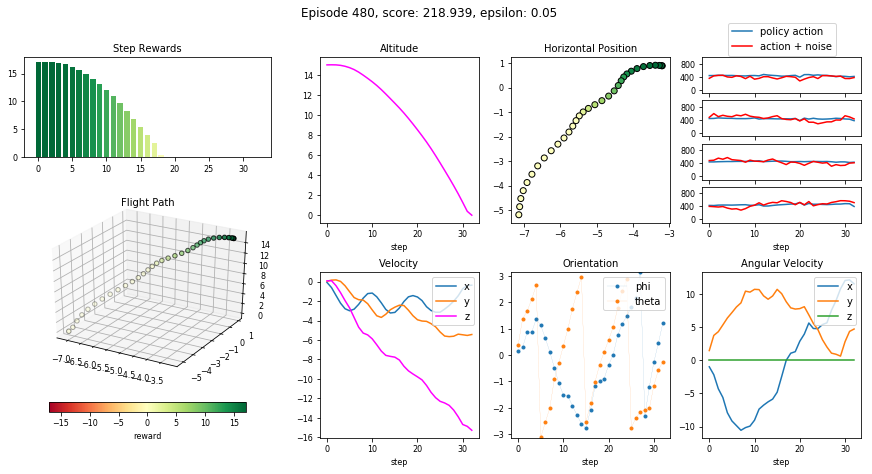

None

Episode 480 - epsilon:     0.05, memory size: 13750, num steps: 33, training score: 218.94, test score: 0.00
Episode 481 - epsilon:     0.05, memory size: 13796, num steps: 46, training score: 354.25, test score: 613.44
Episode 482 - epsilon:     0.05, memory size: 13823, num steps: 27, training score:  43.87, test score: 0.00
Episode 483 - epsilon:     0.05, memory size: 13850, num steps: 27, training score:   0.00, test score: 0.00
Episode 484 - epsilon:     0.05, memory size: 13879, num steps: 29, training score:  76.34, test score: 138.51
Episode 485 - epsilon:     0.05, memory size: 13912, num steps: 33, training score:   0.00, test score: 110.29
Episode 486 - epsilon:     0.05, memory size: 13937, num steps: 25, training score:  48.33, test score: 54.61
Episode 487 - epsilon:     0.05, memory size: 13964, num steps: 27, training score:   0.00, test score: 396.57
Episode 488 - epsilon:     0.05, memory size: 13990, num steps: 26, training score:   9.53, test score: 24.77
Episode 4

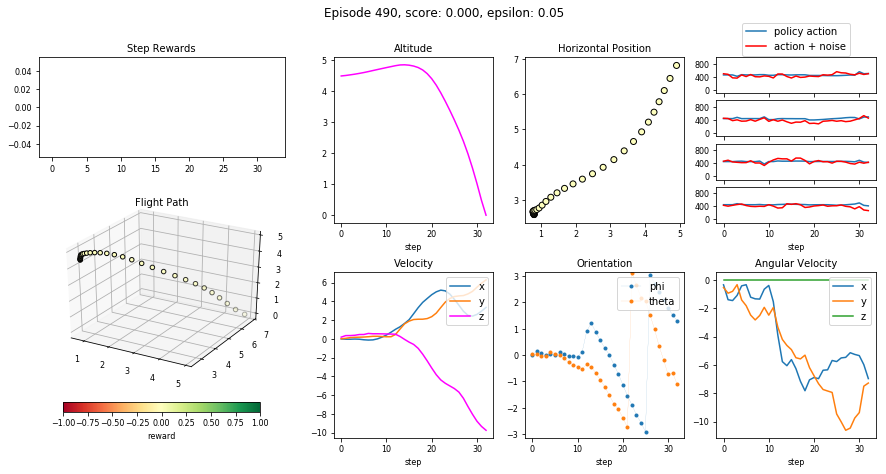

None

Episode 490 - epsilon:     0.05, memory size: 14047, num steps: 33, training score:   0.00, test score: 0.00
Episode 491 - epsilon:     0.05, memory size: 14076, num steps: 29, training score:  31.28, test score: 0.00
Episode 492 - epsilon:     0.05, memory size: 14114, num steps: 38, training score:  29.28, test score: 265.58
Episode 493 - epsilon:     0.05, memory size: 14138, num steps: 24, training score:   0.00, test score: 128.48
Episode 494 - epsilon:     0.05, memory size: 14177, num steps: 39, training score: 177.47, test score: 132.00
Episode 495 - epsilon:     0.05, memory size: 14204, num steps: 27, training score:   0.00, test score: 0.00
Episode 496 - epsilon:     0.05, memory size: 14226, num steps: 22, training score:   0.00, test score: 227.31
Episode 497 - epsilon:     0.05, memory size: 14265, num steps: 39, training score:  93.99, test score: 79.99
Episode 498 - epsilon:     0.05, memory size: 14293, num steps: 28, training score:   0.00, test score: 284.80
Episode 

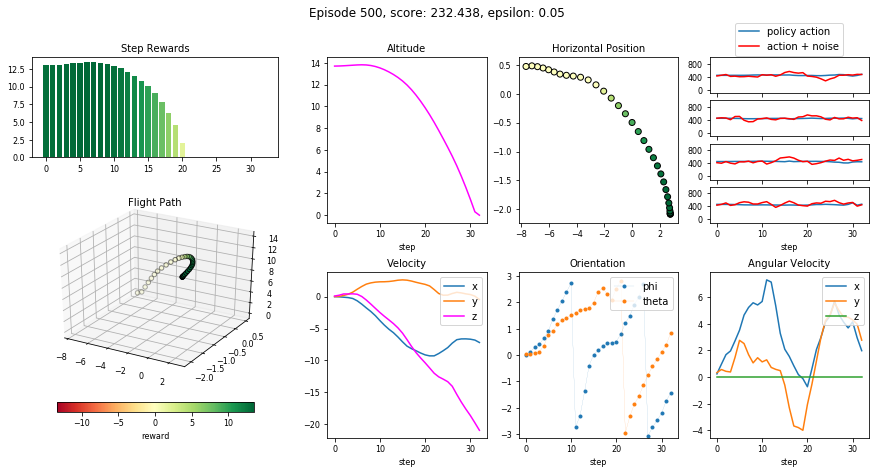

None

Episode 500 - epsilon:     0.05, memory size: 14369, num steps: 33, training score: 232.44, test score: 876.14


In [2]:
## TODO: Train your agent here.
import warnings; warnings.simplefilter('ignore')
from ddpg_agent.agent import DDPG, Q_a_frames_spec
from ddpg_agent.quadcopter_environment import QuadcopterState
from ddpg_agent.visualizations import plot_quadcopter_episode, plot_scores, visualize_quad_agent
%matplotlib inline

num_episodes = 500

agent = DDPG(task, ou_mu=0, ou_theta=.3, ou_sigma=1, 
             discount_factor=.9, replay_buffer_size=50000, replay_batch_size=1024,
             tau_actor=.4, tau_critic=.6, 
#              relu_alpha_actor=.01, relu_alpha_critic=.01,
             lr_actor=.00001, lr_critic=.0001, 
             activation_fn_actor='tanh',
             do_preprocessing=False,
#              normalize_rewards=False,
              activity_l2_reg=.003,
            )

def episode_callback(episode_num):
    last_training_episode = agent.history.training_episodes[-1]
    if episode_num%10==0:
        fig = plot_quadcopter_episode(last_training_episode)
        display(fig)
        
agent.set_episode_callback(episode_callback)

def max_training_score_callback(episode):
    last_training_episode = agent.history.training_episodes[-1]
    print("New best training score.")
    fig = plot_quadcopter_episode(last_training_episode)
    display(fig)
    
agent.set_max_training_score_callback(max_training_score_callback)
    
def max_test_score_callback(episode):
    last_test_episode = agent.history.test_episodes[-1]
    print("New best test score.")
    fig = plot_quadcopter_episode(last_test_episode)
    display(fig)
        
agent.set_max_test_score_callback(max_test_score_callback)

def rolling_mean(x,N):
    # From https://stackoverflow.com/a/22621523/338676
    return np.convolve(x, np.ones((N,))/N, mode='valid')

agent.train_n_episodes(num_episodes, eps=.05, act_random_first_n_episodes=50 )

Episode 501 - epsilon:     0.02, memory size: 14395, num steps: 26, training score:   0.00, test score: 0.00
Episode 502 - epsilon:     0.02, memory size: 14422, num steps: 27, training score: 122.77, test score: 0.00
Episode 503 - epsilon:     0.02, memory size: 14457, num steps: 35, training score:   0.00, test score: 15.43
New best test score.


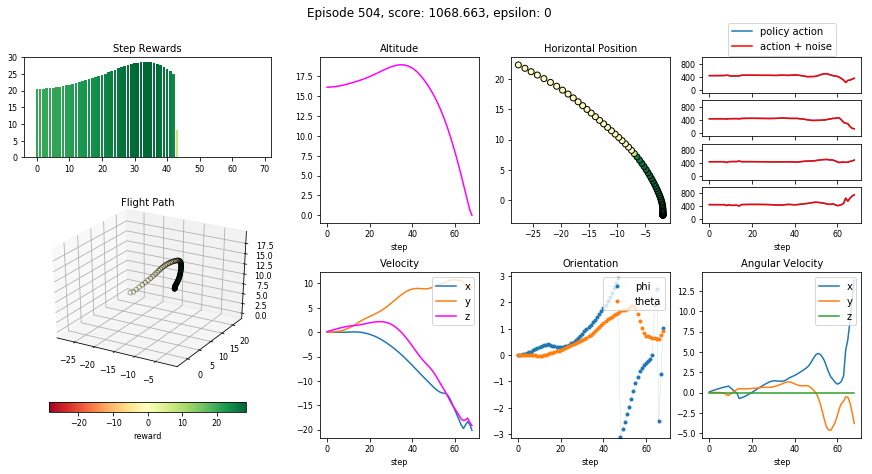

None

Episode 504 - epsilon:     0.02, memory size: 14496, num steps: 39, training score: 114.90, test score: 1068.66
Episode 505 - epsilon:     0.02, memory size: 14524, num steps: 28, training score:   0.00, test score: 122.33
Episode 506 - epsilon:     0.02, memory size: 14549, num steps: 25, training score:   0.00, test score: 0.00
Episode 507 - epsilon:     0.02, memory size: 14591, num steps: 42, training score:  49.59, test score: 0.00
Episode 508 - epsilon:     0.02, memory size: 14621, num steps: 30, training score:  55.20, test score: 474.45
Episode 509 - epsilon:     0.02, memory size: 14672, num steps: 51, training score: 273.77, test score: 161.78


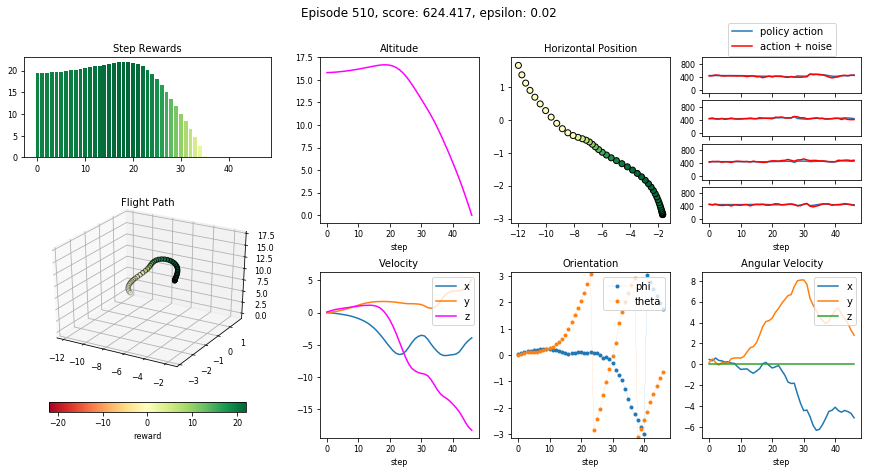

None

Episode 510 - epsilon:     0.02, memory size: 14719, num steps: 47, training score: 624.42, test score: 104.40
Episode 511 - epsilon:     0.02, memory size: 14766, num steps: 47, training score: 522.38, test score: 686.19
Episode 512 - epsilon:     0.02, memory size: 14808, num steps: 42, training score: 217.46, test score: 0.00
Episode 513 - epsilon:     0.02, memory size: 14838, num steps: 30, training score:   0.00, test score: 99.53
Episode 514 - epsilon:     0.02, memory size: 14870, num steps: 32, training score:   0.00, test score: 381.58
Episode 515 - epsilon:     0.02, memory size: 14915, num steps: 45, training score: 115.61, test score: 589.42
Episode 516 - epsilon:     0.02, memory size: 14954, num steps: 39, training score:   0.00, test score: 1000.61
Episode 517 - epsilon:     0.02, memory size: 14983, num steps: 29, training score:   0.00, test score: 0.00
Episode 518 - epsilon:     0.02, memory size: 15025, num steps: 42, training score:  49.16, test score: 284.39
Episo

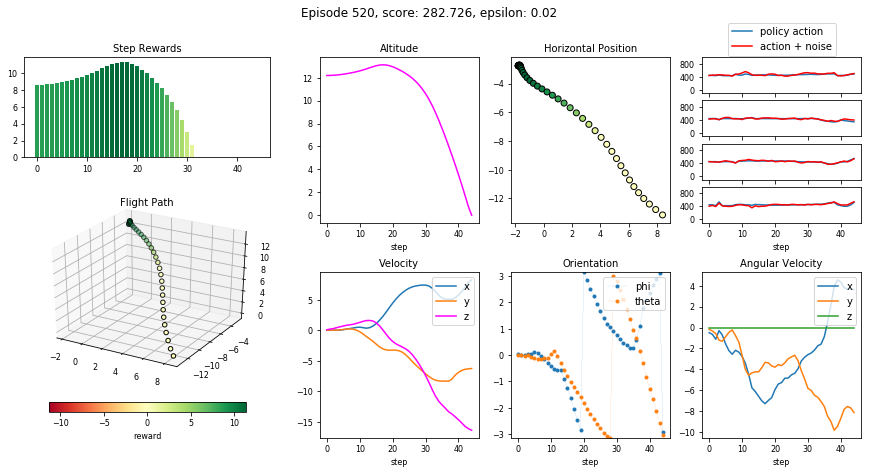

None

Episode 520 - epsilon:     0.02, memory size: 15097, num steps: 45, training score: 282.73, test score: 0.00
Episode 521 - epsilon:     0.02, memory size: 15132, num steps: 35, training score:   0.00, test score: 353.31
Episode 522 - epsilon:     0.02, memory size: 15163, num steps: 31, training score:   0.00, test score: 45.82
Episode 523 - epsilon:     0.02, memory size: 15199, num steps: 36, training score: 239.46, test score: 225.98
Episode 524 - epsilon:     0.02, memory size: 15251, num steps: 52, training score: 113.77, test score: 544.70
New best training score.


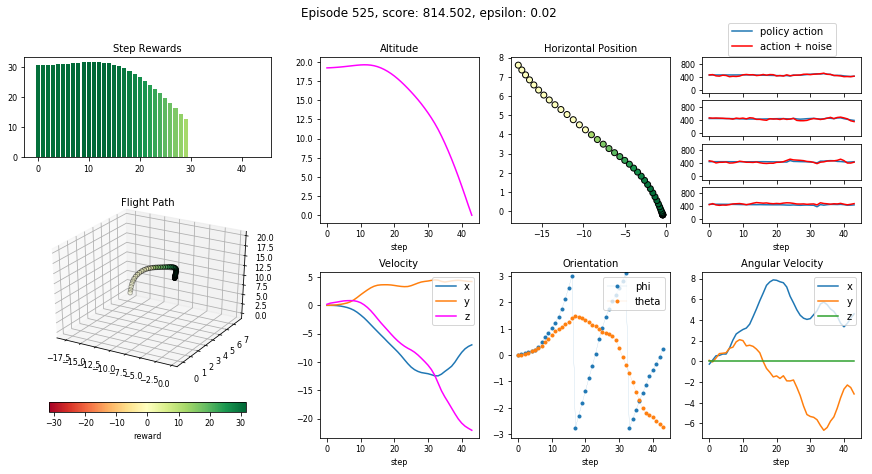

None

Episode 525 - epsilon:     0.02, memory size: 15295, num steps: 44, training score: 814.50, test score: 30.32
Episode 526 - epsilon:     0.02, memory size: 15329, num steps: 34, training score: 106.77, test score: 0.00
Episode 527 - epsilon:     0.02, memory size: 15368, num steps: 39, training score:  92.92, test score: 65.11
Episode 528 - epsilon:     0.02, memory size: 15441, num steps: 73, training score: 625.50, test score: 0.00
Episode 529 - epsilon:     0.02, memory size: 15474, num steps: 33, training score:   0.00, test score: 155.33


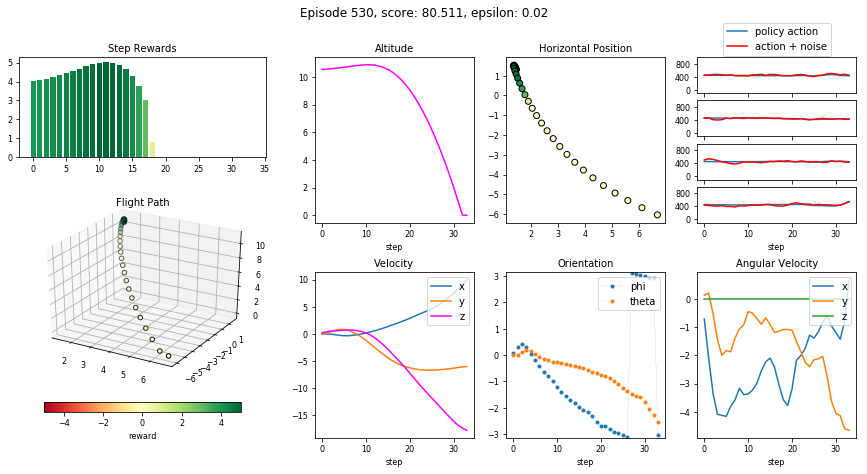

None

Episode 530 - epsilon:     0.02, memory size: 15508, num steps: 34, training score:  80.51, test score: 0.00
Episode 531 - epsilon:     0.02, memory size: 15548, num steps: 40, training score:   0.00, test score: 0.00
Episode 532 - epsilon:     0.02, memory size: 15593, num steps: 45, training score:   0.00, test score: 0.00
Episode 533 - epsilon:     0.02, memory size: 15635, num steps: 42, training score: 229.89, test score: 45.62
Episode 534 - epsilon:     0.02, memory size: 15661, num steps: 26, training score:   0.00, test score: 352.94
Episode 535 - epsilon:     0.02, memory size: 15702, num steps: 41, training score:   0.00, test score: 515.38
Episode 536 - epsilon:     0.02, memory size: 15741, num steps: 39, training score:   0.00, test score: 260.54
Episode 537 - epsilon:     0.02, memory size: 15776, num steps: 35, training score:   0.00, test score: 682.24
Episode 538 - epsilon:     0.02, memory size: 15814, num steps: 38, training score:   0.00, test score: 25.58
Episode 5

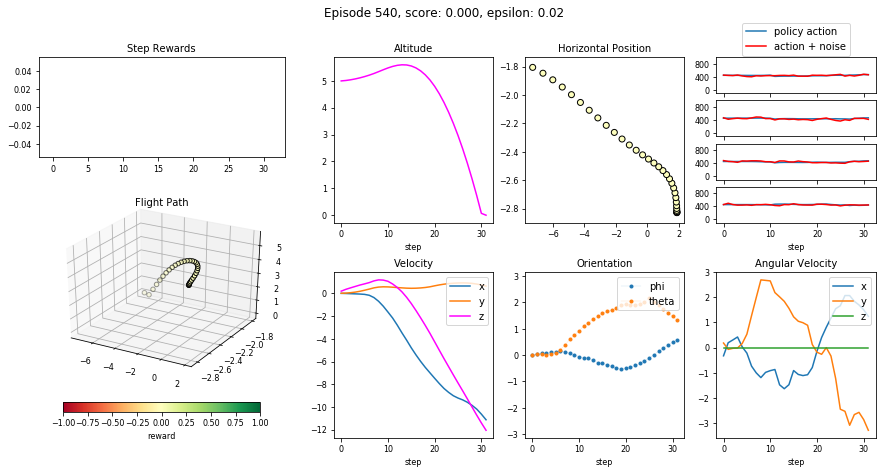

None

Episode 540 - epsilon:     0.02, memory size: 15881, num steps: 32, training score:   0.00, test score: 365.14
Episode 541 - epsilon:     0.02, memory size: 15908, num steps: 27, training score:   0.00, test score: 727.08
Episode 542 - epsilon:     0.02, memory size: 15935, num steps: 27, training score:   0.00, test score: 119.93
Episode 543 - epsilon:     0.02, memory size: 15971, num steps: 36, training score:   0.00, test score: 541.35
Episode 544 - epsilon:     0.02, memory size: 16020, num steps: 49, training score:   0.00, test score: 38.50
Episode 545 - epsilon:     0.02, memory size: 16052, num steps: 32, training score:  87.58, test score: 16.96
Episode 546 - epsilon:     0.02, memory size: 16094, num steps: 42, training score:   0.00, test score: 0.00
Episode 547 - epsilon:     0.02, memory size: 16129, num steps: 35, training score:  32.64, test score: 0.00
Episode 548 - epsilon:     0.02, memory size: 16175, num steps: 46, training score: 203.72, test score: 240.38
Episode

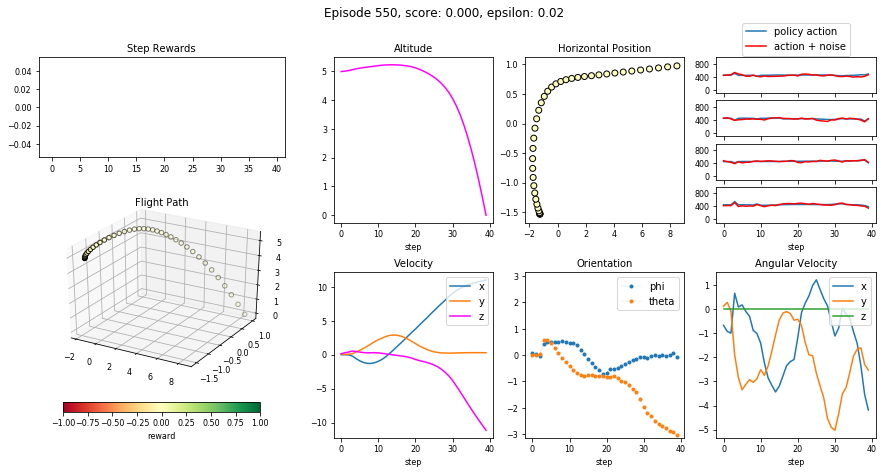

None

Episode 550 - epsilon:     0.02, memory size: 16260, num steps: 40, training score:   0.00, test score: 0.00
Episode 551 - epsilon:     0.02, memory size: 16306, num steps: 46, training score: 321.17, test score: 0.00
Episode 552 - epsilon:     0.02, memory size: 16344, num steps: 38, training score: 104.94, test score: 686.08
Episode 553 - epsilon:     0.02, memory size: 16374, num steps: 30, training score:  12.32, test score: 166.96
Episode 554 - epsilon:     0.02, memory size: 16434, num steps: 60, training score: 533.31, test score: 105.64
Episode 555 - epsilon:     0.02, memory size: 16469, num steps: 35, training score:   0.00, test score: 379.33
Episode 556 - epsilon:     0.02, memory size: 16522, num steps: 53, training score: 326.36, test score: 107.56
Episode 557 - epsilon:     0.02, memory size: 16569, num steps: 47, training score:  27.58, test score: 19.30
New best test score.


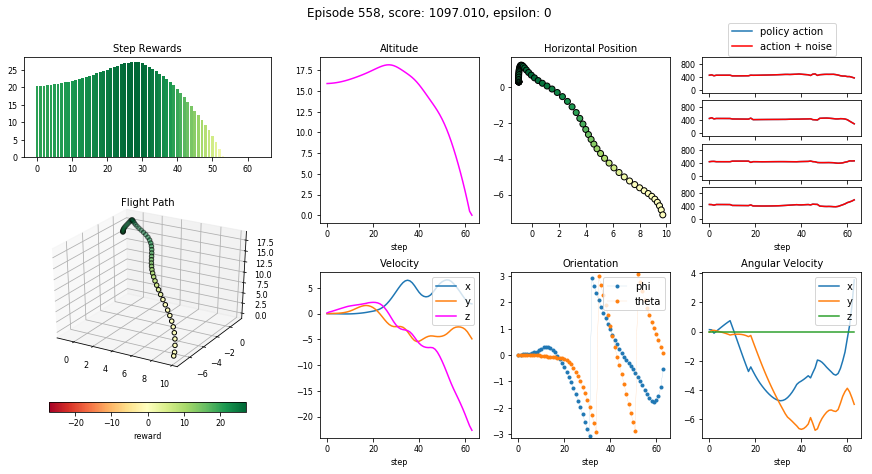

None

Episode 558 - epsilon:     0.02, memory size: 16630, num steps: 61, training score: 310.52, test score: 1097.01
Episode 559 - epsilon:     0.02, memory size: 16665, num steps: 35, training score:  59.06, test score: 6.07


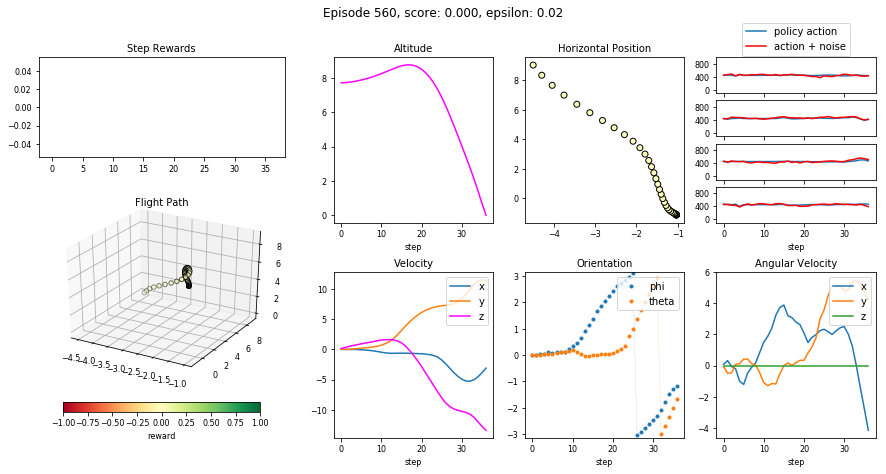

None

Episode 560 - epsilon:     0.02, memory size: 16702, num steps: 37, training score:   0.00, test score: 0.00
Episode 561 - epsilon:     0.02, memory size: 16733, num steps: 31, training score:  72.27, test score: 497.02
Episode 562 - epsilon:     0.02, memory size: 16770, num steps: 37, training score:   0.00, test score: 129.92
Episode 563 - epsilon:     0.02, memory size: 16805, num steps: 35, training score:   0.00, test score: 26.37
Episode 564 - epsilon:     0.02, memory size: 16835, num steps: 30, training score:   0.00, test score: 0.00
Episode 565 - epsilon:     0.02, memory size: 16874, num steps: 39, training score: 240.13, test score: 0.00
Episode 566 - epsilon:     0.02, memory size: 16918, num steps: 44, training score: 145.80, test score: 253.31
Episode 567 - epsilon:     0.02, memory size: 16951, num steps: 33, training score: 214.63, test score: 526.00
Episode 568 - epsilon:     0.02, memory size: 16979, num steps: 28, training score:  55.90, test score: 80.21
Episode 5

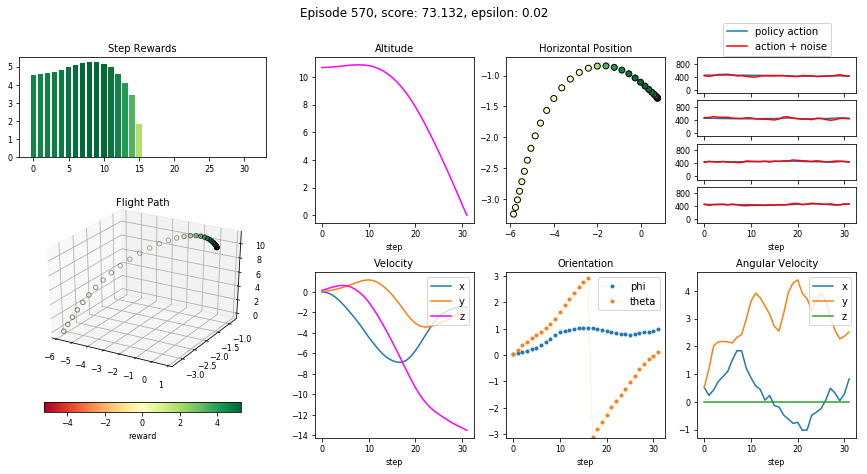

None

Episode 570 - epsilon:     0.02, memory size: 17048, num steps: 32, training score:  73.13, test score: 0.00
Episode 571 - epsilon:     0.02, memory size: 17085, num steps: 37, training score: 110.32, test score: 731.29
Episode 572 - epsilon:     0.02, memory size: 17133, num steps: 48, training score: 448.55, test score: 0.00
Episode 573 - epsilon:     0.02, memory size: 17180, num steps: 47, training score: 480.37, test score: 116.71
Episode 574 - epsilon:     0.02, memory size: 17216, num steps: 36, training score: 333.75, test score: 0.00
Episode 575 - epsilon:     0.02, memory size: 17255, num steps: 39, training score: 364.22, test score: 276.52
Episode 576 - epsilon:     0.02, memory size: 17291, num steps: 36, training score:   0.00, test score: 0.00
Episode 577 - epsilon:     0.02, memory size: 17316, num steps: 25, training score:   0.00, test score: 214.88
Episode 578 - epsilon:     0.02, memory size: 17359, num steps: 43, training score:   0.00, test score: 0.00
Episode 579

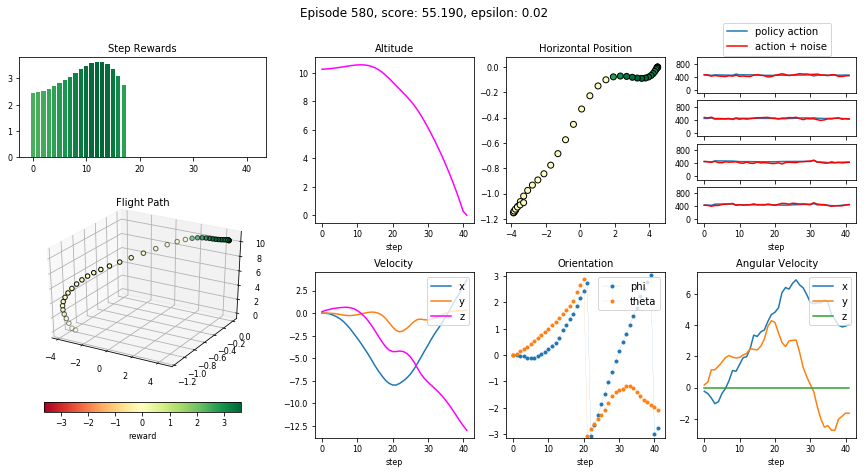

None

Episode 580 - epsilon:     0.02, memory size: 17428, num steps: 42, training score:  55.19, test score: 0.00
Episode 581 - epsilon:     0.02, memory size: 17453, num steps: 25, training score:   0.00, test score: 0.00
Episode 582 - epsilon:     0.02, memory size: 17499, num steps: 46, training score: 136.24, test score: 928.04
Episode 583 - epsilon:     0.02, memory size: 17530, num steps: 31, training score:   0.00, test score: 38.92
Episode 584 - epsilon:     0.02, memory size: 17570, num steps: 40, training score: 109.78, test score: 0.00
Episode 585 - epsilon:     0.02, memory size: 17602, num steps: 32, training score:  26.54, test score: 49.88
Episode 586 - epsilon:     0.02, memory size: 17632, num steps: 30, training score:   0.00, test score: 557.46
Episode 587 - epsilon:     0.02, memory size: 17670, num steps: 38, training score: 208.25, test score: 33.62
Episode 588 - epsilon:     0.02, memory size: 17722, num steps: 52, training score: 314.36, test score: 120.05
Episode 58

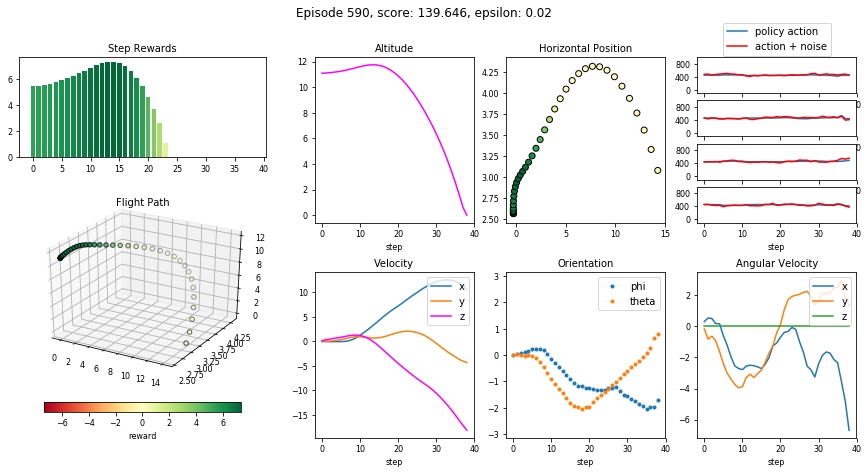

None

Episode 590 - epsilon:     0.02, memory size: 17806, num steps: 39, training score: 139.65, test score: 406.95
Episode 591 - epsilon:     0.02, memory size: 17838, num steps: 32, training score:   9.95, test score: 0.00
Episode 592 - epsilon:     0.02, memory size: 17900, num steps: 62, training score:   0.00, test score: 0.00
Episode 593 - epsilon:     0.02, memory size: 17929, num steps: 29, training score:   0.00, test score: 0.00
Episode 594 - epsilon:     0.02, memory size: 17959, num steps: 30, training score:   0.00, test score: 0.00
Episode 595 - epsilon:     0.02, memory size: 17991, num steps: 32, training score:  64.68, test score: 482.67
Episode 596 - epsilon:     0.02, memory size: 18033, num steps: 42, training score:  60.80, test score: 0.00
Episode 597 - epsilon:     0.02, memory size: 18057, num steps: 24, training score:   0.00, test score: 87.99
Episode 598 - epsilon:     0.02, memory size: 18096, num steps: 39, training score:  50.16, test score: 0.00
Episode 599 - 

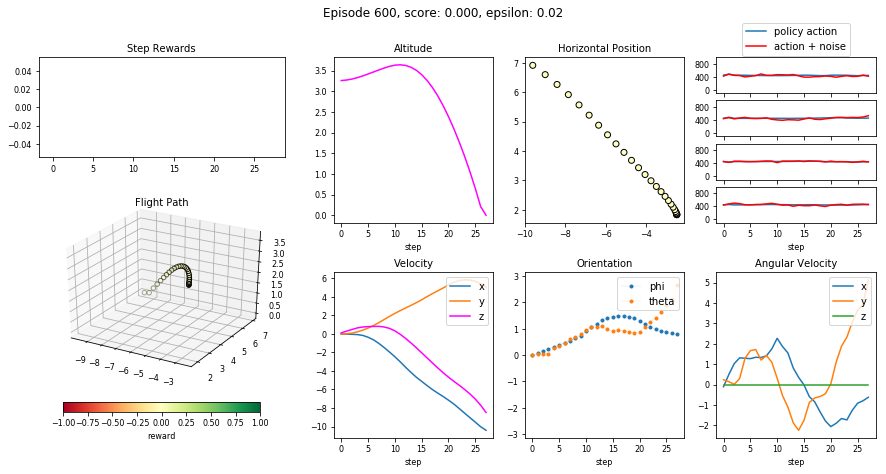

None

Episode 600 - epsilon:     0.02, memory size: 18154, num steps: 28, training score:   0.00, test score: 263.32
Episode 601 - epsilon:     0.02, memory size: 18185, num steps: 31, training score:   0.00, test score: 98.57
Episode 602 - epsilon:     0.02, memory size: 18219, num steps: 34, training score:  62.23, test score: 0.00
Episode 603 - epsilon:     0.02, memory size: 18253, num steps: 34, training score:   0.00, test score: 28.51
Episode 604 - epsilon:     0.02, memory size: 18282, num steps: 29, training score:   0.00, test score: 148.05
Episode 605 - epsilon:     0.02, memory size: 18314, num steps: 32, training score: 233.31, test score: 267.37
Episode 606 - epsilon:     0.02, memory size: 18370, num steps: 56, training score:  42.82, test score: 0.00
Episode 607 - epsilon:     0.02, memory size: 18410, num steps: 40, training score:  83.89, test score: 0.00
Episode 608 - epsilon:     0.02, memory size: 18451, num steps: 41, training score: 351.69, test score: 348.70
Episode 6

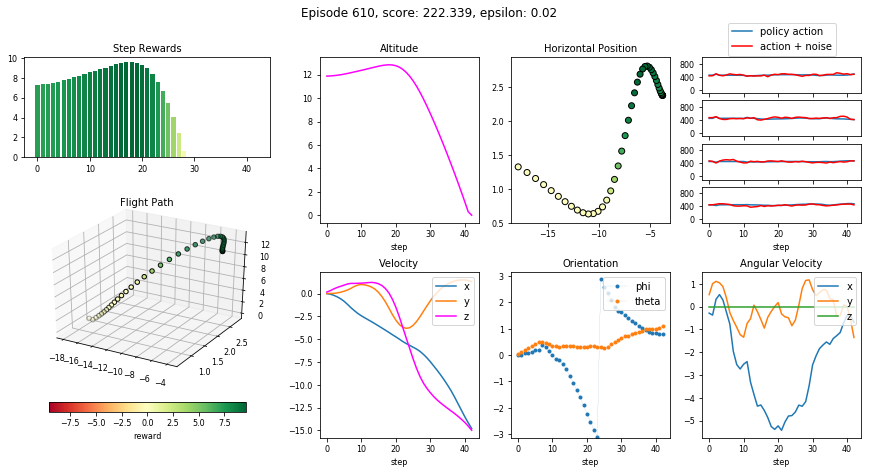

None

Episode 610 - epsilon:     0.02, memory size: 18531, num steps: 43, training score: 222.34, test score: 0.00
New best training score.


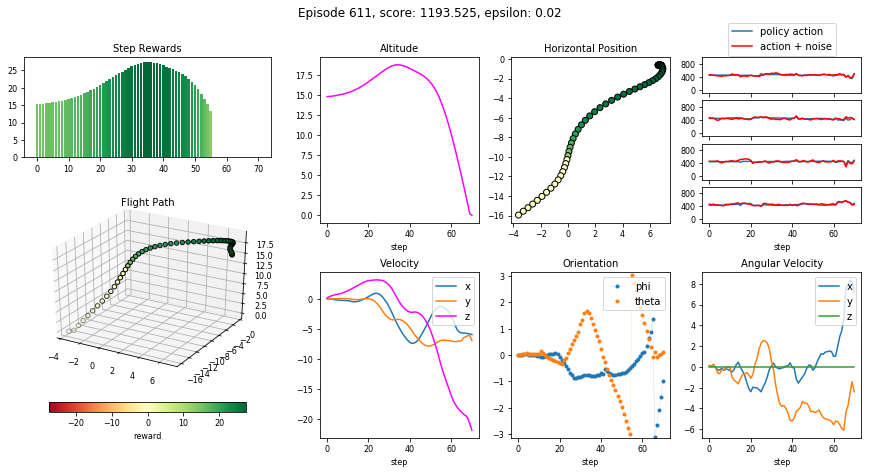

None

Episode 611 - epsilon:     0.02, memory size: 18602, num steps: 71, training score: 1193.52, test score: 66.58
Episode 612 - epsilon:     0.02, memory size: 18639, num steps: 37, training score:   0.00, test score: 500.38
Episode 613 - epsilon:     0.02, memory size: 18674, num steps: 35, training score: 167.31, test score: 474.28
Episode 614 - epsilon:     0.02, memory size: 18710, num steps: 36, training score:   0.00, test score: 253.72
Episode 615 - epsilon:     0.02, memory size: 18746, num steps: 36, training score:   0.00, test score: 564.34
Episode 616 - epsilon:     0.02, memory size: 18796, num steps: 50, training score: 192.45, test score: 145.54
Episode 617 - epsilon:     0.02, memory size: 18832, num steps: 36, training score:  91.73, test score: 0.00
Episode 618 - epsilon:     0.02, memory size: 18873, num steps: 41, training score: 176.34, test score: 0.00
Episode 619 - epsilon:     0.02, memory size: 18909, num steps: 36, training score:  91.02, test score: 238.46


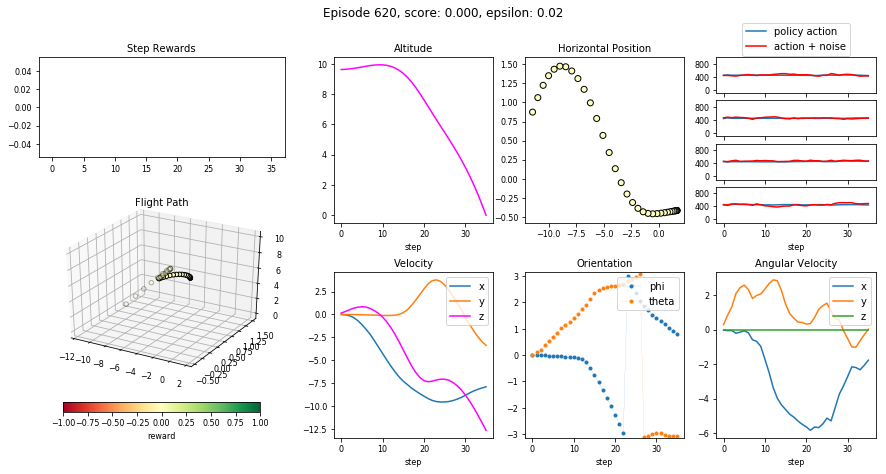

None

Episode 620 - epsilon:     0.02, memory size: 18945, num steps: 36, training score:   0.00, test score: 1085.91
Episode 621 - epsilon:     0.02, memory size: 18971, num steps: 26, training score:   0.00, test score: 0.00
Episode 622 - epsilon:     0.02, memory size: 19007, num steps: 36, training score: 180.62, test score: 177.94
Episode 623 - epsilon:     0.02, memory size: 19058, num steps: 51, training score: 373.59, test score: 770.35
Episode 624 - epsilon:     0.02, memory size: 19103, num steps: 45, training score: 258.23, test score: 359.29
Episode 625 - epsilon:     0.02, memory size: 19157, num steps: 54, training score: 593.72, test score: 850.27
Episode 626 - epsilon:     0.02, memory size: 19196, num steps: 39, training score: 221.12, test score: 385.77
Episode 627 - epsilon:     0.02, memory size: 19240, num steps: 44, training score: 296.77, test score: 0.00
Episode 628 - epsilon:     0.02, memory size: 19282, num steps: 42, training score:  84.64, test score: 172.79
Epis

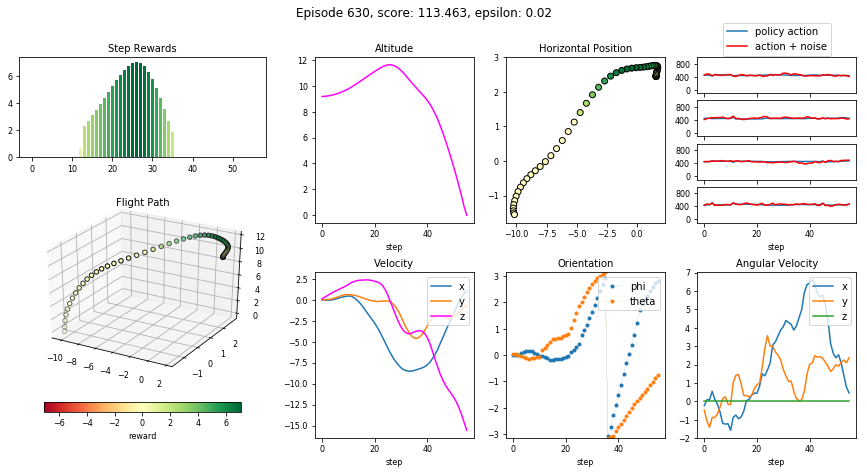

None

Episode 630 - epsilon:     0.02, memory size: 19367, num steps: 56, training score: 113.46, test score: 41.72
Episode 631 - epsilon:     0.02, memory size: 19389, num steps: 22, training score:   0.00, test score: 514.76
Episode 632 - epsilon:     0.02, memory size: 19426, num steps: 37, training score: 439.98, test score: 489.86
Episode 633 - epsilon:     0.02, memory size: 19467, num steps: 41, training score:  41.47, test score: 247.80
Episode 634 - epsilon:     0.02, memory size: 19499, num steps: 32, training score: 147.03, test score: 0.00
Episode 635 - epsilon:     0.02, memory size: 19551, num steps: 52, training score: 639.75, test score: 0.00
Episode 636 - epsilon:     0.02, memory size: 19587, num steps: 36, training score: 233.45, test score: 301.39
Episode 637 - epsilon:     0.02, memory size: 19615, num steps: 28, training score:   0.00, test score: 0.00
Episode 638 - epsilon:     0.02, memory size: 19648, num steps: 33, training score:   0.00, test score: 0.00
Episode 63

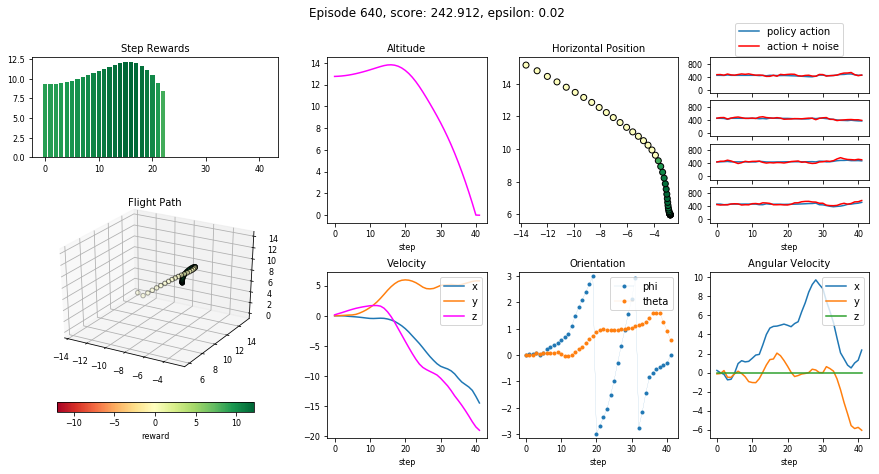

None

Episode 640 - epsilon:     0.02, memory size: 19724, num steps: 42, training score: 242.91, test score: 140.02
Episode 641 - epsilon:     0.02, memory size: 19752, num steps: 28, training score:   0.00, test score: 0.00
Episode 642 - epsilon:     0.02, memory size: 19800, num steps: 48, training score: 680.50, test score: 292.13
Episode 643 - epsilon:     0.02, memory size: 19837, num steps: 37, training score: 358.49, test score: 529.40
Episode 644 - epsilon:     0.02, memory size: 19877, num steps: 40, training score:   0.00, test score: 0.00
Episode 645 - epsilon:     0.02, memory size: 19928, num steps: 51, training score: 242.25, test score: 24.12
Episode 646 - epsilon:     0.02, memory size: 19969, num steps: 41, training score:   0.00, test score: 618.57
Episode 647 - epsilon:     0.02, memory size: 20004, num steps: 35, training score: 134.07, test score: 488.88
Episode 648 - epsilon:     0.02, memory size: 20036, num steps: 32, training score:   0.00, test score: 326.27
Episod

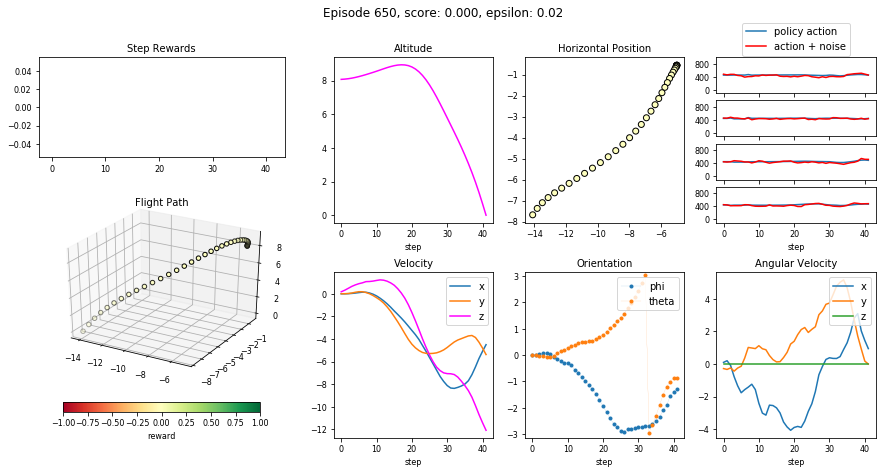

None

Episode 650 - epsilon:     0.02, memory size: 20121, num steps: 42, training score:   0.00, test score: 151.92
Episode 651 - epsilon:     0.02, memory size: 20160, num steps: 39, training score: 410.61, test score: 0.00
Episode 652 - epsilon:     0.02, memory size: 20178, num steps: 18, training score:   0.00, test score: 499.79
Episode 653 - epsilon:     0.02, memory size: 20209, num steps: 31, training score:   0.00, test score: 482.15
Episode 654 - epsilon:     0.02, memory size: 20252, num steps: 43, training score:   0.00, test score: 93.27
Episode 655 - epsilon:     0.02, memory size: 20284, num steps: 32, training score:   0.00, test score: 693.56
Episode 656 - epsilon:     0.02, memory size: 20318, num steps: 34, training score: 191.17, test score: 402.61
Episode 657 - epsilon:     0.02, memory size: 20364, num steps: 46, training score: 157.20, test score: 0.00
Episode 658 - epsilon:     0.02, memory size: 20400, num steps: 36, training score:  71.55, test score: 130.75
Episod

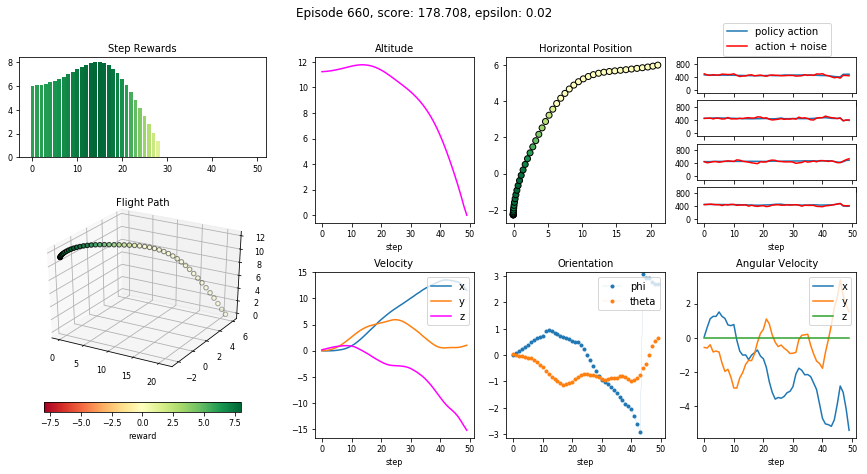

None

Episode 660 - epsilon:     0.02, memory size: 20482, num steps: 50, training score: 178.71, test score: 0.00
Episode 661 - epsilon:     0.02, memory size: 20517, num steps: 35, training score:   0.00, test score: 794.54
Episode 662 - epsilon:     0.02, memory size: 20549, num steps: 32, training score: 116.41, test score: 306.28
Episode 663 - epsilon:     0.02, memory size: 20584, num steps: 35, training score:   0.00, test score: 28.61
Episode 664 - epsilon:     0.02, memory size: 20645, num steps: 61, training score:   0.00, test score: 339.80
Episode 665 - epsilon:     0.02, memory size: 20681, num steps: 36, training score: 163.18, test score: 531.84
New best test score.


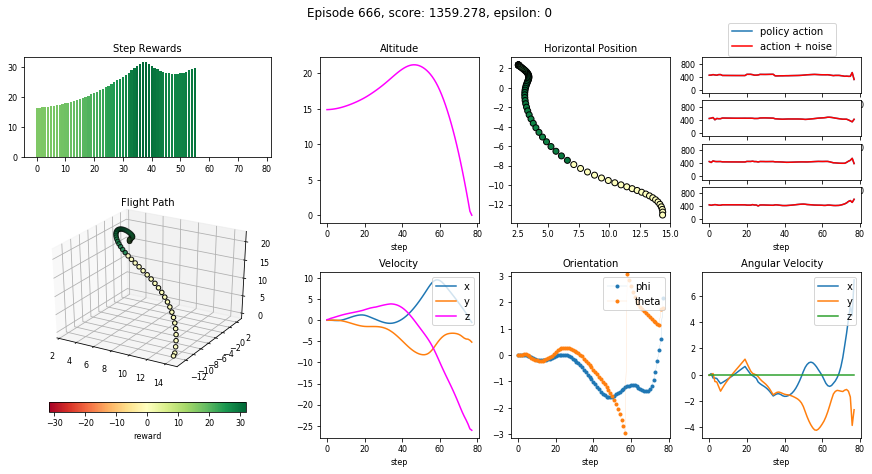

None

Episode 666 - epsilon:     0.02, memory size: 20723, num steps: 42, training score: 154.53, test score: 1359.28
Episode 667 - epsilon:     0.02, memory size: 20758, num steps: 35, training score: 225.74, test score: 659.77
Episode 668 - epsilon:     0.02, memory size: 20792, num steps: 34, training score:   0.00, test score: 862.20
Episode 669 - epsilon:     0.02, memory size: 20850, num steps: 58, training score: 625.45, test score: 46.16


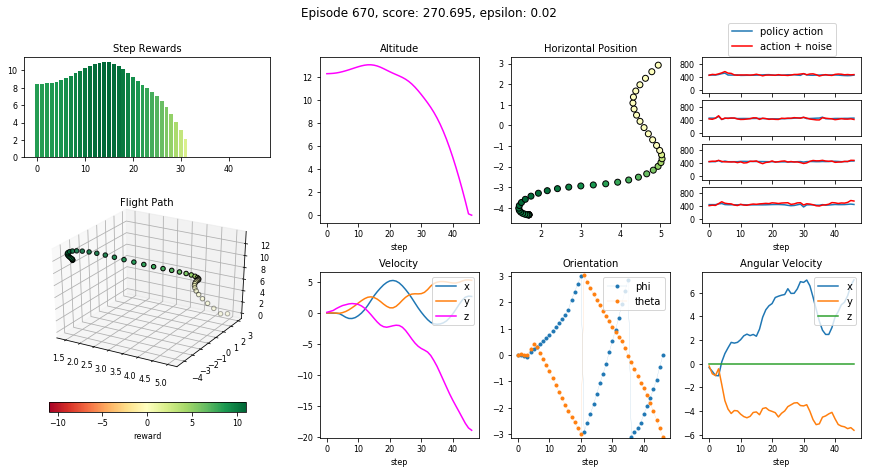

None

Episode 670 - epsilon:     0.02, memory size: 20897, num steps: 47, training score: 270.70, test score: 887.66
Episode 671 - epsilon:     0.02, memory size: 20935, num steps: 38, training score:   0.00, test score: 75.51
Episode 672 - epsilon:     0.02, memory size: 20979, num steps: 44, training score:   0.00, test score: 0.00
Episode 673 - epsilon:     0.02, memory size: 21015, num steps: 36, training score:   0.00, test score: 542.61
Episode 674 - epsilon:     0.02, memory size: 21063, num steps: 48, training score: 242.46, test score: 630.54
Episode 675 - epsilon:     0.02, memory size: 21119, num steps: 56, training score: 768.10, test score: 0.00
Episode 676 - epsilon:     0.02, memory size: 21150, num steps: 31, training score:   0.00, test score: 0.00
Episode 677 - epsilon:     0.02, memory size: 21183, num steps: 33, training score:   0.00, test score: 748.23
Episode 678 - epsilon:     0.02, memory size: 21223, num steps: 40, training score: 390.36, test score: 139.93
Episode 

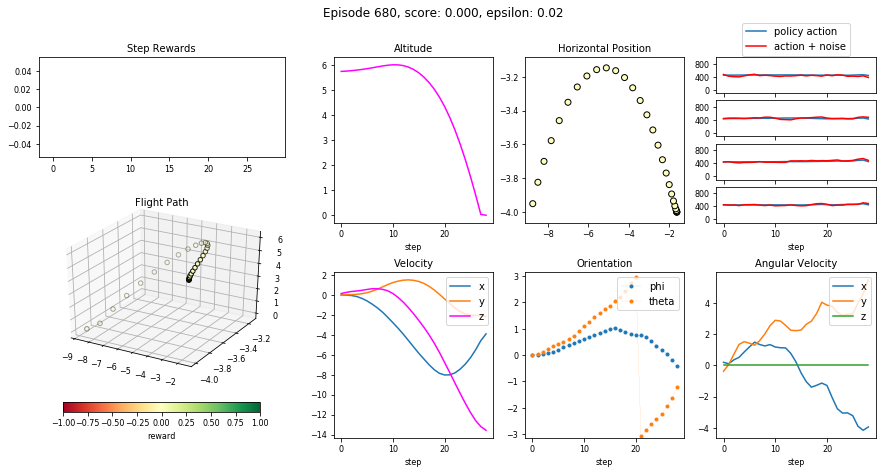

None

Episode 680 - epsilon:     0.02, memory size: 21289, num steps: 29, training score:   0.00, test score: 382.60
Episode 681 - epsilon:     0.02, memory size: 21316, num steps: 27, training score:   0.00, test score: 341.37
New best test score.


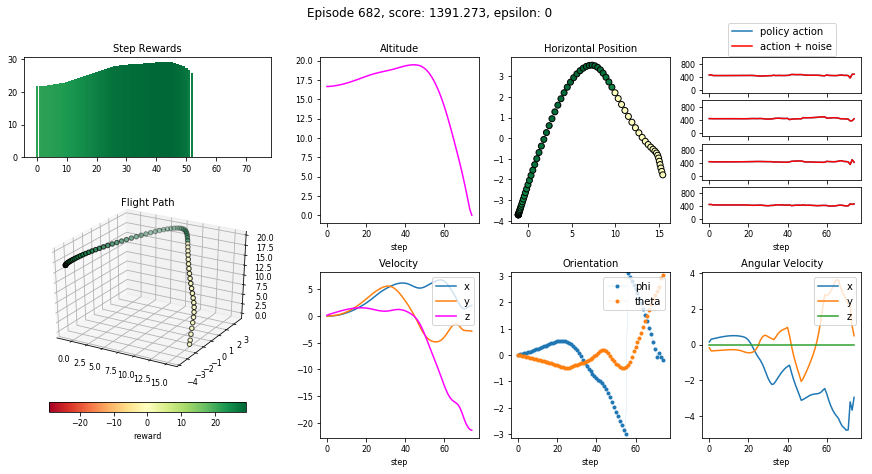

None

Episode 682 - epsilon:     0.02, memory size: 21352, num steps: 36, training score: 234.63, test score: 1391.27
Episode 683 - epsilon:     0.02, memory size: 21377, num steps: 25, training score:   0.00, test score: 29.32
Episode 684 - epsilon:     0.02, memory size: 21407, num steps: 30, training score:   0.00, test score: 338.13
Episode 685 - epsilon:     0.02, memory size: 21437, num steps: 30, training score:  81.18, test score: 0.00
Episode 686 - epsilon:     0.02, memory size: 21473, num steps: 36, training score: 180.10, test score: 857.64
Episode 687 - epsilon:     0.02, memory size: 21507, num steps: 34, training score:   0.00, test score: 782.94
Episode 688 - epsilon:     0.02, memory size: 21528, num steps: 21, training score:   0.00, test score: 794.90
Episode 689 - epsilon:     0.02, memory size: 21560, num steps: 32, training score:   0.00, test score: 109.21


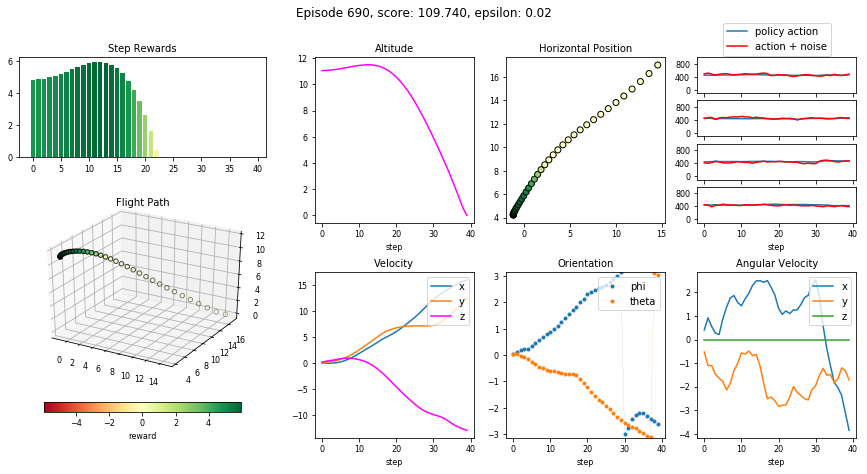

None

Episode 690 - epsilon:     0.02, memory size: 21600, num steps: 40, training score: 109.74, test score: 0.00
Episode 691 - epsilon:     0.02, memory size: 21646, num steps: 46, training score: 380.20, test score: 228.71
Episode 692 - epsilon:     0.02, memory size: 21690, num steps: 44, training score: 324.49, test score: 0.00
Episode 693 - epsilon:     0.02, memory size: 21717, num steps: 27, training score:   0.00, test score: 495.93
Episode 694 - epsilon:     0.02, memory size: 21771, num steps: 54, training score: 218.77, test score: 0.00
Episode 695 - epsilon:     0.02, memory size: 21800, num steps: 29, training score:  12.35, test score: 1020.08
Episode 696 - epsilon:     0.02, memory size: 21825, num steps: 25, training score:  53.23, test score: 765.77
Episode 697 - epsilon:     0.02, memory size: 21869, num steps: 44, training score:   0.00, test score: 0.00
Episode 698 - epsilon:     0.02, memory size: 21912, num steps: 43, training score:   0.00, test score: 239.06
Episode 

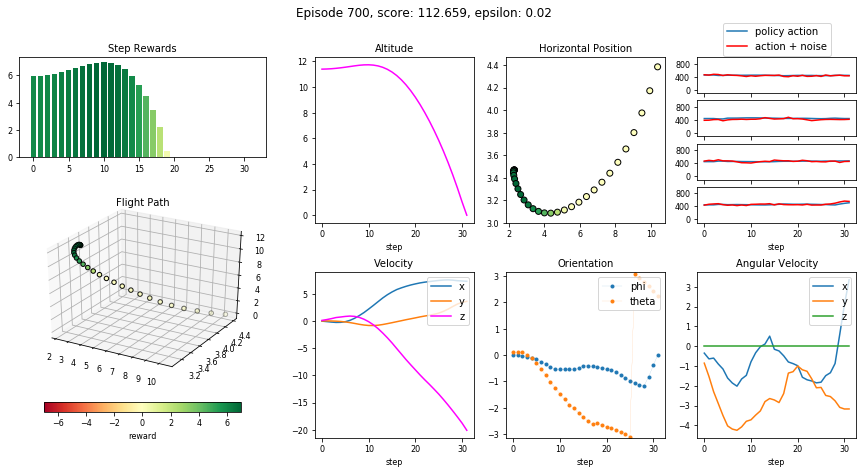

None

Episode 700 - epsilon:     0.02, memory size: 22001, num steps: 32, training score: 112.66, test score: 182.28
Episode 701 - epsilon:     0.02, memory size: 22041, num steps: 40, training score: 282.65, test score: 268.72
Episode 702 - epsilon:     0.02, memory size: 22077, num steps: 36, training score: 339.10, test score: 78.05
Episode 703 - epsilon:     0.02, memory size: 22131, num steps: 54, training score: 282.14, test score: 318.51
Episode 704 - epsilon:     0.02, memory size: 22166, num steps: 35, training score:   0.00, test score: 373.28
Episode 705 - epsilon:     0.02, memory size: 22214, num steps: 48, training score: 306.69, test score: 0.00
Episode 706 - epsilon:     0.02, memory size: 22247, num steps: 33, training score: 115.62, test score: 499.81
Episode 707 - epsilon:     0.02, memory size: 22288, num steps: 41, training score: 226.35, test score: 80.92
Episode 708 - epsilon:     0.02, memory size: 22321, num steps: 33, training score:   0.00, test score: 0.00
Episode

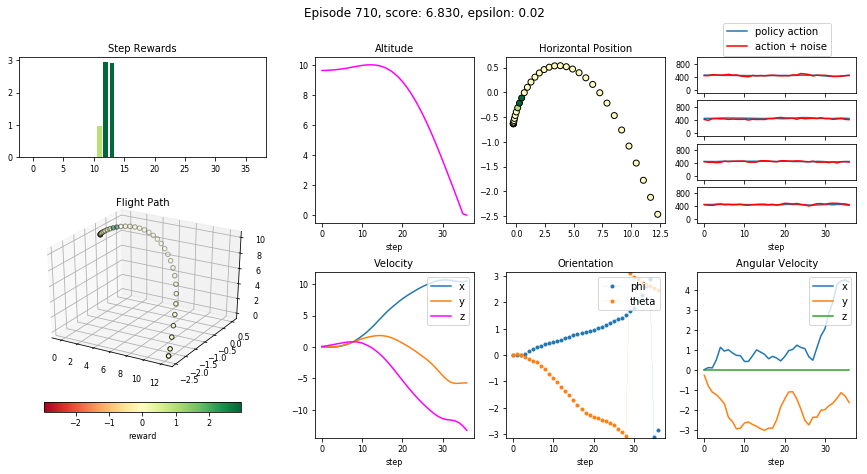

None

Episode 710 - epsilon:     0.02, memory size: 22399, num steps: 37, training score:   6.83, test score: 238.57
Episode 711 - epsilon:     0.02, memory size: 22450, num steps: 51, training score: 783.74, test score: 148.47
Episode 712 - epsilon:     0.02, memory size: 22489, num steps: 39, training score:  89.22, test score: 375.51
Episode 713 - epsilon:     0.02, memory size: 22530, num steps: 41, training score: 152.34, test score: 67.05
Episode 714 - epsilon:     0.02, memory size: 22571, num steps: 41, training score: 135.53, test score: 0.00
Episode 715 - epsilon:     0.02, memory size: 22617, num steps: 46, training score:  36.33, test score: 0.00
Episode 716 - epsilon:     0.02, memory size: 22660, num steps: 43, training score: 385.25, test score: 0.00
Episode 717 - epsilon:     0.02, memory size: 22710, num steps: 50, training score: 115.14, test score: 0.00
Episode 718 - epsilon:     0.02, memory size: 22751, num steps: 41, training score:  63.52, test score: 0.00
Episode 719 

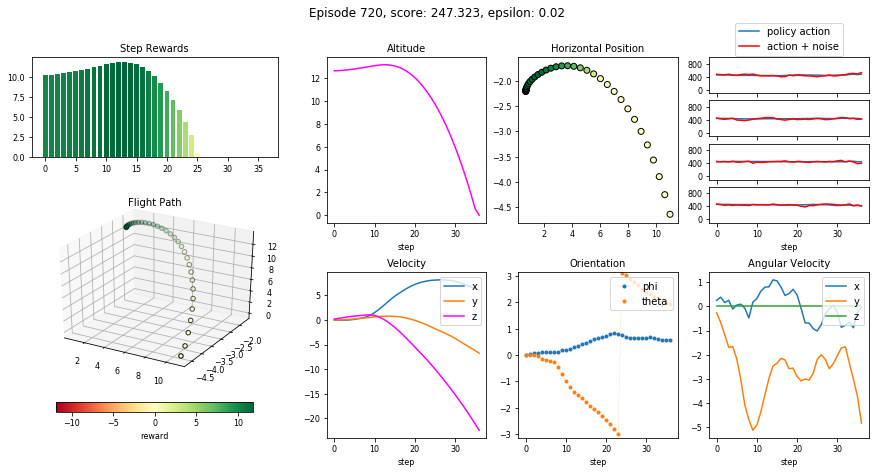

None

Episode 720 - epsilon:     0.02, memory size: 22823, num steps: 37, training score: 247.32, test score: 92.07
Episode 721 - epsilon:     0.02, memory size: 22871, num steps: 48, training score: 538.75, test score: 141.44
Episode 722 - epsilon:     0.02, memory size: 22903, num steps: 32, training score:   0.00, test score: 0.00
Episode 723 - epsilon:     0.02, memory size: 22946, num steps: 43, training score: 356.47, test score: 95.77
Episode 724 - epsilon:     0.02, memory size: 22985, num steps: 39, training score: 421.33, test score: 149.94
Episode 725 - epsilon:     0.02, memory size: 23025, num steps: 40, training score:   0.00, test score: 4.50
Episode 726 - epsilon:     0.02, memory size: 23066, num steps: 41, training score:   0.00, test score: 1145.32
Episode 727 - epsilon:     0.02, memory size: 23097, num steps: 31, training score:  70.79, test score: 187.02
Episode 728 - epsilon:     0.02, memory size: 23141, num steps: 44, training score: 283.89, test score: 0.00
Episode 

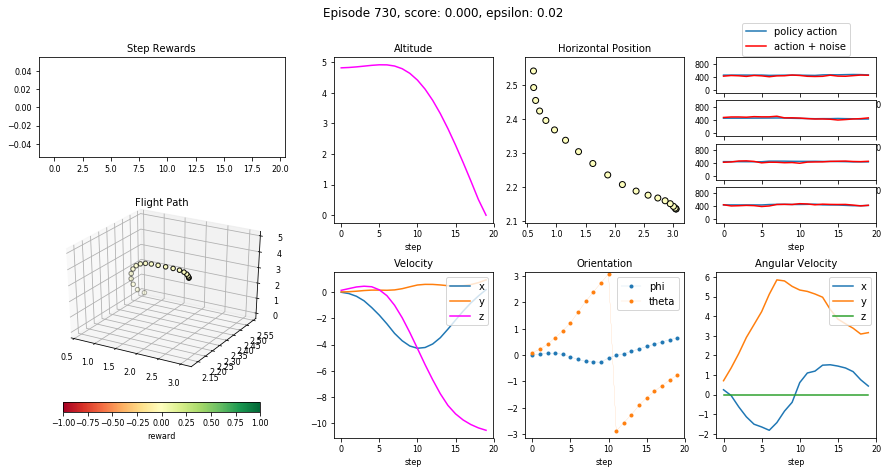

None

Episode 730 - epsilon:     0.02, memory size: 23199, num steps: 20, training score:   0.00, test score: 167.44
Episode 731 - epsilon:     0.02, memory size: 23238, num steps: 39, training score:   0.00, test score: 75.81
Episode 732 - epsilon:     0.02, memory size: 23287, num steps: 49, training score: 340.10, test score: 0.00
Episode 733 - epsilon:     0.02, memory size: 23327, num steps: 40, training score:  91.64, test score: 31.13
Episode 734 - epsilon:     0.02, memory size: 23356, num steps: 29, training score:   0.00, test score: 163.03
Episode 735 - epsilon:     0.02, memory size: 23405, num steps: 49, training score:   0.00, test score: 0.00
Episode 736 - epsilon:     0.02, memory size: 23441, num steps: 36, training score:   0.00, test score: 86.78
Episode 737 - epsilon:     0.02, memory size: 23476, num steps: 35, training score:  33.23, test score: 17.09
Episode 738 - epsilon:     0.02, memory size: 23522, num steps: 46, training score:   0.00, test score: 344.83
Episode 7

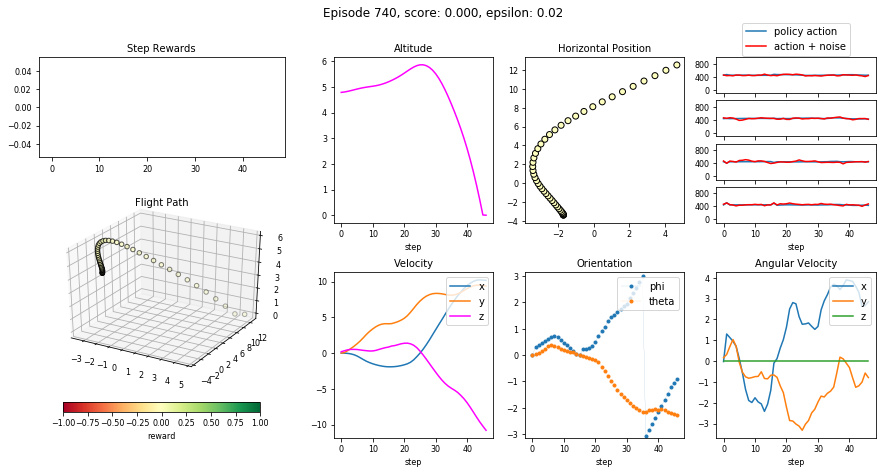

None

Episode 740 - epsilon:     0.02, memory size: 23595, num steps: 47, training score:   0.00, test score: 166.13
Episode 741 - epsilon:     0.02, memory size: 23631, num steps: 36, training score:   0.00, test score: 1046.90
Episode 742 - epsilon:     0.02, memory size: 23676, num steps: 45, training score:   0.00, test score: 0.00
Episode 743 - epsilon:     0.02, memory size: 23710, num steps: 34, training score: 276.15, test score: 433.77
Episode 744 - epsilon:     0.02, memory size: 23746, num steps: 36, training score:   0.00, test score: 1178.59
Episode 745 - epsilon:     0.02, memory size: 23768, num steps: 22, training score:   0.00, test score: 367.98
Episode 746 - epsilon:     0.02, memory size: 23812, num steps: 44, training score:  80.38, test score: 111.51
Episode 747 - epsilon:     0.02, memory size: 23848, num steps: 36, training score:  69.95, test score: 544.76
Episode 748 - epsilon:     0.02, memory size: 23891, num steps: 43, training score: 218.98, test score: 1191.51


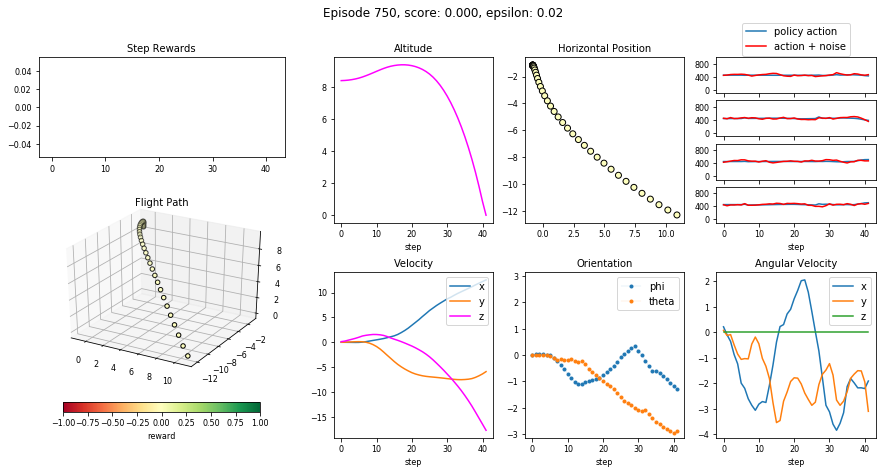

None

Episode 750 - epsilon:     0.02, memory size: 23968, num steps: 42, training score:   0.00, test score: 561.11
Episode 751 - epsilon:     0.02, memory size: 24005, num steps: 37, training score:   0.00, test score: 803.15
Episode 752 - epsilon:     0.02, memory size: 24038, num steps: 33, training score:  79.55, test score: 0.00
Episode 753 - epsilon:     0.02, memory size: 24084, num steps: 46, training score:  38.04, test score: 385.45
Episode 754 - epsilon:     0.02, memory size: 24134, num steps: 50, training score: 574.83, test score: 231.96
Episode 755 - epsilon:     0.02, memory size: 24187, num steps: 53, training score: 143.79, test score: 393.02
Episode 756 - epsilon:     0.02, memory size: 24216, num steps: 29, training score:   0.00, test score: 587.46
Episode 757 - epsilon:     0.02, memory size: 24247, num steps: 31, training score:   0.00, test score: 0.00
Episode 758 - epsilon:     0.02, memory size: 24280, num steps: 33, training score: 178.57, test score: 0.00
Episode

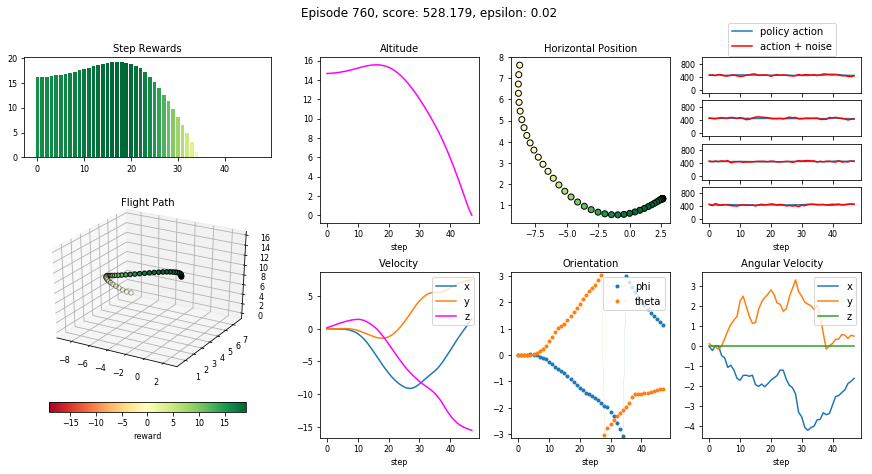

None

Episode 760 - epsilon:     0.02, memory size: 24376, num steps: 48, training score: 528.18, test score: 931.91
Episode 761 - epsilon:     0.02, memory size: 24413, num steps: 37, training score: 139.04, test score: 0.00
Episode 762 - epsilon:     0.02, memory size: 24448, num steps: 35, training score:   0.00, test score: 165.90
Episode 763 - epsilon:     0.02, memory size: 24490, num steps: 42, training score:   9.57, test score: 37.71
Episode 764 - epsilon:     0.02, memory size: 24524, num steps: 34, training score:  75.04, test score: 375.07
Episode 765 - epsilon:     0.02, memory size: 24559, num steps: 35, training score:   0.00, test score: 115.81
Episode 766 - epsilon:     0.02, memory size: 24616, num steps: 57, training score: 149.14, test score: 0.00
Episode 767 - epsilon:     0.02, memory size: 24649, num steps: 33, training score: 269.15, test score: 1058.65
Episode 768 - epsilon:     0.02, memory size: 24686, num steps: 37, training score: 121.79, test score: 89.74
Episod

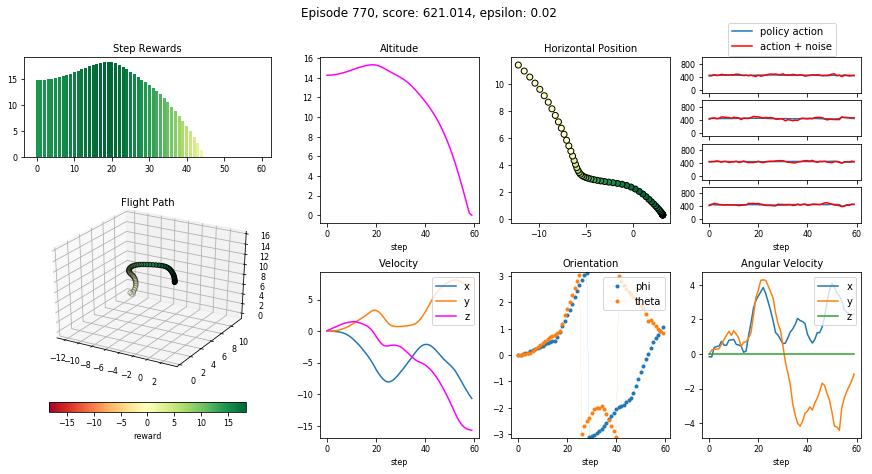

None

Episode 770 - epsilon:     0.02, memory size: 24784, num steps: 60, training score: 621.01, test score: 287.88
Episode 771 - epsilon:     0.02, memory size: 24817, num steps: 33, training score:  59.13, test score: 419.70
Episode 772 - epsilon:     0.02, memory size: 24859, num steps: 42, training score:  23.35, test score: 95.12
Episode 773 - epsilon:     0.02, memory size: 24903, num steps: 44, training score: 291.73, test score: 0.00
Episode 774 - epsilon:     0.02, memory size: 24937, num steps: 34, training score: 219.43, test score: 586.37
Episode 775 - epsilon:     0.02, memory size: 24986, num steps: 49, training score:   0.00, test score: 0.00
Episode 776 - epsilon:     0.02, memory size: 25019, num steps: 33, training score:  63.54, test score: 785.97
Episode 777 - epsilon:     0.02, memory size: 25057, num steps: 38, training score:  38.08, test score: 331.34
Episode 778 - epsilon:     0.02, memory size: 25098, num steps: 41, training score: 308.61, test score: 742.17
Episod

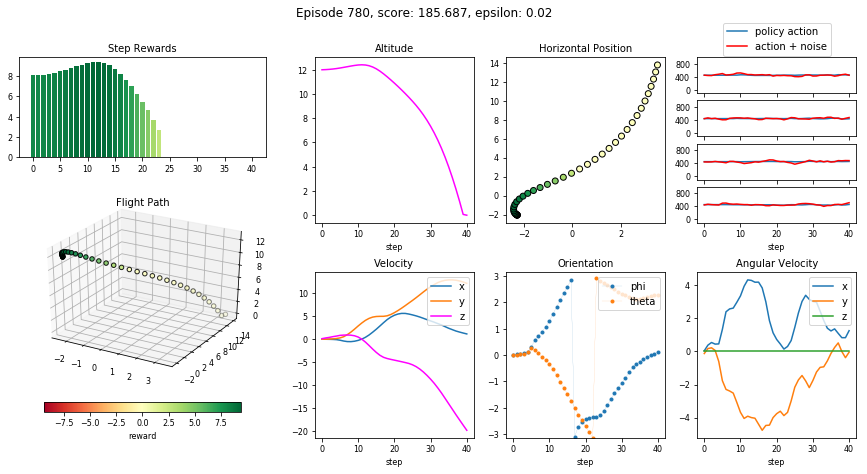

None

Episode 780 - epsilon:     0.02, memory size: 25174, num steps: 41, training score: 185.69, test score: 19.36
Episode 781 - epsilon:     0.02, memory size: 25210, num steps: 36, training score:   0.00, test score: 0.00
Episode 782 - epsilon:     0.02, memory size: 25242, num steps: 32, training score:  80.59, test score: 412.59
Episode 783 - epsilon:     0.02, memory size: 25271, num steps: 29, training score:   0.00, test score: 493.39
Episode 784 - epsilon:     0.02, memory size: 25322, num steps: 51, training score: 176.01, test score: 0.00
Episode 785 - epsilon:     0.02, memory size: 25381, num steps: 59, training score: 168.24, test score: 894.31
Episode 786 - epsilon:     0.02, memory size: 25422, num steps: 41, training score: 271.82, test score: 10.94
Episode 787 - epsilon:     0.02, memory size: 25456, num steps: 34, training score: 249.22, test score: 72.15
Episode 788 - epsilon:     0.02, memory size: 25491, num steps: 35, training score:  46.75, test score: 123.39
Episode 

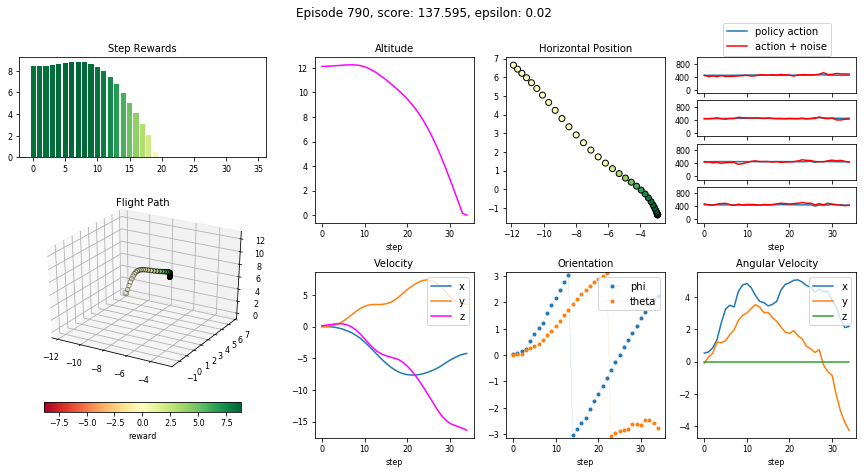

None

Episode 790 - epsilon:     0.02, memory size: 25572, num steps: 35, training score: 137.59, test score: 0.00
Episode 791 - epsilon:     0.02, memory size: 25604, num steps: 32, training score:   0.00, test score: 1347.80
Episode 792 - epsilon:     0.02, memory size: 25646, num steps: 42, training score: 262.80, test score: 295.56
Episode 793 - epsilon:     0.02, memory size: 25700, num steps: 54, training score: 437.72, test score: 215.43
Episode 794 - epsilon:     0.02, memory size: 25737, num steps: 37, training score:   0.00, test score: 1361.34
Episode 795 - epsilon:     0.02, memory size: 25776, num steps: 39, training score:  81.35, test score: 0.00
Episode 796 - epsilon:     0.02, memory size: 25830, num steps: 54, training score: 161.42, test score: 0.00
Episode 797 - epsilon:     0.02, memory size: 25874, num steps: 44, training score: 412.76, test score: 118.36
Episode 798 - epsilon:     0.02, memory size: 25913, num steps: 39, training score: 252.81, test score: 196.87
Episo

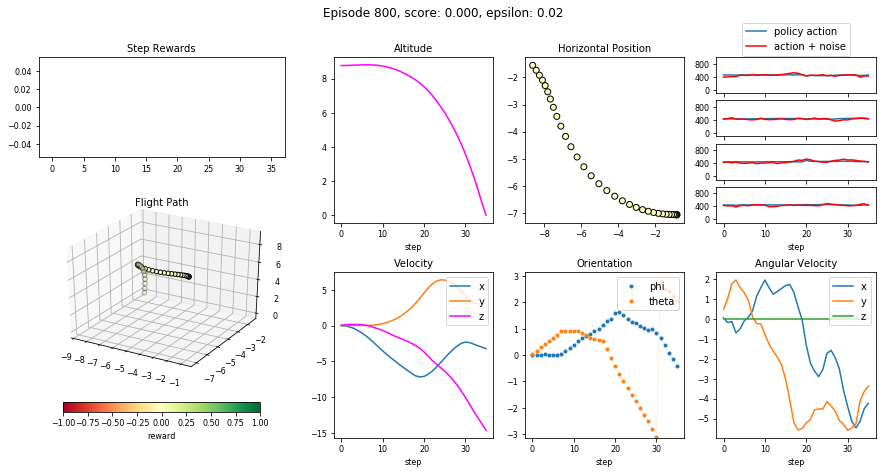

None

Episode 800 - epsilon:     0.02, memory size: 25990, num steps: 36, training score:   0.00, test score: 250.65
Episode 801 - epsilon:     0.02, memory size: 26034, num steps: 44, training score: 407.61, test score: 184.14
Episode 802 - epsilon:     0.02, memory size: 26069, num steps: 35, training score:   0.00, test score: 485.90
Episode 803 - epsilon:     0.02, memory size: 26124, num steps: 55, training score: 689.00, test score: 0.00
Episode 804 - epsilon:     0.02, memory size: 26165, num steps: 41, training score:  41.28, test score: 591.33
Episode 805 - epsilon:     0.02, memory size: 26209, num steps: 44, training score:   0.00, test score: 146.23
Episode 806 - epsilon:     0.02, memory size: 26242, num steps: 33, training score:  25.83, test score: 0.00
Episode 807 - epsilon:     0.02, memory size: 26284, num steps: 42, training score:   0.00, test score: 358.44
Episode 808 - epsilon:     0.02, memory size: 26342, num steps: 58, training score: 564.57, test score: 56.73
Episod

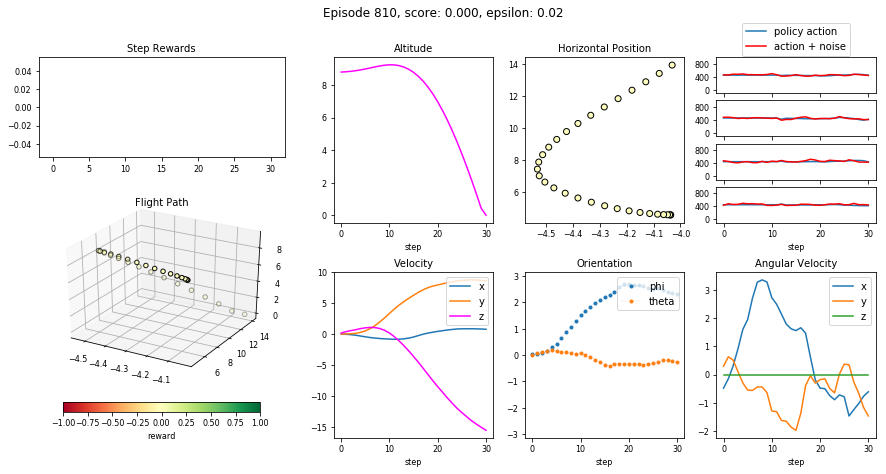

None

Episode 810 - epsilon:     0.02, memory size: 26409, num steps: 31, training score:   0.00, test score: 880.58
Episode 811 - epsilon:     0.02, memory size: 26443, num steps: 34, training score: 215.72, test score: 354.22
Episode 812 - epsilon:     0.02, memory size: 26479, num steps: 36, training score:   0.00, test score: 31.45
Episode 813 - epsilon:     0.02, memory size: 26516, num steps: 37, training score:   0.00, test score: 678.09
Episode 814 - epsilon:     0.02, memory size: 26550, num steps: 34, training score: 105.81, test score: 0.00
Episode 815 - epsilon:     0.02, memory size: 26601, num steps: 51, training score: 141.32, test score: 0.00
Episode 816 - epsilon:     0.02, memory size: 26632, num steps: 31, training score:   0.00, test score: 222.27
Episode 817 - epsilon:     0.02, memory size: 26667, num steps: 35, training score: 214.44, test score: 54.86
Episode 818 - epsilon:     0.02, memory size: 26710, num steps: 43, training score: 302.94, test score: 53.03
Episode 

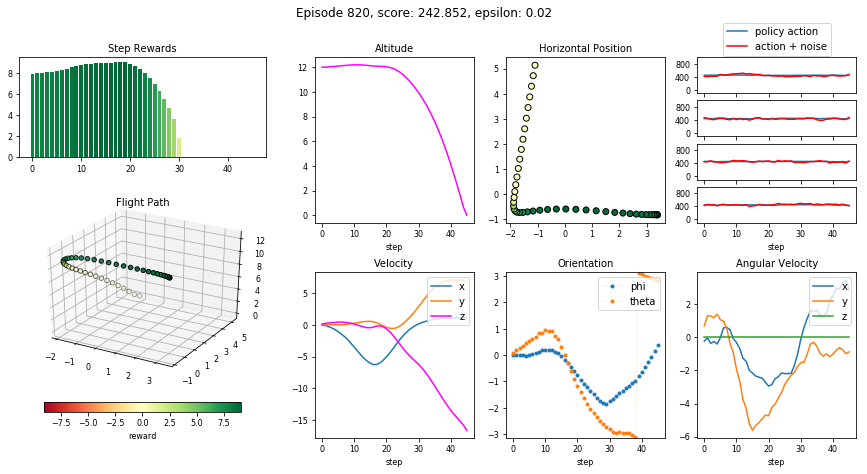

None

Episode 820 - epsilon:     0.02, memory size: 26784, num steps: 46, training score: 242.85, test score: 0.00
Episode 821 - epsilon:     0.02, memory size: 26825, num steps: 41, training score:  48.71, test score: 68.98
New best test score.


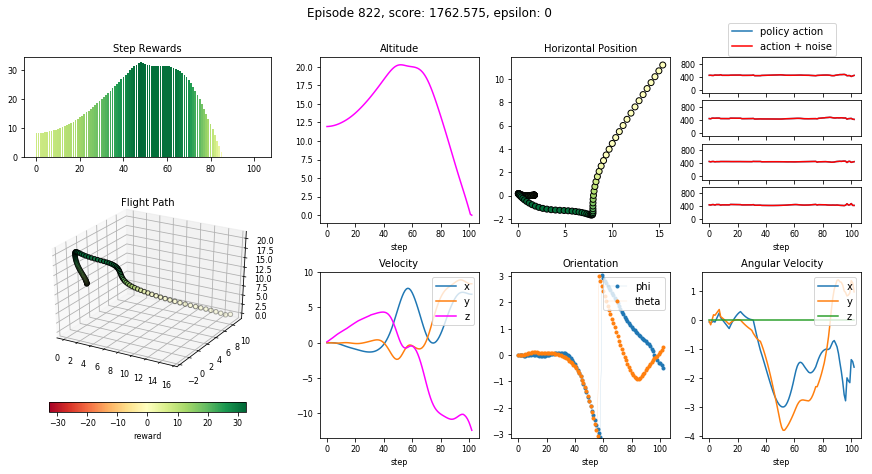

None

Episode 822 - epsilon:     0.02, memory size: 26864, num steps: 39, training score: 119.80, test score: 1762.57
Episode 823 - epsilon:     0.02, memory size: 26892, num steps: 28, training score:   0.00, test score: 1358.48
Episode 824 - epsilon:     0.02, memory size: 26929, num steps: 37, training score: 313.03, test score: 675.57
Episode 825 - epsilon:     0.02, memory size: 26978, num steps: 49, training score:   0.00, test score: 311.21
Episode 826 - epsilon:     0.02, memory size: 27012, num steps: 34, training score:   0.00, test score: 474.32
Episode 827 - epsilon:     0.02, memory size: 27051, num steps: 39, training score: 329.09, test score: 382.71
Episode 828 - epsilon:     0.02, memory size: 27106, num steps: 55, training score: 215.06, test score: 1494.74
Episode 829 - epsilon:     0.02, memory size: 27153, num steps: 47, training score:   0.00, test score: 0.00


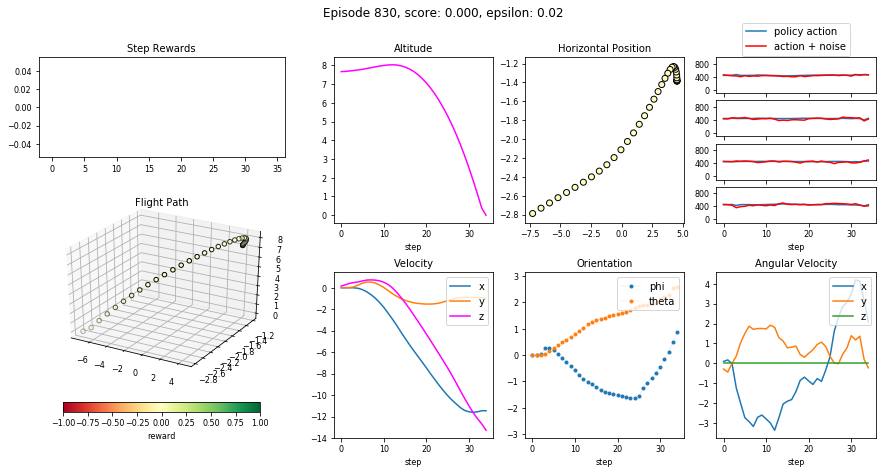

None

Episode 830 - epsilon:     0.02, memory size: 27188, num steps: 35, training score:   0.00, test score: 10.76
Episode 831 - epsilon:     0.02, memory size: 27227, num steps: 39, training score:   0.00, test score: 495.20
Episode 832 - epsilon:     0.02, memory size: 27270, num steps: 43, training score:   0.00, test score: 193.53
Episode 833 - epsilon:     0.02, memory size: 27317, num steps: 47, training score:  30.10, test score: 32.07
Episode 834 - epsilon:     0.02, memory size: 27346, num steps: 29, training score:   0.00, test score: 117.13
Episode 835 - epsilon:     0.02, memory size: 27383, num steps: 37, training score:   0.00, test score: 0.00
Episode 836 - epsilon:     0.02, memory size: 27421, num steps: 38, training score:   0.00, test score: 1173.79
Episode 837 - epsilon:     0.02, memory size: 27458, num steps: 37, training score:  56.80, test score: 0.00
Episode 838 - epsilon:     0.02, memory size: 27498, num steps: 40, training score: 317.98, test score: 929.86
Episod

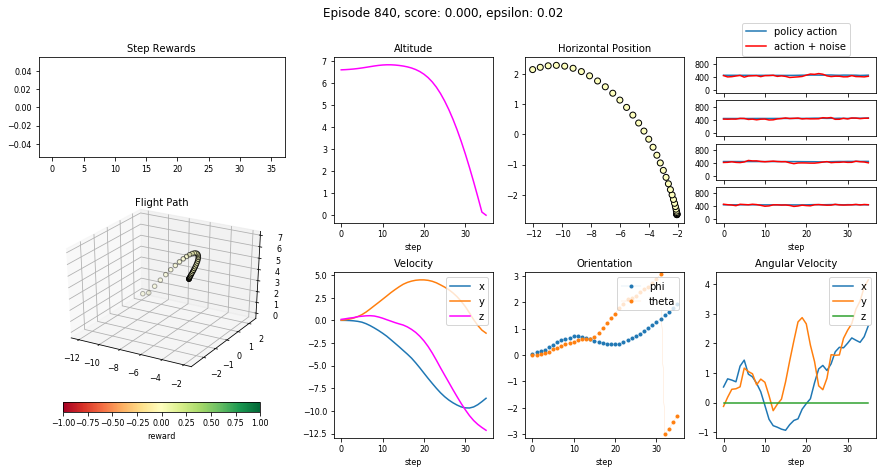

None

Episode 840 - epsilon:     0.02, memory size: 27569, num steps: 36, training score:   0.00, test score: 623.17
Episode 841 - epsilon:     0.02, memory size: 27606, num steps: 37, training score: 268.63, test score: 341.96
Episode 842 - epsilon:     0.02, memory size: 27637, num steps: 31, training score:  61.59, test score: 0.00
Episode 843 - epsilon:     0.02, memory size: 27674, num steps: 37, training score:   0.00, test score: 70.26
Episode 844 - epsilon:     0.02, memory size: 27713, num steps: 39, training score:   0.00, test score: 285.22
Episode 845 - epsilon:     0.02, memory size: 27751, num steps: 38, training score:  42.30, test score: 0.00
Episode 846 - epsilon:     0.02, memory size: 27778, num steps: 27, training score:   0.00, test score: 0.00
Episode 847 - epsilon:     0.02, memory size: 27804, num steps: 26, training score:   0.00, test score: 262.70
Episode 848 - epsilon:     0.02, memory size: 27855, num steps: 51, training score: 147.77, test score: 479.22
Episode 

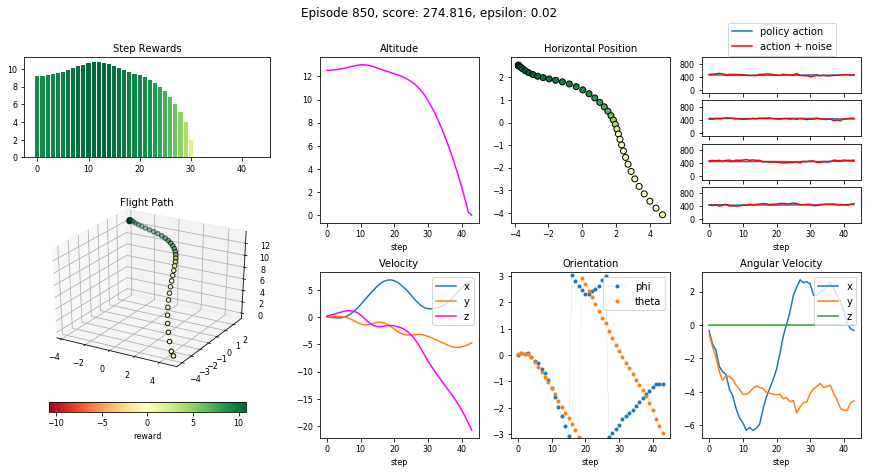

None

Episode 850 - epsilon:     0.02, memory size: 27965, num steps: 44, training score: 274.82, test score: 31.15
Episode 851 - epsilon:     0.02, memory size: 28014, num steps: 49, training score: 304.69, test score: 9.75
Episode 852 - epsilon:     0.02, memory size: 28049, num steps: 35, training score:   0.00, test score: 636.10
Episode 853 - epsilon:     0.02, memory size: 28093, num steps: 44, training score: 286.73, test score: 1053.39
Episode 854 - epsilon:     0.02, memory size: 28126, num steps: 33, training score: 166.45, test score: 634.03
Episode 855 - epsilon:     0.02, memory size: 28173, num steps: 47, training score:   0.00, test score: 0.00
Episode 856 - epsilon:     0.02, memory size: 28209, num steps: 36, training score:  98.96, test score: 0.00
Episode 857 - epsilon:     0.02, memory size: 28250, num steps: 41, training score:   0.00, test score: 1368.03
Episode 858 - epsilon:     0.02, memory size: 28278, num steps: 28, training score:   0.00, test score: 0.00
Episode 

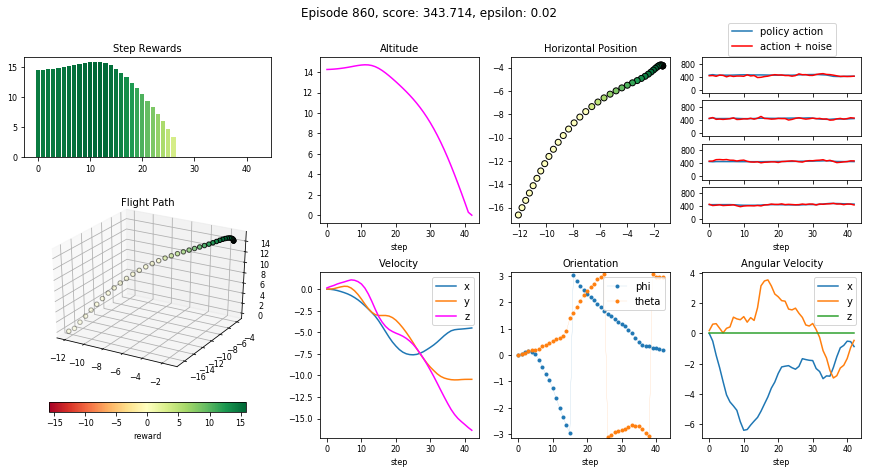

None

Episode 860 - epsilon:     0.02, memory size: 28352, num steps: 43, training score: 343.71, test score: 331.60
Episode 861 - epsilon:     0.02, memory size: 28382, num steps: 30, training score: 247.85, test score: 239.79
Episode 862 - epsilon:     0.02, memory size: 28413, num steps: 31, training score:   0.00, test score: 534.09
Episode 863 - epsilon:     0.02, memory size: 28441, num steps: 28, training score:   0.00, test score: 485.16
Episode 864 - epsilon:     0.02, memory size: 28469, num steps: 28, training score:   0.00, test score: 10.37
Episode 865 - epsilon:     0.02, memory size: 28503, num steps: 34, training score:   0.00, test score: 237.04
Episode 866 - epsilon:     0.02, memory size: 28537, num steps: 34, training score:   0.00, test score: 0.00
Episode 867 - epsilon:     0.02, memory size: 28571, num steps: 34, training score:   0.00, test score: 0.00
Episode 868 - epsilon:     0.02, memory size: 28608, num steps: 37, training score:   0.00, test score: 26.62
Episode

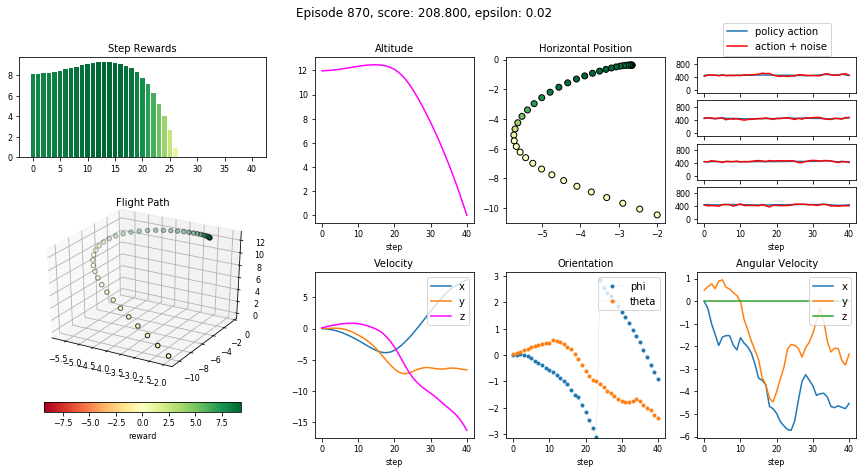

None

Episode 870 - epsilon:     0.02, memory size: 28684, num steps: 41, training score: 208.80, test score: 366.38
Episode 871 - epsilon:     0.02, memory size: 28733, num steps: 49, training score: 411.86, test score: 827.48
Episode 872 - epsilon:     0.02, memory size: 28769, num steps: 36, training score: 253.41, test score: 1333.36
Episode 873 - epsilon:     0.02, memory size: 28804, num steps: 35, training score:  91.63, test score: 265.98
Episode 874 - epsilon:     0.02, memory size: 28838, num steps: 34, training score:   3.95, test score: 343.31
Episode 875 - epsilon:     0.02, memory size: 28877, num steps: 39, training score:   0.00, test score: 169.57
Episode 876 - epsilon:     0.02, memory size: 28907, num steps: 30, training score: 139.20, test score: 220.47
Episode 877 - epsilon:     0.02, memory size: 28942, num steps: 35, training score:  95.38, test score: 0.00
Episode 878 - epsilon:     0.02, memory size: 28975, num steps: 33, training score:  14.71, test score: 40.81
Epi

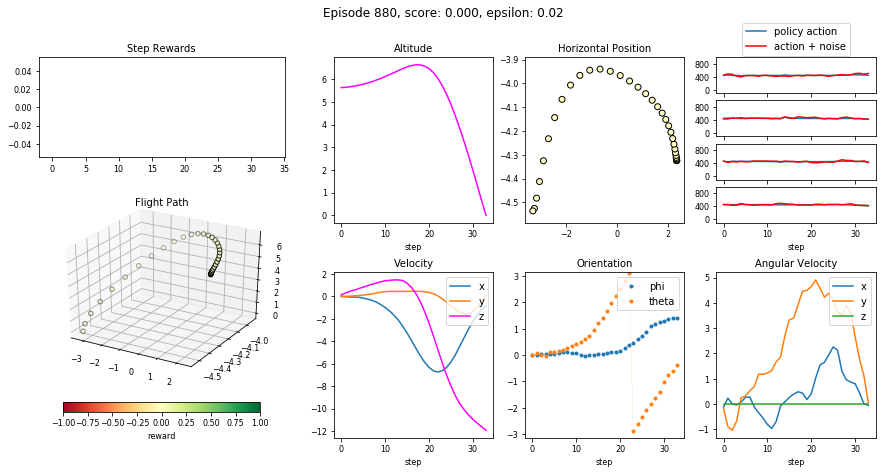

None

Episode 880 - epsilon:     0.02, memory size: 29057, num steps: 34, training score:   0.00, test score: 0.00
Episode 881 - epsilon:     0.02, memory size: 29102, num steps: 45, training score:  10.03, test score: 521.05
Episode 882 - epsilon:     0.02, memory size: 29136, num steps: 34, training score:   0.00, test score: 43.55
Episode 883 - epsilon:     0.02, memory size: 29183, num steps: 47, training score: 394.41, test score: 333.37
Episode 884 - epsilon:     0.02, memory size: 29227, num steps: 44, training score:  49.29, test score: 0.00
Episode 885 - epsilon:     0.02, memory size: 29278, num steps: 51, training score: 555.00, test score: 328.10
Episode 886 - epsilon:     0.02, memory size: 29327, num steps: 49, training score: 153.57, test score: 437.34
Episode 887 - epsilon:     0.02, memory size: 29376, num steps: 49, training score: 265.93, test score: 442.45
Episode 888 - epsilon:     0.02, memory size: 29405, num steps: 29, training score:   0.00, test score: 271.13
Episod

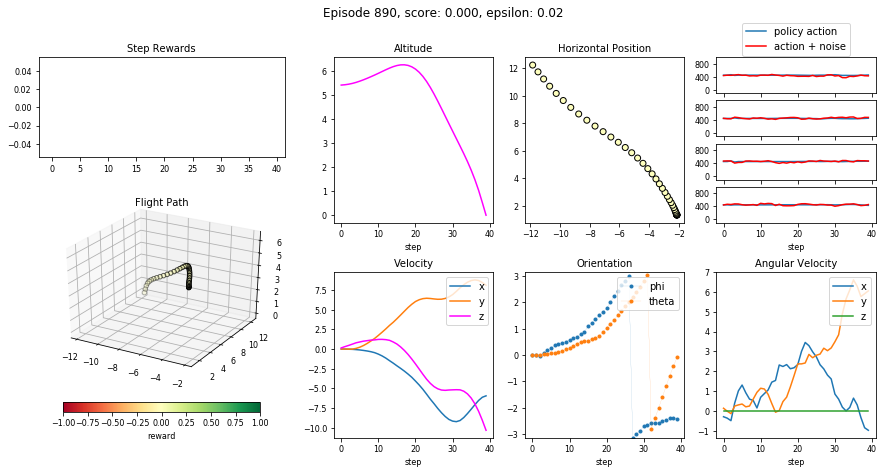

None

Episode 890 - epsilon:     0.02, memory size: 29510, num steps: 40, training score:   0.00, test score: 1046.26
Episode 891 - epsilon:     0.02, memory size: 29546, num steps: 36, training score:   0.00, test score: 476.02
Episode 892 - epsilon:     0.02, memory size: 29592, num steps: 46, training score: 170.94, test score: 711.74
Episode 893 - epsilon:     0.02, memory size: 29631, num steps: 39, training score:   0.00, test score: 0.00
Episode 894 - epsilon:     0.02, memory size: 29670, num steps: 39, training score: 320.63, test score: 782.74
Episode 895 - epsilon:     0.02, memory size: 29707, num steps: 37, training score: 288.47, test score: 28.06
Episode 896 - epsilon:     0.02, memory size: 29745, num steps: 38, training score:   0.00, test score: 264.52
Episode 897 - epsilon:     0.02, memory size: 29780, num steps: 35, training score:   0.00, test score: 65.86
Episode 898 - epsilon:     0.02, memory size: 29817, num steps: 37, training score: 143.36, test score: 611.90
Epis

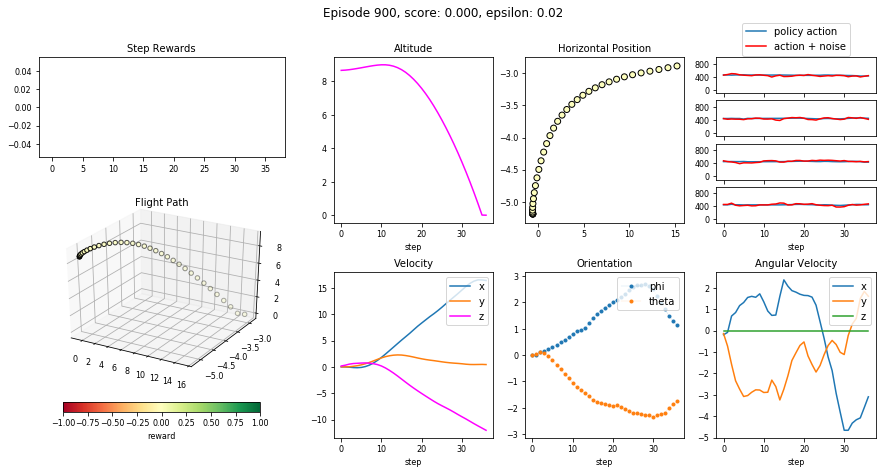

None

Episode 900 - epsilon:     0.02, memory size: 29882, num steps: 37, training score:   0.00, test score: 712.84
Episode 901 - epsilon:     0.02, memory size: 29917, num steps: 35, training score:   0.00, test score: 543.31
Episode 902 - epsilon:     0.02, memory size: 29950, num steps: 33, training score:   0.00, test score: 0.00
Episode 903 - epsilon:     0.02, memory size: 29990, num steps: 40, training score:   0.00, test score: 307.31
Episode 904 - epsilon:     0.02, memory size: 30026, num steps: 36, training score: 121.77, test score: 0.00
Episode 905 - epsilon:     0.02, memory size: 30061, num steps: 35, training score: 252.60, test score: 61.13
Episode 906 - epsilon:     0.02, memory size: 30094, num steps: 33, training score:  60.14, test score: 0.00
Episode 907 - epsilon:     0.02, memory size: 30125, num steps: 31, training score:   0.00, test score: 1173.90
Episode 908 - epsilon:     0.02, memory size: 30167, num steps: 42, training score:  55.88, test score: 355.11
Episode

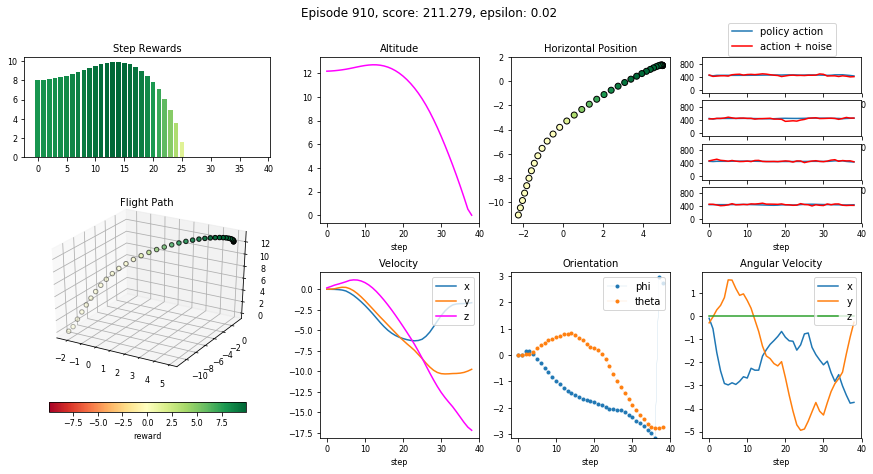

None

Episode 910 - epsilon:     0.02, memory size: 30257, num steps: 39, training score: 211.28, test score: 290.98
Episode 911 - epsilon:     0.02, memory size: 30288, num steps: 31, training score:   0.00, test score: 98.35
Episode 912 - epsilon:     0.02, memory size: 30323, num steps: 35, training score:  68.62, test score: 0.00
Episode 913 - epsilon:     0.02, memory size: 30362, num steps: 39, training score: 196.88, test score: 1294.47
Episode 914 - epsilon:     0.02, memory size: 30390, num steps: 28, training score:   0.00, test score: 143.44
Episode 915 - epsilon:     0.02, memory size: 30429, num steps: 39, training score:   0.00, test score: 0.00
Episode 916 - epsilon:     0.02, memory size: 30463, num steps: 34, training score:   0.00, test score: 667.37
Episode 917 - epsilon:     0.02, memory size: 30517, num steps: 54, training score: 626.74, test score: 147.20
Episode 918 - epsilon:     0.02, memory size: 30563, num steps: 46, training score: 687.58, test score: 453.10
Episo

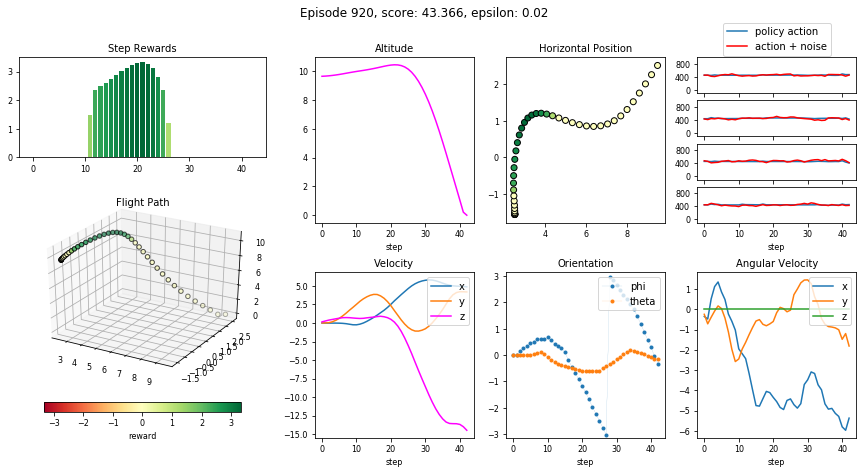

None

Episode 920 - epsilon:     0.02, memory size: 30644, num steps: 43, training score:  43.37, test score: 0.00
Episode 921 - epsilon:     0.02, memory size: 30677, num steps: 33, training score:   0.00, test score: 191.12
Episode 922 - epsilon:     0.02, memory size: 30706, num steps: 29, training score:   0.00, test score: 543.94
Episode 923 - epsilon:     0.02, memory size: 30773, num steps: 67, training score:   0.00, test score: 0.00
Episode 924 - epsilon:     0.02, memory size: 30810, num steps: 37, training score: 231.31, test score: 194.70
Episode 925 - epsilon:     0.02, memory size: 30849, num steps: 39, training score:   0.00, test score: 830.64
Episode 926 - epsilon:     0.02, memory size: 30882, num steps: 33, training score:   0.00, test score: 36.07
Episode 927 - epsilon:     0.02, memory size: 30912, num steps: 30, training score:   0.00, test score: 0.00
Episode 928 - epsilon:     0.02, memory size: 30945, num steps: 33, training score:   0.00, test score: 573.32
Episode 

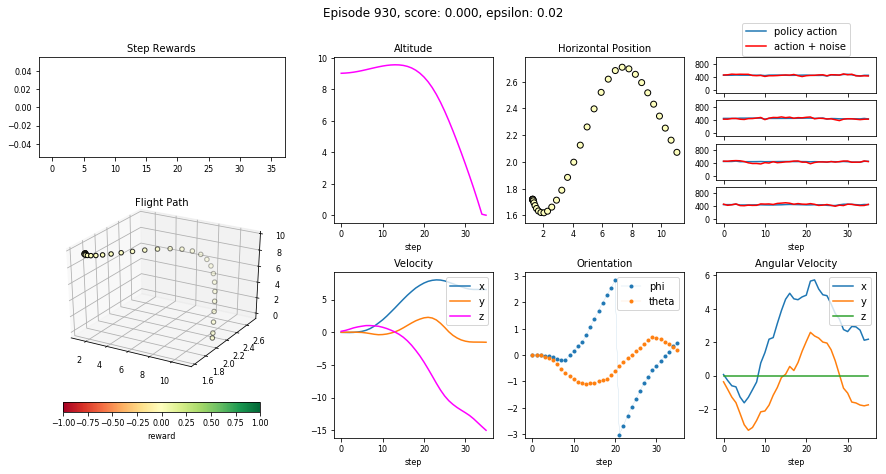

None

Episode 930 - epsilon:     0.02, memory size: 31015, num steps: 36, training score:   0.00, test score: 7.73
Episode 931 - epsilon:     0.02, memory size: 31053, num steps: 38, training score: 168.66, test score: 471.90
Episode 932 - epsilon:     0.02, memory size: 31102, num steps: 49, training score: 270.15, test score: 0.00
Episode 933 - epsilon:     0.02, memory size: 31145, num steps: 43, training score:   0.00, test score: 0.00
Episode 934 - epsilon:     0.02, memory size: 31184, num steps: 39, training score:   0.00, test score: 393.40
Episode 935 - epsilon:     0.02, memory size: 31219, num steps: 35, training score: 202.08, test score: 0.00
Episode 936 - epsilon:     0.02, memory size: 31258, num steps: 39, training score:   0.00, test score: 1311.92
Episode 937 - epsilon:     0.02, memory size: 31289, num steps: 31, training score:   0.00, test score: 231.40
Episode 938 - epsilon:     0.02, memory size: 31322, num steps: 33, training score: 173.99, test score: 323.59
Episode 

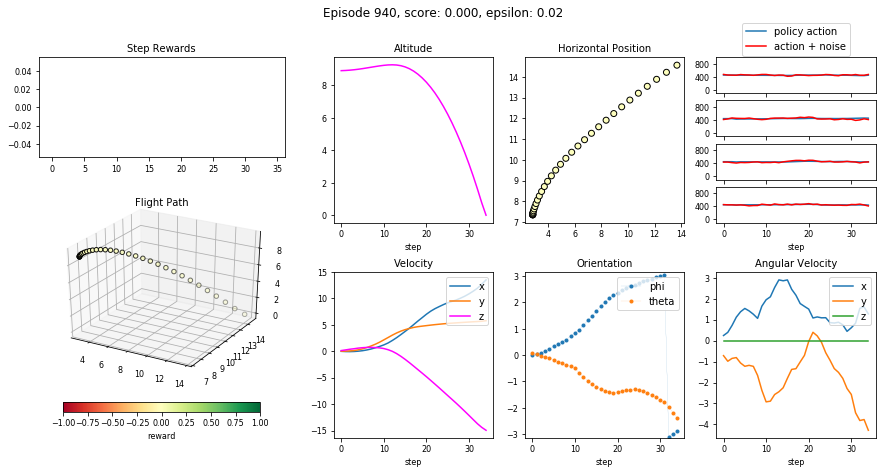

None

Episode 940 - epsilon:     0.02, memory size: 31391, num steps: 35, training score:   0.00, test score: 485.49
Episode 941 - epsilon:     0.02, memory size: 31415, num steps: 24, training score:   0.00, test score: 142.13
Episode 942 - epsilon:     0.02, memory size: 31451, num steps: 36, training score: 193.18, test score: 312.03
Episode 943 - epsilon:     0.02, memory size: 31494, num steps: 43, training score: 144.59, test score: 0.00
Episode 944 - epsilon:     0.02, memory size: 31543, num steps: 49, training score:   0.00, test score: 619.61
Episode 945 - epsilon:     0.02, memory size: 31575, num steps: 32, training score:   0.00, test score: 0.00
Episode 946 - epsilon:     0.02, memory size: 31620, num steps: 45, training score: 512.47, test score: 40.79
Episode 947 - epsilon:     0.02, memory size: 31660, num steps: 40, training score: 134.84, test score: 127.28
Episode 948 - epsilon:     0.02, memory size: 31692, num steps: 32, training score: 250.48, test score: 106.62
Episod

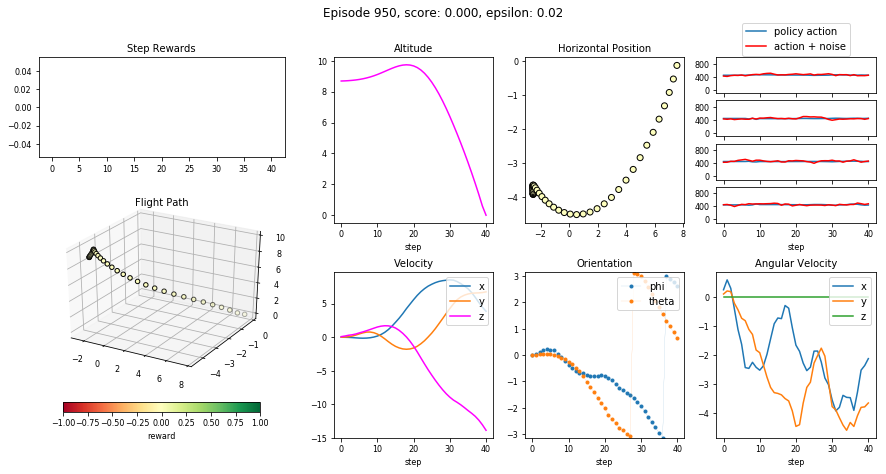

None

Episode 950 - epsilon:     0.02, memory size: 31769, num steps: 41, training score:   0.00, test score: 638.77
Episode 951 - epsilon:     0.02, memory size: 31796, num steps: 27, training score: 114.91, test score: 368.09
Episode 952 - epsilon:     0.02, memory size: 31827, num steps: 31, training score:   0.00, test score: 907.82
Episode 953 - epsilon:     0.02, memory size: 31859, num steps: 32, training score:   0.00, test score: 609.09
Episode 954 - epsilon:     0.02, memory size: 31902, num steps: 43, training score: 409.61, test score: 398.40
Episode 955 - epsilon:     0.02, memory size: 31952, num steps: 50, training score: 480.54, test score: 449.04
Episode 956 - epsilon:     0.02, memory size: 31992, num steps: 40, training score:   5.22, test score: 343.76
Episode 957 - epsilon:     0.02, memory size: 32020, num steps: 28, training score:   0.00, test score: 204.20
Episode 958 - epsilon:     0.02, memory size: 32074, num steps: 54, training score: 214.33, test score: 358.99
E

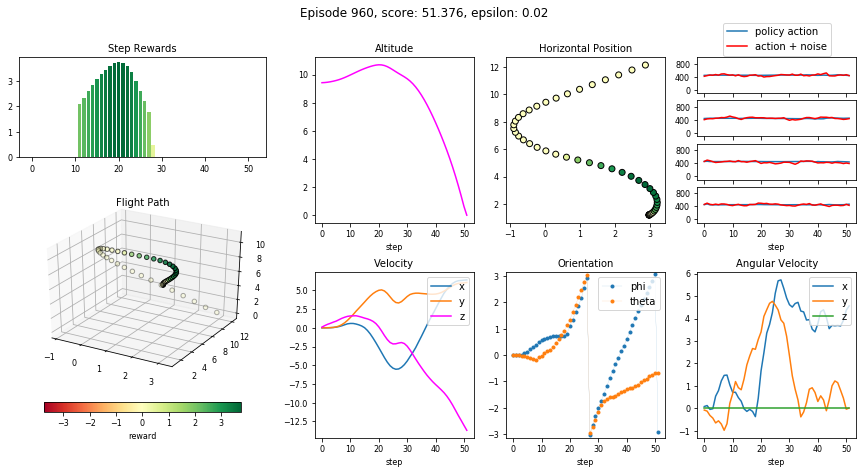

None

Episode 960 - epsilon:     0.02, memory size: 32170, num steps: 52, training score:  51.38, test score: 682.79
Episode 961 - epsilon:     0.02, memory size: 32214, num steps: 44, training score:  66.06, test score: 326.63
Episode 962 - epsilon:     0.02, memory size: 32261, num steps: 47, training score:   0.00, test score: 25.37
Episode 963 - epsilon:     0.02, memory size: 32302, num steps: 41, training score: 212.46, test score: 514.33
Episode 964 - epsilon:     0.02, memory size: 32335, num steps: 33, training score:   0.00, test score: 958.38
Episode 965 - epsilon:     0.02, memory size: 32366, num steps: 31, training score:   0.00, test score: 1550.37
Episode 966 - epsilon:     0.02, memory size: 32417, num steps: 51, training score: 102.00, test score: 167.78
Episode 967 - epsilon:     0.02, memory size: 32459, num steps: 42, training score:   0.00, test score: 589.41
Episode 968 - epsilon:     0.02, memory size: 32521, num steps: 62, training score: 677.62, test score: 0.00
Epi

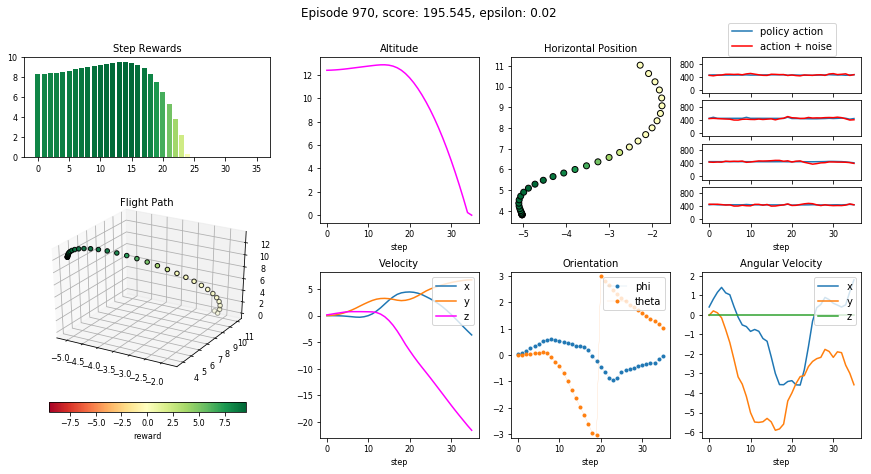

None

Episode 970 - epsilon:     0.02, memory size: 32592, num steps: 36, training score: 195.55, test score: 531.40
Episode 971 - epsilon:     0.02, memory size: 32629, num steps: 37, training score:   0.00, test score: 26.38
Episode 972 - epsilon:     0.02, memory size: 32692, num steps: 63, training score: 244.97, test score: 694.95
Episode 973 - epsilon:     0.02, memory size: 32725, num steps: 33, training score:  67.60, test score: 418.41
Episode 974 - epsilon:     0.02, memory size: 32765, num steps: 40, training score: 186.10, test score: 752.23
Episode 975 - epsilon:     0.02, memory size: 32801, num steps: 36, training score:   0.00, test score: 0.00
Episode 976 - epsilon:     0.02, memory size: 32848, num steps: 47, training score: 305.50, test score: 0.00
Episode 977 - epsilon:     0.02, memory size: 32884, num steps: 36, training score:  37.24, test score: 382.09
Episode 978 - epsilon:     0.02, memory size: 32937, num steps: 53, training score:  67.11, test score: 342.10
Episod

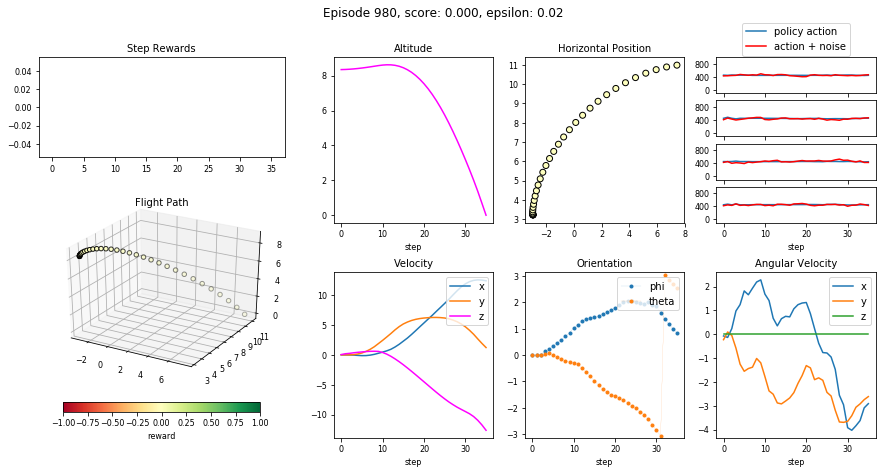

None

Episode 980 - epsilon:     0.02, memory size: 33004, num steps: 36, training score:   0.00, test score: 0.00
Episode 981 - epsilon:     0.02, memory size: 33044, num steps: 40, training score:  94.75, test score: 395.81
Episode 982 - epsilon:     0.02, memory size: 33098, num steps: 54, training score:  32.70, test score: 625.03
Episode 983 - epsilon:     0.02, memory size: 33148, num steps: 50, training score: 642.52, test score: 0.00
Episode 984 - epsilon:     0.02, memory size: 33184, num steps: 36, training score:   0.00, test score: 0.00
Episode 985 - epsilon:     0.02, memory size: 33215, num steps: 31, training score:   0.00, test score: 0.00
Episode 986 - epsilon:     0.02, memory size: 33258, num steps: 43, training score: 434.28, test score: 0.00
Episode 987 - epsilon:     0.02, memory size: 33292, num steps: 34, training score: 139.63, test score: 99.71
Episode 988 - epsilon:     0.02, memory size: 33321, num steps: 29, training score:   0.00, test score: 16.46
Episode 989 -

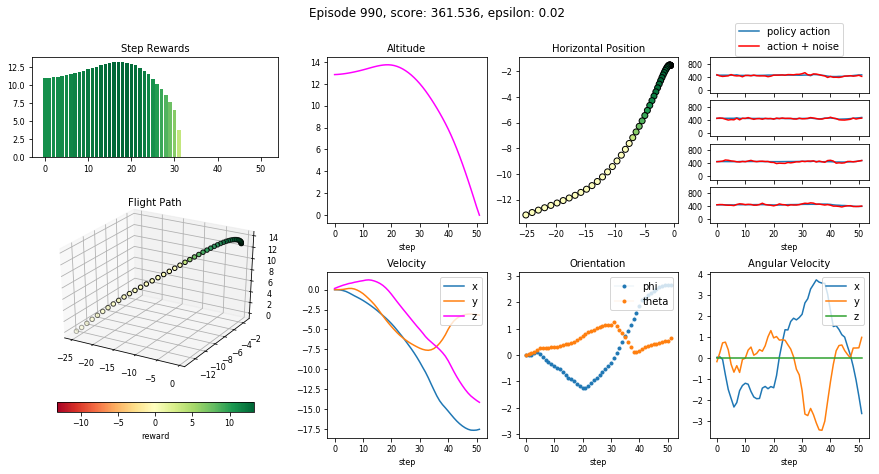

None

Episode 990 - epsilon:     0.02, memory size: 33409, num steps: 52, training score: 361.54, test score: 284.40
Episode 991 - epsilon:     0.02, memory size: 33446, num steps: 37, training score:   0.00, test score: 1555.57
Episode 992 - epsilon:     0.02, memory size: 33495, num steps: 49, training score:  21.43, test score: 0.00
Episode 993 - epsilon:     0.02, memory size: 33536, num steps: 41, training score:   0.00, test score: 420.84
Episode 994 - epsilon:     0.02, memory size: 33593, num steps: 57, training score:   0.00, test score: 344.92
Episode 995 - epsilon:     0.02, memory size: 33635, num steps: 42, training score:   0.00, test score: 0.00
Episode 996 - epsilon:     0.02, memory size: 33672, num steps: 37, training score: 271.26, test score: 29.71
Episode 997 - epsilon:     0.02, memory size: 33705, num steps: 33, training score: 227.46, test score: 0.00
Episode 998 - epsilon:     0.02, memory size: 33735, num steps: 30, training score:   0.00, test score: 0.00
Episode 9

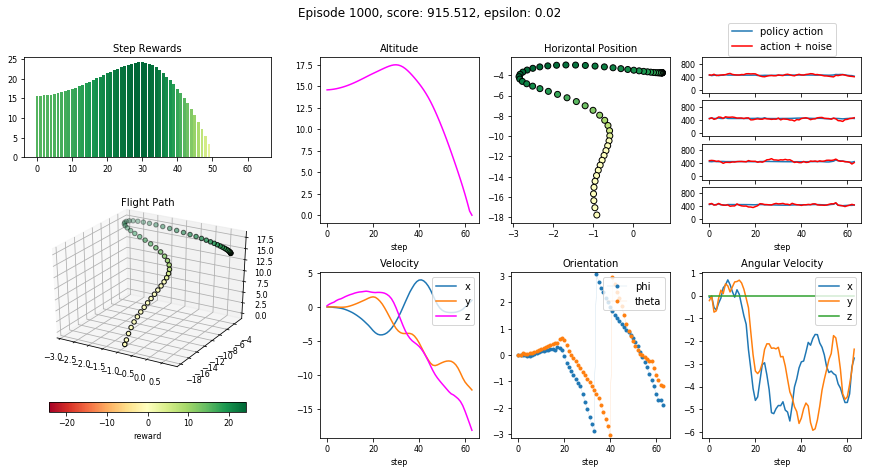

None

Episode 1000 - epsilon:     0.02, memory size: 33836, num steps: 64, training score: 915.51, test score: 697.42


In [5]:
agent.train_n_episodes(500, eps=.02, act_random_first_n_episodes=50 )

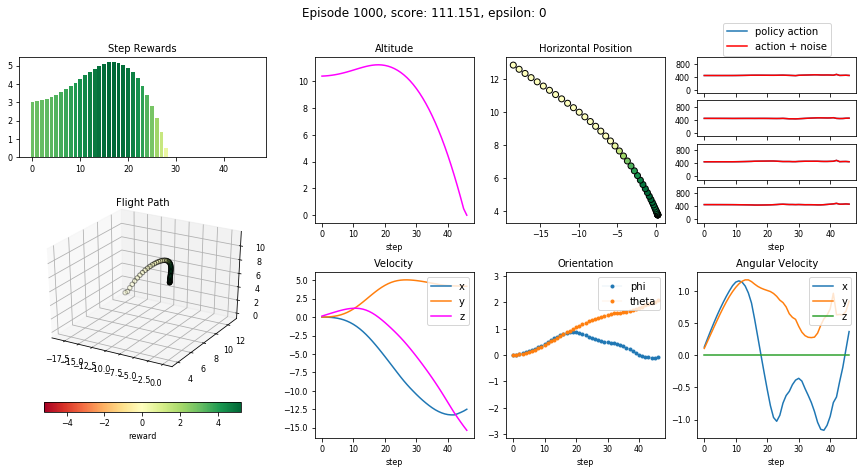

In [28]:
plot_quadcopter_episode(agent.history.test_episodes[-1])

## Plot the Rewards

Once you are satisfied with your performance, plot the episode rewards, either from a single run, or averaged over multiple runs. 

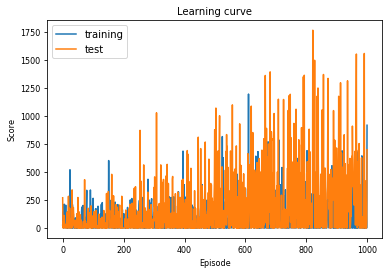

In [6]:
plot_scores([ep.score for ep in agent.history.training_episodes], [ep.score for ep in agent.history.test_episodes])

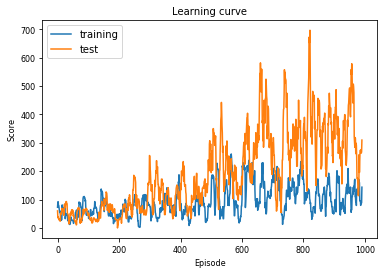

In [7]:
plot_scores(rolling_mean([ep.score for ep in agent.history.training_episodes],10),
           rolling_mean([ep.score for ep in agent.history.test_episodes],10))

## Reflections

**Question 1**: Describe the task that you specified in `task.py`.  How did you design the reward function?

**Answer**: 

The reward function I defined in `task.py` was designed to reward the agent for being within 10m of the target position with increasing reward magnitude as it approaches the center of the target. The intention is that it might learn to maximize rewards by hovering at the target position until the episode ends. 
``` python
    if vert_dist<10 and horiz_dist<10:
        reward += 10-vert_dist
        reward += .1*(10-horiz_dist)
```
The reward is split into two components, one for vertical distance from goal and the other for horizontal distance from goal, with a factor of .1 applied to horizontal distance and 1 for vertical distance as vertical distance is, somwhat subjectively, considered to be more important for this task.

Additionally, some noise is added to the starting position at the beginning of each episode instead of starting at the same place every time. In `Task.reset`: 
``` python 
    # Add some noise to the starting position
    self.sim.pose[:3] += np.random.normal(0,3,3)
```
Similar to data augmentation in traditional supervised machine learning, this approach is intended to help the agent learn a policy that will better generalize to unvisited states. It will also allow the agent to visit higher-value states early on just by having the "luck" of starting out at a higher position which should help with training. As expected, this starting position noise also has the effect of increasing the variability of the scores as some episodes will inherantly be more difficult than others due their starting positions. 

**Question 2**: Discuss your agent briefly, using the following questions as a guide:

- What learning algorithm(s) did you try? What worked best for you?
- What was your final choice of hyperparameters (such as $\alpha$, $\gamma$, $\epsilon$, etc.)?
- What neural network architecture did you use (if any)? Specify layers, sizes, activation functions, etc.

**Answer**:
I chose to stick with the provided DDPG algorithm but added several features/options to enable experimentation with different neural network configurations/parameters, like Batch Normalization, Leaky ReLUs, or data input preprocessing. In the end the following set of paramters seemed to work well for training the quadcopter on the task described above:
``` 
mu=0, theta=.3, sigma=1,
discount_factor=.9, lr_actor=.00001, lr_critic=.0001, 
tau_actor=.4, tau_critic=.6, 
activation_fn_actor='tanh',
activity_l2_reg=.003, 
normalize_rewards=True,
```
Probably the most significant and sensitive parameter is `activity_l2_reg` which is an effective means of penalizing extreme action values. Combined with `activation_fn_actor='tanh'` this activity regularization incentivizes the agent to keep the controls near the center, which appears to be a helpful hint to the agent. 

The discount factor (gamma) is set to .9 to encourage getting to high-value states quickly while still giving states farther in the future enough value to overcome the regularization losses applied by the activity L2 regularizer.

Additionally, this agent normalizes rewards during the training step. As suggested in [this stackexchange answer quoting Andrej Karpathy](https://datascience.stackexchange.com/a/20127), normalizing rewards is helpful because it controls the variance of the Critic by "encouraging and discouraging roughly half of the performed actions". 

During training the agent makes uniform random actions for first 50 episodes, a modification inspired by the `start_steps` parameter in [OpenAI's implementation of DDPG](https://spinningup.openai.com/en/latest/algorithms/ddpg.html). After these initial training episodes the amplitude of exploration noise is regulated with the parameter `eps`, a factor applied to the Ornstein–Uhlenbeck noise. For the training run above it is set to .05 for the first 500 episodes, and .02 for the next 500 episodes. These values were determined through hands-on experimentation to be appropriate to allow the agent to keep exploring without immediately crashing it by applying too much noise. 

In [MountainCarContinuous-v0.ipynb](MountainCarContinuous-v0.ipynb) I show this agent learning OpenAI Gym's Mountain Car Continuous problem. The Mountain Car problem is well-suited for 2-dimensional visualization as it has a state size of 2 and action size of 1, so in that notebook I've created an animation showing how the Q-function and policy changes as this agent learns the task. 

**Question 3**: Using the episode rewards plot, discuss how the agent learned over time.

- Was it an easy task to learn or hard?
- Was there a gradual learning curve, or an aha moment?
- How good was the final performance of the agent? (e.g. mean rewards over the last 10 episodes)

**Answer**:
In the training run above the agent gradually learns over 1000 episodes, though the learning rate begins to taper off after about 600 episodes. After 1000 episodes the mean score for the last 10 test episodes is around 300. There is significant variablity in the scores, much of it due to the noise added to the starting position, but these results indicate that the agent still hasn't learned to reliably fly. 

**Question 4**: Briefly summarize your experience working on this project. You can use the following prompts for ideas.

- What was the hardest part of the project? (e.g. getting started, plotting, specifying the task, etc.)
- Did you find anything interesting in how the quadcopter or your agent behaved?

**Answer**:

This was a rather difficult task. The larger observation space and 4-dimensional action space made for an inherantly more difficult problem to solve than, for example, the Mountain Car task. Additionally, the quadcopter is extremely sensitive to noise in the action space which can easily knock the agent out of the sky. Finding the right balance of exploration/exploitation proved to be rather challenging and a satisfactory result is still elusive. While in some episodes it appears the agent is making good corrective actions to keep stable flight, the agent still hasn't learned to hover.

In most training runs during experimentation the agent would usually end up getting stuck at a local optima, for example slamming all or half of the motors all the way to 900 for the whole episode, achieving a good score but then getting stuck in that suboptimal behavior. I didn't find an effective means of getting it unstuck from these policies, but instead resorted to trying to keep it from falling into those ruts by using an action regularizer (incentivizing keeping the controls near the center). This strategy has shown some success, but even training runs with an action regularizer will often end up getting stuck with a suboptimal policy always acting right in the middle.

This task was made more challenging by the requirement to define the reward function as well as the learning agent. Moving the goal posts while simultaneously designing the learning agent made it difficult to know when I was making progress or just spinning my wheels. I found it fascinating that the DDPG agent was faced with this very same problem, training the actor while simultaneously moving the goal posts (the critic). In order to address this challenge, once I had defined a reward function that I thought should be good enough to incentivize the agent to learn to hover I decided not too much but instead to focus on designing an agent that could learn from this reward signal.